In [1]:
rm(list=ls())
gc()
setwd("/hpc/group/pbenfeylab/CheWei/CW_data/genesys/")

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,625293,33.4,1361470,72.8,1361470,72.8
Vcells,1159120,8.9,8388608,64.0,1802279,13.8


In [2]:
## Need seu4
suppressMessages(library(Seurat))
suppressMessages(library(cowplot))
suppressMessages(library(scattermore))
suppressMessages(library(scater))
suppressMessages(library(cowplot))
suppressMessages(library(RColorBrewer))
suppressMessages(library(grid))
suppressMessages(library(gplots))
suppressMessages(library(circular))
suppressMessages(library(ggplot2))
suppressMessages(library(ggnewscale))
suppressMessages(library(tidyverse))
suppressMessages(library(ComplexHeatmap))
suppressMessages(library(circlize))
suppressMessages(library(patchwork))

In [3]:
sessionInfo()

R version 4.2.2 (2022-10-31)
Platform: x86_64-conda-linux-gnu (64-bit)
Running under: AlmaLinux 9.3 (Shamrock Pampas Cat)

Matrix products: default
BLAS/LAPACK: /hpc/group/pbenfeylab/ch416/miniconda3/envs/seu4/lib/libopenblasp-r0.3.21.so

locale:
 [1] LC_CTYPE=en_US.UTF-8       LC_NUMERIC=C              
 [3] LC_TIME=en_US.UTF-8        LC_COLLATE=en_US.UTF-8    
 [5] LC_MONETARY=en_US.UTF-8    LC_MESSAGES=en_US.UTF-8   
 [7] LC_PAPER=en_US.UTF-8       LC_NAME=C                 
 [9] LC_ADDRESS=C               LC_TELEPHONE=C            
[11] LC_MEASUREMENT=en_US.UTF-8 LC_IDENTIFICATION=C       

attached base packages:
[1] grid      stats4    stats     graphics  grDevices utils     datasets 
[8] methods   base     

other attached packages:
 [1] patchwork_1.1.3             circlize_0.4.15            
 [3] ComplexHeatmap_2.14.0       forcats_0.5.2              
 [5] stringr_1.5.1               dplyr_1.1.3                
 [7] purrr_1.0.2                 readr_2.1.3                
 [9] t

## Load TF list

In [4]:
wanted_TFs <- read.csv("./Kay_TF_thalemine_annotations.csv")

In [5]:
nrow(wanted_TFs)

[1] 2484

In [6]:
## Make TF names unique
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G33880"]="WOX9"
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G45160"]="SCL27"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G04410"]="NAC78"
wanted_TFs$Name[wanted_TFs$GeneID=="AT3G29035"]="ORS1"
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G02540"]="ZHD3"
wanted_TFs$Name[wanted_TFs$GeneID=="AT3G16500"]="IAA26"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G09740"]="HAG5"
wanted_TFs$Name[wanted_TFs$GeneID=="AT4G24660"]="ZHD2"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G46880"]="HDG5"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G28420"]="RLT1"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G14580"]="BLJ"
wanted_TFs$Name[wanted_TFs$GeneID=="AT3G45260"]="BIB"
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G02070"]="RVN"
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G28160"]="FIT"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G68360"]="GIS3"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G20640"]="NLP4"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G05550"]="VFP5"
wanted_TFs$Name[wanted_TFs$GeneID=="AT3G59470"]="FRF1"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G15150"]="HAT7"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G14750"]="WER"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G75710"]="BRON"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G74500"]="TMO7"
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G12646"]="RITF1"
wanted_TFs$Name[wanted_TFs$GeneID=="AT3G48100"]="ARR5"
wanted_TFs$Name[wanted_TFs$GeneID=="AT4G16141"]="GATA17L"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G65640"]="NFL"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G62700"]="VND5"
wanted_TFs$Name[wanted_TFs$GeneID=="AT4G36160"]="VND2"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G66300"]="VND3"
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G12260"]="VND4"
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G62380"]="VND6"

In [7]:
## TTG1
wanted_TFs$Name[wanted_TFs$GeneID=="AT5G24520"]

[1] "TTG1"

In [8]:
## SCRAMBLED
wanted_TFs$Name[wanted_TFs$GeneID=="AT1G11130"]

character(0)

In [9]:
## CAPRICE
wanted_TFs$Name[wanted_TFs$GeneID=="AT2G46410"]

[1] "CPC"

### Load GRN centrality scores for each transition (LIMA) (GeneSys)

In [10]:
stem2pro <- read.csv("./TF_GRN_centrality_t0-t1_zscore3.csv")
pro2trans <- read.csv("./TF_GRN_centrality_t1-t3_zscore3.csv")
trans2el <- read.csv("./TF_GRN_centrality_t3-t5_zscore3.csv")
el2el <- read.csv("./TF_GRN_centrality_t5-t7_zscore3.csv")
el2mat <- read.csv("./TF_GRN_centrality_t7-t9_zscore3.csv")

In [11]:
head(stem2pro)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,H2AXA,10,0.4023372,0.1969950,0.2053422,0.04084567,0.002893454,0.06930489,0.3385580,0.10658307,...,0.20268757,0.1068750973,0.0011064411,0.04917093,0.3140625,0.2375000,0.0765625,0.4845462,0.003069275,0.05594356
2,HB-2,10,1.0217028,0.2904841,0.7312187,0.88444230,0.003620554,0.10318643,0.2915361,0.03134796,...,0.03471445,0.0006063604,0.0011005165,0.05188664,1.1687500,0.6250000,0.5437500,0.9751589,0.004531334,0.10857313
3,GATA19,10,1.0200334,0.6327212,0.3873122,0.98922117,0.003523433,0.10154627,0.2539185,0.10344828,...,0.13101904,0.4793435741,0.0009728508,0.04139889,0.2281250,0.0609375,0.1671875,0.9294601,0.003688327,0.04870697
4,HTA10,10,0.4590985,0.2237062,0.2353923,0.56394716,0.002961137,0.07343545,0.3855799,0.12852665,...,0.28891377,0.4712185961,0.0011567435,0.05680820,0.2781250,0.1593750,0.1187500,0.6063503,0.002957289,0.05189729
5,GAMMA-H2AX,10,0.5876461,0.3756260,0.2120200,0.87042786,0.003067845,0.07959582,0.8275862,0.50156740,...,0.27547592,0.0141747724,0.0012103003,0.05417356,0.3062500,0.1546875,0.1515625,0.9231123,0.003441618,0.05485739
6,GRP2B,9,0.3405676,0.1903172,0.1502504,0.90321104,0.002998468,0.06278893,0.0000000,0.00000000,...,0.20716685,0.9618758756,0.0011917313,0.08047918,0.5062500,0.4484375,0.0578125,0.4854582,0.003975758,0.08353683


In [12]:
head(pro2trans)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,H2AXA,7,0.1624473,0.08227848,0.08016878,0.01555294,0.001103735,0.05928981,0.14465409,0.058700210,...,0.21161049,0.000000000,0.0010778420,0.05035964,0.35972222,0.086111111,0.27361111,0.07714225,0.0007635986,0.08372615
2,BME3,7,0.2616034,0.22995781,0.03164557,0.03877753,0.001300033,0.07647016,0.24528302,0.140461216,...,0.03183521,0.641672112,0.0006751422,0.02687088,0.04722222,0.005555556,0.04166667,0.00000000,0.0006292341,0.02312157
3,HAT1,7,0.3080169,0.15611814,0.15189873,0.83841803,0.001372900,0.08713217,0.07337526,0.008385744,...,0.12921348,0.856219828,0.0007598532,0.04521189,0.13194444,0.034722222,0.09722222,0.80140434,0.0006157478,0.04761614
4,MYB12,6,0.4324895,0.40717300,0.02531646,0.18455232,0.001544689,0.09978931,0.03563941,0.016771488,...,0.00000000,0.000000000,0.0000000000,0.00000000,0.00000000,0.000000000,0.00000000,0.00000000,0.0000000000,0.00000000
5,GRP2B,6,0.2531646,0.14556962,0.10759494,0.04942418,0.001365611,0.07830556,0.00000000,0.000000000,...,0.05430712,0.031413594,0.0010275356,0.08967945,0.08333333,0.029166667,0.05416667,0.42131819,0.0004438084,0.03616124
6,GATA15,6,0.3797468,0.19620253,0.18354430,0.06227866,0.001610540,0.09551755,0.23270440,0.041928721,...,0.02996255,0.002817772,0.0005445657,0.01997458,0.00000000,0.000000000,0.00000000,0.00000000,0.0000000000,0.00000000


In [13]:
head(trans2el)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AT4G30410,6,0.7468354,0.60506329,0.1417722,0.856499390,0.0004675479,0.15472441,0.8629550,0.53319058,...,0.00000000,0.0000000,0.0000000000,0.00000000,0.00000000,0.000000000,0.00000000,0.0000000,0.0000000000,0.00000000
2,ATCTH,6,0.3088608,0.05569620,0.2531646,0.002081861,0.0004639463,0.10061684,0.1605996,0.02569593,...,0.00000000,0.0000000,0.0000000000,0.00000000,0.35532995,0.299492386,0.05583756,0.7610230,0.0010902563,0.08569533
3,IAA14,5,0.3392405,0.25569620,0.0835443,0.009760329,0.0003937151,0.10527274,0.2312634,0.13918630,...,0.00000000,0.0000000,0.0000000000,0.00000000,0.01649746,0.001269036,0.01522843,0.0000000,0.0007651091,0.01138349
4,BIM1,5,0.5316456,0.31645570,0.2151899,0.011379554,0.0004630263,0.13175744,0.1070664,0.06209850,...,0.07387141,0.0000000,0.0003685896,0.04403974,0.27918782,0.189086294,0.09010152,0.9445656,0.0012919391,0.07964298
5,GATA4,5,0.2911392,0.04556962,0.2455696,0.001702757,0.0005350022,0.09326911,0.6295503,0.02783726,...,0.00000000,0.0000000,0.0000000000,0.00000000,0.00000000,0.000000000,0.00000000,0.0000000,0.0000000000,0.00000000
6,HAT2,5,0.0000000,0.00000000,0.0000000,0.000000000,0.0000000000,0.00000000,0.0000000,0.00000000,...,0.07250342,0.9518112,0.0003552297,0.05053935,0.00000000,0.000000000,0.00000000,0.0000000,0.0000000000,0.00000000


In [14]:
head(el2el)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,RD26,7,0.6697248,0.43425076,0.23547401,0.145531979,0.0006467123,0.13050671,0.16901408,0.118309859,...,0.004237288,0.004712759,0.0003913220,0.04770843,0.01111111,0.003174603,0.007936508,0.000000000,0.000717119,0.006922739
2,HAT22,6,0.1345566,0.09174312,0.04281346,0.000000000,0.0004387974,0.04661033,0.53802817,0.400000000,...,0.032485876,0.000000000,0.0002677743,0.02895724,0.08412698,0.019047619,0.065079365,0.001249148,0.001133165,0.037746444
3,MYB7,6,0.8379205,0.45259939,0.38532110,0.947468153,0.0007034644,0.13880090,0.00000000,0.000000000,...,0.000000000,0.000000000,0.0000000000,0.00000000,0.00000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000
4,KNAT7,6,0.3822630,0.33639144,0.04587156,0.289581809,0.0006074321,0.09458828,0.01126761,0.005633803,...,0.000000000,0.000000000,0.0000000000,0.00000000,0.71904762,0.284126984,0.434920635,0.852792288,0.001607269,0.122205425
5,ATHB13,6,0.3363914,0.03058104,0.30581040,0.018348624,0.0007202355,0.08535107,0.06760563,0.011267606,...,0.000000000,0.000000000,0.0000000000,0.00000000,0.01904762,0.003174603,0.015873016,0.056128397,0.001144112,0.010720118
6,RAV1,6,0.4006116,0.22935780,0.17125382,0.004493349,0.0005668635,0.10055625,0.10704225,0.084507042,...,0.056497175,0.952626679,0.0002896641,0.05385743,0.14285714,0.092063492,0.050793651,0.450818886,0.001049787,0.047376558


In [15]:
head(el2mat)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,HB-1,8,0.2195122,0.1324042,0.08710801,0.0002802076,0.0004585878,0.06551537,0.10238908,0.027303754,...,0.02790015,0.000000e+00,0.0003329542,0.04644030,0.41637631,0.109756098,0.30662021,0.3944822470,0.0015520636,0.09681453
2,WLIM1,7,0.5296167,0.2891986,0.24041812,0.9633171706,0.0005781904,0.10994336,0.10238908,0.088737201,...,0.03817915,1.390688e-03,0.0004631928,0.05127801,0.00000000,0.000000000,0.00000000,0.0000000000,0.0000000000,0.00000000
3,RD26,7,0.7386760,0.5017422,0.23693380,0.9363441437,0.0006638061,0.13094847,0.27303754,0.187713311,...,0.04405286,1.943509e-05,0.0003849459,0.04142436,0.01916376,0.006968641,0.01219512,0.0000000000,0.0009426614,0.01042103
4,MYB7,7,0.6236934,0.4250871,0.19860627,0.9121244609,0.0006516830,0.11882806,0.02730375,0.003412969,...,0.00000000,0.000000e+00,0.0000000000,0.00000000,0.00000000,0.000000000,0.00000000,0.0000000000,0.0000000000,0.00000000
5,KNAT7,7,0.5783972,0.3972125,0.18118467,0.2351063571,0.0006330818,0.11903518,0.00000000,0.000000000,...,0.00000000,0.000000e+00,0.0000000000,0.00000000,0.62020906,0.268292683,0.35191638,0.8681339730,0.0013507501,0.11408248
6,BLH3,6,0.1428571,0.1149826,0.02787456,0.0151799420,0.0004492747,0.04630695,0.01365188,0.010238908,...,0.00000000,0.000000e+00,0.0000000000,0.00000000,0.11672474,0.085365854,0.03135889,0.0004317395,0.0012679092,0.04344304


In [16]:
head(trans2el)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AT4G30410,6,0.7468354,0.60506329,0.1417722,0.856499390,0.0004675479,0.15472441,0.8629550,0.53319058,...,0.00000000,0.0000000,0.0000000000,0.00000000,0.00000000,0.000000000,0.00000000,0.0000000,0.0000000000,0.00000000
2,ATCTH,6,0.3088608,0.05569620,0.2531646,0.002081861,0.0004639463,0.10061684,0.1605996,0.02569593,...,0.00000000,0.0000000,0.0000000000,0.00000000,0.35532995,0.299492386,0.05583756,0.7610230,0.0010902563,0.08569533
3,IAA14,5,0.3392405,0.25569620,0.0835443,0.009760329,0.0003937151,0.10527274,0.2312634,0.13918630,...,0.00000000,0.0000000,0.0000000000,0.00000000,0.01649746,0.001269036,0.01522843,0.0000000,0.0007651091,0.01138349
4,BIM1,5,0.5316456,0.31645570,0.2151899,0.011379554,0.0004630263,0.13175744,0.1070664,0.06209850,...,0.07387141,0.0000000,0.0003685896,0.04403974,0.27918782,0.189086294,0.09010152,0.9445656,0.0012919391,0.07964298
5,GATA4,5,0.2911392,0.04556962,0.2455696,0.001702757,0.0005350022,0.09326911,0.6295503,0.02783726,...,0.00000000,0.0000000,0.0000000000,0.00000000,0.00000000,0.000000000,0.00000000,0.0000000,0.0000000000,0.00000000
6,HAT2,5,0.0000000,0.00000000,0.0000000,0.000000000,0.0000000000,0.00000000,0.0000000,0.00000000,...,0.07250342,0.9518112,0.0003552297,0.05053935,0.00000000,0.000000000,0.00000000,0.0000000,0.0000000000,0.00000000


In [17]:
min_max_normalize <- function(data) {
  min_val <- min(data)
  max_val <- max(data)
  normalized_data <- (data - min_val) / (max_val - min_val)
  return(normalized_data)
}

In [18]:
summary(stem2pro$tri_betweenness_centrality)

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.00000 0.00000 0.03773 0.00000 0.98370 

In [19]:
summary(min_max_normalize(stem2pro$tri_betweenness_centrality))

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
0.00000 0.00000 0.00000 0.03835 0.00000 1.00000 

In [20]:
ncol(stem2pro)

[1] 62

In [21]:
stem2pro <- as.data.frame(cbind(stem2pro[,1],apply(stem2pro[,3:62],2,min_max_normalize)))
pro2trans <- as.data.frame(cbind(pro2trans[,1],apply(pro2trans[,3:62],2,min_max_normalize)))
trans2el <- as.data.frame(cbind(trans2el[,1],apply(trans2el[,3:62],2,min_max_normalize)))
el2el <- as.data.frame(cbind(el2el[,1],apply(el2el[,3:62],2,min_max_normalize)))
el2mat <- as.data.frame(cbind(el2mat[,1],apply(el2mat[,3:62],2,min_max_normalize)))

In [22]:
dat <- stem2pro %>%
full_join(pro2trans, by = "V1") %>%
full_join(trans2el, by = "V1") %>%
full_join(el2el, by = "V1") %>%
full_join(el2mat, by = "V1") 

In [23]:
dat[is.na(dat)] <- 0

In [24]:
n <- c('atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality',
       'tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality',
       'lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality',
       'cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality',
       'end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality',
       'per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality',
       'pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality',
       'xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality',
       'phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality',
       'col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality')

In [25]:
colnames(dat) <- c("TF",gsub("$","_1",n), gsub("$","_2",n),gsub("$","_3",n),gsub("$","_4",n),gsub("$","_5",n))

In [26]:
GeneID <- wanted_TFs$GeneID[match(dat$TF, wanted_TFs$Name)]

In [27]:
dat <- cbind(GeneID, dat)

In [28]:
head(dat)

,GeneID,TF,atri_degree_centrality_1,atri_out_centrality_1,atri_in_centrality_1,atri_betweenness_centrality_1,atri_closeness_centrality_1,atri_eigenvector_centrality_1,tri_degree_centrality_1,tri_out_centrality_1,...,phl_in_centrality_5,phl_betweenness_centrality_5,phl_closeness_centrality_5,phl_eigenvector_centrality_5,col_degree_centrality_5,col_out_centrality_5,col_in_centrality_5,col_betweenness_centrality_5,col_closeness_centrality_5,col_eigenvector_centrality_5
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,AT1G08880,H2AXA,0.280558789289872,0.276995305164319,0.237911025145068,0.040883332588188,0.77982289908458,0.638016012368832,0.286472148541114,0.147186147186147,...,0.0161527165932452,0,0.5331869128049,0.0917789928495729,0.0385462555066079,0.0127931769722815,0.061965811965812,0.00594437414013402,0.644609523078635,0.182176552700344
2,AT4G16780,HB-2,0.712456344586729,0.408450704225352,0.847195357833656,0.88525785755801,0.975785470219646,0.949927136438232,0.246684350132626,0.0432900432900433,...,0,0,0,0,0,0,0,0,0,0
3,AT4G36620,GATA19,0.711292200232829,0.889671361502347,0.448742746615087,0.990133343765369,0.949610304448685,0.934827955774441,0.214854111405836,0.142857142857143,...,0,0,0,0,0,0,0,0,0,0
4,AT1G51060,HTA10,0.320139697322468,0.314553990610329,0.272727272727273,0.564467183797559,0.798064297939221,0.676041679289166,0.326259946949602,0.177489177489178,...,0.0220264317180617,0,0.568027911267958,0.120142431316983,0.00770925110132159,0.00213219616204691,0.0128205128205128,0,0.483551661993331,0.0541577050018262
5,AT1G54690,GAMMA-H2AX,0.409778812572759,0.528169014084507,0.245647969052224,0.871230495819734,0.826823493068053,0.732753574021271,0.70026525198939,0.692640692640693,...,0,0,0,0,0,0,0,0,0,0
6,AT2G21060,GRP2B,0.237485448195576,0.267605633802817,0.174081237911025,0.904043903965664,0.808125480825825,0.578030536398732,0,0,...,0.110132158590308,0.00384910102502027,0.807871207844227,0.612066867831852,0.00991189427312775,0.00426439232409382,0.014957264957265,0,0.459717836582851,0.0640027480741151


In [29]:
numz <- function(x){
    sum(x==0)/length(x)
}

In [30]:
dat$combined_score <- min_max_normalize(rowSums(apply(dat[,grep("centrality",colnames(dat))],2,as.numeric)))
dat$celltype_specificity <- min_max_normalize(apply(apply(dat[,grep("centrality",colnames(dat))],2,as.numeric),1,numz))
dat$weighted_score <- dat$combined_score + dat$celltype_specificity
dat <- dat %>% arrange(desc(weighted_score))

In [31]:
head(dat)

,GeneID,TF,atri_degree_centrality_1,atri_out_centrality_1,atri_in_centrality_1,atri_betweenness_centrality_1,atri_closeness_centrality_1,atri_eigenvector_centrality_1,tri_degree_centrality_1,tri_out_centrality_1,...,phl_eigenvector_centrality_5,col_degree_centrality_5,col_out_centrality_5,col_in_centrality_5,col_betweenness_centrality_5,col_closeness_centrality_5,col_eigenvector_centrality_5,combined_score,celltype_specificity,weighted_score
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>
1,AT5G24800,BZIP9,0,0,0,0,0,0,0,0,...,0.965592719930867,0,0,0,0,0,0,0.7720647,0.5822222,1.354287
2,AT3G43430,AT3G43430,0,0,0,0,0,0,0,0,...,0.390917063818791,0,0,0,0,0,0,0.9221986,0.4222222,1.344421
3,AT2G45050,GATA2,0.828870779976717,0.995305164319249,0.55705996131528,0.578715294854026,0.984309713319463,0.979686642330802,0.838196286472148,0.961038961038961,...,0,0,0,0,0,0,0,0.8763536,0.4311111,1.307465
4,AT5G13910,LEP,0,0,0,0,0,0,0.10079575596817,0.155844155844156,...,0,0,0,0,0,0,0,1.0000000,0.3066667,1.306667
5,AT1G66230,MYB20,0,0,0,0,0,0,0,0,...,0.0606489225228414,0,0,0,0,0,0,0.7950683,0.4844444,1.279513
6,AT1G07640,OBP2,0,0,0,0,0,0,0,0,...,0.982494065594694,0,0,0,0,0,0,0.5664295,0.6800000,1.246430


In [32]:
write.csv(dat,"TF_GRN_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=FALSE)

In [33]:
dat_genesys <- dat

### Load GRN centrality scores for each transition (Linear Interaction Matrix, LIMA) (scRNAseq)

In [34]:
stem2pro <- read.csv("./scRNAseq_TF_GRN_centrality_t0-t1_zscore3.csv")
pro2trans <- read.csv("./scRNAseq_TF_GRN_centrality_t1-t3_zscore3.csv")
trans2el <- read.csv("./scRNAseq_TF_GRN_centrality_t3-t5_zscore3.csv")
el2el <- read.csv("./scRNAseq_TF_GRN_centrality_t5-t7_zscore3.csv")
el2mat <- read.csv("./scRNAseq_TF_GRN_centrality_t7-t9_zscore3.csv")

In [35]:
head(stem2pro)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,BBX29,10,0.2473118,0.05376344,0.19354839,0.0024418167,0.0002779949,0.07634188,0.11006289,0.006289308,...,0.08914100,0.0360194910,1.067095e-04,0.12047289,0.4209184,0.1403061,0.28061224,4.642662e-04,0.0002109170,0.06890260
2,ATWHY2,10,0.3252688,0.29032258,0.03494624,0.0008767354,0.0003126635,0.08784270,0.10377358,0.081761006,...,0.03079417,0.0002762634,8.076810e-05,0.04041359,0.1275510,0.0752551,0.05229592,3.810241e-03,0.0001721267,0.03419012
3,HAT1,10,0.2795699,0.11290323,0.16666667,0.0092383271,0.0002821786,0.07954667,0.07861635,0.003144654,...,0.12965964,0.0188043318,1.094541e-04,0.13846171,0.3558673,0.1160714,0.23979592,2.687857e-04,0.0002097424,0.06503697
4,HMGB5,10,0.7204301,0.52150538,0.19892473,0.0658058720,0.0002974142,0.13050351,0.34591195,0.248427673,...,0.11669368,0.0003288851,1.050922e-04,0.06751047,0.4311224,0.1568878,0.27423469,3.502359e-04,0.0002140065,0.07247327
5,AT4G25210,10,0.1344086,0.03763441,0.09677419,0.0001956352,0.0002611916,0.05197195,0.04402516,0.009433962,...,0.04862237,0.0003183607,8.684771e-05,0.05319400,0.1441327,0.0255102,0.11862245,6.516016e-06,0.0001854091,0.03889094
6,HB-2,10,0.5645161,0.09408602,0.47043011,0.0330406052,0.0003468205,0.11220601,0.37735849,0.015723270,...,0.35818476,0.2002541624,1.248236e-04,0.15678872,1.1607143,0.4107143,0.75000000,7.682383e-03,0.0002419695,0.10843956


In [36]:
head(pro2trans)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,HMGA,8,0.23185484,0.13709677,0.09475806,0.015668785,3.412046e-05,0.08995626,0.05423729,0.010169492,...,0.36858316,1.410781e-03,0.0004441978,0.09035502,0.03061224,0.01473923,0.015873016,0.0000000000,0.0001264495,0.01336338
2,HTA2,8,0.20766129,0.03427419,0.17338710,0.008207071,3.612809e-05,0.08060176,0.04745763,0.005084746,...,0.14784394,6.074694e-03,0.0003969372,0.04766510,0.05668934,0.04875283,0.007936508,0.0000000000,0.0001197137,0.02249220
3,H2AXA,8,0.29435484,0.17741935,0.11693548,0.859184588,3.461035e-05,0.09814893,0.11525424,0.020338983,...,0.10472279,0.000000e+00,0.0003790451,0.03986205,0.12698413,0.08956916,0.037414966,0.0006421789,0.0001507530,0.04020922
4,HAT1,7,0.07056452,0.02016129,0.05040323,0.001026393,2.769404e-05,0.03625940,0.01016949,0.001694915,...,0.10061602,2.479682e-04,0.0003653150,0.04506419,0.00000000,0.00000000,0.000000000,0.0000000000,0.0000000000,0.00000000
5,AT4G30410,7,0.00000000,0.00000000,0.00000000,0.000000000,0.000000e+00,0.00000000,0.32033898,0.279661017,...,0.04517454,2.110368e-06,0.0003014758,0.02996103,0.00000000,0.00000000,0.000000000,0.0000000000,0.0000000000,0.00000000
6,GATA15,7,0.12096774,0.08467742,0.03629032,0.020193874,2.927206e-05,0.05440149,0.12881356,0.018644068,...,0.09958932,0.000000e+00,0.0003734896,0.03880090,0.00000000,0.00000000,0.000000000,0.0000000000,0.0000000000,0.00000000


In [37]:
head(trans2el)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,UPB1,7,0.53893130,0.512977099,0.02595420,0.033242291,0.0002219147,0.16024940,0.16666667,0.151162791,...,0.09872923,0.011076933,0.0003917588,0.055477052,0.005228758,0.00130719,0.003921569,0.000000e+00,0.0001937717,0.003017745
2,ARF9,7,0.00000000,0.000000000,0.00000000,0.000000000,0.0000000000,0.00000000,0.00000000,0.000000000,...,0.03225806,0.100595310,0.0002898337,0.026006215,0.053594771,0.00130719,0.052287582,1.710981e-06,0.0003180017,0.017173520
3,BZIP61,7,0.10534351,0.024427481,0.08091603,0.001449681,0.0001888281,0.06969093,0.09496124,0.003875969,...,0.11143695,0.003736947,0.0003968568,0.049083955,0.000000000,0.00000000,0.000000000,0.000000e+00,0.0000000000,0.000000000
4,AT4G30410,6,0.45343511,0.432061069,0.02137405,0.018397647,0.0002189595,0.14230160,0.59883721,0.472868217,...,0.04594330,0.000000000,0.0003403894,0.030540332,0.000000000,0.00000000,0.000000000,0.000000e+00,0.0000000000,0.000000000
5,HAT22,6,0.00000000,0.000000000,0.00000000,0.000000000,0.0000000000,0.00000000,0.00000000,0.000000000,...,0.05083089,0.506690540,0.0002882157,0.028701584,0.103267974,0.07973856,0.023529412,3.079766e-05,0.0002574170,0.030739013
6,H2AXA,6,0.05801527,0.004580153,0.05343511,0.000000000,0.0001480042,0.04784942,0.09689922,0.005813953,...,0.01368524,0.000000000,0.0002313431,0.009972983,0.092810458,0.04313725,0.049673203,1.356808e-03,0.0002884427,0.028117518


In [38]:
head(el2el)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,RD26,8,0.42589118,0.36585366,0.060037523,1.403638e-01,0.0002946191,0.11814561,0.13519814,0.09324009,...,0.05543237,2.830066e-05,0.0003252977,0.05144567,0.01660281,0.01149425,0.005108557,3.592975e-05,0.0002165590,0.008456652
2,IAA28,8,0.10318949,0.08442777,0.018761726,2.257050e-03,0.0002285364,0.04622373,0.02331002,0.01165501,...,0.14523282,5.191325e-03,0.0004077202,0.08330795,0.00000000,0.00000000,0.000000000,0.000000e+00,0.0000000000,0.000000000
3,RAV1,7,0.15572233,0.14071295,0.015009381,0.000000e+00,0.0002342852,0.06301304,0.06759907,0.03729604,...,0.04323725,6.152317e-06,0.0003384714,0.03899602,0.17241379,0.08556833,0.086845466,9.390729e-04,0.0003018161,0.050018984
4,AT5G51780,7,0.03752345,0.03564728,0.001876173,3.392628e-03,0.0002174286,0.01919495,0.03496503,0.02331002,...,0.07427938,5.336519e-03,0.0003468874,0.04246925,0.00000000,0.00000000,0.000000000,0.000000e+00,0.0000000000,0.000000000
5,ARR6,7,0.52345216,0.49906191,0.024390244,6.424128e-01,0.0003168322,0.13466434,0.15384615,0.11888112,...,0.05764967,3.210279e-03,0.0003430130,0.03354806,0.03320562,0.02426564,0.008939974,4.605540e-04,0.0001841784,0.014827200
6,HAT22,7,0.09380863,0.06941839,0.024390244,3.526640e-06,0.0002211932,0.04450810,0.37529138,0.34965035,...,0.00443459,4.499115e-01,0.0002499909,0.01713840,0.15581098,0.05491699,0.100893997,1.469853e-04,0.0003284582,0.049621261


In [39]:
head(el2mat)

,X,tf_occurance,atri_degree_centrality,atri_out_centrality,atri_in_centrality,atri_betweenness_centrality,atri_closeness_centrality,atri_eigenvector_centrality,tri_degree_centrality,tri_out_centrality,...,phl_in_centrality,phl_betweenness_centrality,phl_closeness_centrality,phl_eigenvector_centrality,col_degree_centrality,col_out_centrality,col_in_centrality,col_betweenness_centrality,col_closeness_centrality,col_eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AT5G57150,7,0.07066381,0.02355460,0.04710921,1.838049e-05,0.0002271020,0.04257109,0.00000000,0.000000000,...,0.05637255,0.0009833995,0.0003705820,0.04461017,0.01322751,0.007936508,0.005291005,5.781562e-05,0.0001494290,0.00619152
2,HB-1,7,0.11777302,0.07066381,0.04710921,9.236199e-04,0.0001976504,0.05363112,0.06060606,0.035984848,...,0.05392157,0.0008270179,0.0003624831,0.04837457,0.22883598,0.099206349,0.129629630,8.269386e-04,0.0003296181,0.06256898
3,KNAT7,7,0.48179872,0.23768737,0.24411135,3.569354e-01,0.0002732558,0.12798488,0.01704545,0.009469697,...,0.00000000,0.0000000000,0.0000000000,0.00000000,0.22883598,0.126984127,0.101851852,1.228144e-03,0.0002905428,0.06016443
4,WLIM1,7,0.15417559,0.10920771,0.04496788,5.652002e-03,0.0002372044,0.06107945,0.10037879,0.066287879,...,0.06372549,0.0021382173,0.0003827076,0.05274886,0.00000000,0.000000000,0.000000000,0.000000e+00,0.0000000000,0.00000000
5,HAT22,7,0.09207709,0.06852248,0.02355460,2.109162e-03,0.0002321057,0.04775775,0.52272727,0.346590909,...,0.01102941,0.0000000000,0.0002210693,0.01437458,0.20105820,0.091269841,0.109788360,1.245664e-03,0.0003292806,0.05612659
6,RD26,7,0.54389722,0.34261242,0.20128480,2.060913e-01,0.0002902954,0.13766910,0.30871212,0.164772727,...,0.01960784,0.0248150487,0.0002323900,0.02779856,0.02910053,0.010582011,0.018518519,4.029574e-05,0.0001804397,0.01076868


In [40]:
stem2pro <- as.data.frame(cbind(stem2pro[,1],apply(stem2pro[,3:62],2,min_max_normalize)))
pro2trans <- as.data.frame(cbind(pro2trans[,1],apply(pro2trans[,3:62],2,min_max_normalize)))
trans2el <- as.data.frame(cbind(trans2el[,1],apply(trans2el[,3:62],2,min_max_normalize)))
el2el <- as.data.frame(cbind(el2el[,1],apply(el2el[,3:62],2,min_max_normalize)))
el2mat <- as.data.frame(cbind(el2mat[,1],apply(el2mat[,3:62],2,min_max_normalize)))

In [41]:
dat <- stem2pro %>%
full_join(pro2trans, by = "V1") %>%
full_join(trans2el, by = "V1") %>%
full_join(el2el, by = "V1") %>%
full_join(el2mat, by = "V1")

In [42]:
dat[is.na(dat)] <- 0

In [43]:
n <- c('atri_degree_centrality','atri_out_centrality','atri_in_centrality','atri_betweenness_centrality','atri_closeness_centrality','atri_eigenvector_centrality',
       'tri_degree_centrality','tri_out_centrality','tri_in_centrality','tri_betweenness_centrality','tri_closeness_centrality','tri_eigenvector_centrality',
       'lrc_degree_centrality','lrc_out_centrality','lrc_in_centrality','lrc_betweenness_centrality','lrc_closeness_centrality','lrc_eigenvector_centrality',
       'cor_degree_centrality','cor_out_centrality','cor_in_centrality','cor_betweenness_centrality','cor_closeness_centrality','cor_eigenvector_centrality',
       'end_degree_centrality','end_out_centrality','end_in_centrality','end_betweenness_centrality','end_closeness_centrality','end_eigenvector_centrality',
       'per_degree_centrality','per_out_centrality','per_in_centrality','per_betweenness_centrality','per_closeness_centrality','per_eigenvector_centrality',
       'pro_degree_centrality','pro_out_centrality','pro_in_centrality','pro_betweenness_centrality','pro_closeness_centrality','pro_eigenvector_centrality',
       'xyl_degree_centrality','xyl_out_centrality','xyl_in_centrality','xyl_betweenness_centrality','xyl_closeness_centrality','xyl_eigenvector_centrality',
       'phl_degree_centrality','phl_out_centrality','phl_in_centrality','phl_betweenness_centrality','phl_closeness_centrality','phl_eigenvector_centrality',
       'col_degree_centrality','col_out_centrality','col_in_centrality','col_betweenness_centrality','col_closeness_centrality','col_eigenvector_centrality')

In [44]:
colnames(dat) <- c("TF",gsub("$","_1",n), gsub("$","_2",n),gsub("$","_3",n),gsub("$","_4",n),gsub("$","_5",n))

In [45]:
GeneID <- wanted_TFs$GeneID[match(dat$TF, wanted_TFs$Name)]

In [46]:
dat <- cbind(GeneID, dat)

In [47]:
head(dat)

,GeneID,TF,atri_degree_centrality_1,atri_out_centrality_1,atri_in_centrality_1,atri_betweenness_centrality_1,atri_closeness_centrality_1,atri_eigenvector_centrality_1,tri_degree_centrality_1,tri_out_centrality_1,...,phl_in_centrality_5,phl_betweenness_centrality_5,phl_closeness_centrality_5,phl_eigenvector_centrality_5,col_degree_centrality_5,col_out_centrality_5,col_in_centrality_5,col_betweenness_centrality_5,col_closeness_centrality_5,col_eigenvector_centrality_5
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,AT5G54470,BBX29,0.211009174311927,0.0564971751412429,0.194070080862534,0.00792493650644342,0.680594361071223,0.496028162328826,0.114754098360656,0.00677966101694915,...,0.0028735632183908,0.189308951096575,0.458539996496892,0.0482709631770397,0.00621976503109883,0.00542740841248304,0.00704225352112676,0,0.386781235987834,0.0414438766680971
2,AT1G71260,ATWHY2,0.277522935779817,0.305084745762712,0.0350404312668464,0.00284545198005832,0.765470980339886,0.57075423509666,0.108196721311475,0.088135593220339,...,0.0244252873563218,4.58083105436988e-06,0.594686840322569,0.140802047799801,0,0,0,0,0,0
3,AT4G17460,HAT1,0.238532110091743,0.11864406779661,0.16711590296496,0.0299830683849121,0.69083699073779,0.516851164189586,0.0819672131147541,0.00338983050847458,...,0,0,0,0,0,0,0,0,0,0
4,AT4G35570,HMGB5,0.614678899082569,0.548022598870057,0.199460916442049,0.21357351142884,0.728137096243869,0.847941081443942,0.360655737704918,0.267796610169492,...,0.0387931034482759,0,0.67922660278798,0.146857216289362,0,0,0,0,0,0
5,AT4G25210,AT4G25210,0.114678899082569,0.0395480225988701,0.0970350404312668,0.000634935565798138,0.639456025426685,0.337685533756012,0.0459016393442623,0.0101694915254237,...,0.0459770114942529,3.05388736957992e-06,0.688056927350787,0.233155293081824,0.0055286800276434,0.00135685210312076,0.00985915492957747,0,0.427169557140715,0.0415273011938073
6,AT4G16780,HB-2,0.481651376146789,0.0988700564971751,0.471698113207547,0.107233562223685,0.849095044620969,0.72905381296083,0.39344262295082,0.0169491525423729,...,0,0,0,0,0,0,0,0,0,0


In [48]:
dat$combined_score <- min_max_normalize(rowSums(apply(dat[,grep("centrality",colnames(dat))],2,as.numeric)))
dat$celltype_specificity <- min_max_normalize(apply(apply(dat[,grep("centrality",colnames(dat))],2,as.numeric),1,numz))
dat$weighted_score <- dat$combined_score + dat$celltype_specificity
dat <- dat %>% arrange(desc(weighted_score))

In [49]:
head(dat)

,GeneID,TF,atri_degree_centrality_1,atri_out_centrality_1,atri_in_centrality_1,atri_betweenness_centrality_1,atri_closeness_centrality_1,atri_eigenvector_centrality_1,tri_degree_centrality_1,tri_out_centrality_1,...,phl_eigenvector_centrality_5,col_degree_centrality_5,col_out_centrality_5,col_in_centrality_5,col_betweenness_centrality_5,col_closeness_centrality_5,col_eigenvector_centrality_5,combined_score,celltype_specificity,weighted_score
,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,...,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>
1,AT2G45050,GATA2,0.740825688073395,0.836158192090396,0.0727762803234501,0.164683472862384,0.898810177742123,0.923795434525079,1,1,...,0,0,0,0,0,0,0,0.9218566,0.5850622,1.506919
2,AT5G24800,BZIP9,0,0,0,0,0,0,0,0,...,0.893177964282472,0,0,0,0,0,0,0.7714303,0.7012448,1.472675
3,AT3G43430,AT3G43430,0,0,0,0,0,0,0,0,...,0.476672700564731,0,0,0,0,0,0,0.9013202,0.5394191,1.440739
4,AT5G13910,LEP,0,0,0,0,0,0,0,0,...,0.0248671080637247,0,0,0,0,0,0,0.7905920,0.6058091,1.396401
5,AT1G75710,BRON,0.809633027522936,0.42090395480226,0.549865229110512,0.305121813564105,0.852808377917617,0.903605582412613,0.380327868852459,0.00677966101694915,...,0,0.0400829302004147,0.0067842605156038,0.0746478873239437,0.000524813035356154,0.739388969226133,0.236949389676998,0.7574624,0.6348548,1.392317
6,AT4G32880,HB-8,0,0,0,0,0,0,0,0,...,0.146825077321862,0,0,0,0,0,0,0.7588265,0.6265560,1.385383


In [50]:
write.csv(dat,"scRNAseq_TF_GRN_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=FALSE)

In [51]:
dat_raw <- dat

## GO terms (Prepare GS)

In [52]:
gene_list <- read.table('./gene_list_1108.csv', sep=",", header = TRUE)

In [53]:
exptf <- intersect(gene_list$features, wanted_TFs$GeneID)
length(exptf)

[1] 1495

In [54]:
sfun <- read.csv('string_functional_annotations.tsv', sep="\t", header=TRUE)
sann <- read.csv('string_protein_annotations.tsv', sep="\t", header=TRUE)

In [55]:
gsgo1 <- unique(sfun[grep('root|xylem|phloem|procambium|pericycle|vascular|vasculature|stele|tracheary|sieve|trichoblast|atrichoblast|epidermis|epidermal tissue|lateral root cap|root hair|trichome|cortex|endodermis|ground tissue|columella|quiescent center',sfun$term.description, ignore.case=TRUE),]$X.node)
gsgo2 <- unique(sann[grep('root|xylem|phloem|procambium|pericycle|vascular|vasculature|stele|tracheary|sieve|trichoblast|atrichoblast|epidermis|epidermal tissue|lateral root cap|root hair|trichome|cortex|endodermis|ground tissue|columella|quiescent center',sann$domain_summary_url, ignore.case=TRUE),]$X.node)
gsgo <- sort(unique(c(gsgo1, gsgo2)))

In [56]:
#write.csv(data.frame(GeneID=gsgo),"./Gold_Standard_Root_TF_StringDB.csv", quote=FALSE, row.names=FALSE)

In [56]:
length(gsgo)
gsgo

[1] 209

[1] "A0A1I9LNX5"   "AGL12"        "AGL16"        "AHK2"         "AHK3"        
  [6] "AHK4"         "AIL5"         "AL6"          "ANL2"         "APL"         
 [11] "ARF10"        "ARF16"        "ARF17"        "ARF19"        "ARF7"        
 [16] "ARR1"         "ARR10"        "ARR12"        "ARR2"         "ATHB-13"     
 [21] "ATHB-15"      "ATHB-23"      "ATHB-8"       "ATHB-X"       "ATX1-2"      
 [26] "BEH1"         "BHLH12"       "BHLH155"      "BHLH2"        "BHLH32"      
 [31] "BHLH48"       "BHLH54"       "BHLH66"       "BHLH69"       "BHLH82"      
 [36] "BHLH83"       "BHLH85"       "BHLH86"       "BIB"          "BRM"         
 [41] "BZIP19"       "BZIP23"       "BZR2"         "CHC1-2"       "CHR12"       
 [46] "CHR23"        "CPC"          "CRF2"         "DAR2"         "DOF1.1"      
 [51] "DOF2.2"       "DOF2.4"       "DOF3.2"       "DOF3.6"       "DOF5.1"      
 [56] "DOF5.3"       "DOF5.6"       "DOT2"         "DPB"          "E2FB"        
 [61] "EFM"          "ERF055"       "ERF104"       "ET2"          "ETC1"        
 [66] "ETR1"         "F13K3.12"     "F24O1.3"      "F27L4.4"      "F2I11.230"   
 [71] "FEZ"          "GAI"          "GALT2"        "GATA12"       "GATA23"      
 [76] "GIF1"         "GIS3"         "GL2"          "GL3"          "GRF2-2"      
 [81] "GRF3-2"       "GTL1"         "HAG1"         "HAT2"         "HAT4"        
 [86] "HDG11"        "HDG12"        "HDG2"         "HDT1"         "HHO1"        
 [91] "HHO2"         "HHO3"         "HHO6"         "HRS1"         "HSFA4C"      
 [96] "IAA12"        "IAA14"        "IAA20"        "IAA28"        "IAA3"        
[101] "IAA31"        "IAA8"         "IDD4"         "IDD6"         "IWS1"        
[106] "JKD"          "JMJ14"        "JMJ25"        "JMJ30"        "JMJ32"       
[111] "K15E6.5"      "KAN1"         "KNAT7"        "KUA1"         "LBD15"       
[116] "LBD16"        "LBD18"        "LBD29"        "LBD3"         "LBD30"       
[121] "LBD4"         "LDL1"         "LEP"          "LHW"          "LRP1"        
[126] "MAMYB"        "MGP"          "MIF1"         "MTERF9"       "MYB12"       
[131] "MYB124"       "MYB20"        "MYB23"        "MYB32"        "MYB36"       
[136] "MYB43"        "MYB46"        "MYB52"        "MYB60"        "MYB61"       
[141] "MYB7"         "MYB83"        "MYB85"        "MYB86"        "MYB88"       
[146] "MYC3"         "MYC4"         "NAA10"        "NAC003"       "NAC005"      
[151] "NAC007"       "NAC010"       "NAC026"       "NAC030"       "NAC037"      
[156] "NAC043"       "NAC045"       "NAC056"       "NAC075"       "NAC076"      
[161] "NAC083"       "NAC084"       "NAC086"       "NAC101"       "NAC104"      
[166] "NAC105"       "NAC92"        "NUC"          "PKL"          "PLT1"        
[171] "PLT2"         "PRE3"         "Q1G3Q4_ARATH" "RAP2-11"      "RAP2-12"     
[176] "RAV1"         "RBR1"         "REF6"         "REV"          "RGA"         
[181] "SCL22"        "SCL27"        "SCL6"         "SCR"          "SCRM"        
[186] "SHR"          "SMB"          "SOG1"         "T15F16.14"    "T2I1.110"    
[191] "TCP14"        "TCP15"        "TCP9"         "TCX2"         "TCX3"        
[196] "TRY"          "TSO1"         "TTG1"         "UPB1"         "WER"         
[201] "WIP2-2"       "WLIM2B"       "WOX14"        "WRKY13"       "WRKY44"      
[206] "WRKY75"       "ZFP5"         "ZFP6"         "ZFP8"

In [57]:
gsgo <- gsub(",.*$","",gsub("^.*ath:","",sann[match(gsgo, sann$X.node),]$other_names_and_aliases))
gsgo[which(gsgo=='831248')]='AT5G14000'
gsgo

[1] "AT3G53680" "AT1G71692" "AT3G57230" "AT5G35750" "AT1G27320" "AT2G01830"
  [7] "AT5G57390" "AT2G02470" "AT4G00730" "AT1G79430" "AT2G28350" "AT4G30080"
 [13] "AT1G77850" "AT1G19220" "AT5G20730" "AT3G16857" "AT4G31920" "AT2G25180"
 [19] "AT4G16110" "AT1G69780" "AT1G52150" "AT1G26960" "AT4G32880" "AT1G70920"
 [25] "AT2G31650" "AT3G50750" "AT4G00480" "AT2G31280" "AT1G63650" "AT3G25710"
 [31] "AT2G42300" "AT1G27740" "AT2G24260" "AT4G30980" "AT5G58010" "AT1G66470"
 [37] "AT4G33880" "AT5G37800" "AT3G45260" "AT2G46020" "AT4G35040" "AT2G16770"
 [43] "AT1G19350" "AT5G14170" "AT3G06010" "AT5G19310" "AT2G46410" "AT4G23750"
 [49] "AT2G39830" "AT1G07640" "AT2G28810" "AT2G37590" "AT3G45610" "AT3G55370"
 [55] "AT5G02460" "AT5G60200" "AT5G62940" "AT5G16780" "AT5G03415" "AT5G22220"
 [61] "AT2G03500" "AT1G36060" "AT5G61600" "AT5G56780" "AT1G01380" "AT1G66340"
 [67] "AT2G36720" "AT1G62310" "AT2G23780" "AT5G11340" "AT1G26870" "AT1G14920"
 [73] "AT4G21060" "AT5G25830" "AT5G26930" "AT5G28640" "AT1G68360" "AT1G79840"
 [79] "AT5G41315" "AT4G37740" "AT2G36400" "AT1G33240" "AT3G54610" "AT5G47370"
 [85] "AT4G16780" "AT1G73360" "AT1G17920" "AT1G05230" "AT3G44750" "AT3G25790"
 [91] "AT1G68670" "AT1G25550" "AT1G49560" "AT1G13300" "AT5G45710" "AT1G04550"
 [97] "AT4G14550" "AT2G46990" "AT5G25890" "AT1G04240" "AT3G17600" "AT2G22670"
[103] "AT2G02080" "AT1G14580" "AT1G32130" "AT5G03150" "AT4G20400" "AT3G07610"
[109] "AT3G20810" "AT3G45880" "AT5G38840" "AT5G16560" "AT1G62990" "AT5G47390"
[115] "AT2G40470" "AT2G42430" "AT2G45420" "AT3G58190" "AT1G16530" "AT4G00220"
[121] "AT1G31320" "AT1G62830" "AT5G13910" "AT2G27230" "AT5G12330" "AT5G45420"
[127] "AT1G03840" "AT1G74660" "AT5G55580" "AT2G47460" "AT1G14350" "AT1G66230"
[133] "AT5G40330" "AT4G34990" "AT5G57620" "AT5G16600" "AT5G12870" "AT1G17950"
[139] "AT1G08810" "AT1G09540" "AT2G16720" "AT3G08500" "AT4G22680" "AT5G26660"
[145] "AT2G02820" "AT5G46760" "AT4G17880" "AT5G13780" "AT1G02220" "AT1G02250"
[151] "AT1G12260" "AT1G28470" "AT1G62700" "AT1G71930" "AT2G18060" "AT2G46770"
[157] "AT3G03200" "AT3G15510" "AT4G29230" "AT4G36160" "AT5G13180" "AT5G14000"
[163] "AT5G17260" "AT5G62380" "AT5G64530" "AT5G66300" "AT5G39610" "AT5G44160"
[169] "AT2G25170" "AT3G20840" "AT1G51190" "AT1G74500" "AT2G12646" "AT5G19790"
[175] "AT1G53910" "AT1G13260" "AT3G12280" "AT3G48430" "AT5G60690" "AT2G01570"
[181] "AT3G60630" "AT2G45160" "AT4G00150" "AT3G54220" "AT3G26744" "AT4G37650"
[187] "AT1G79580" "AT1G25580" "AT4G08455" "AT5G07400" "AT3G47620" "AT1G69690"
[193] "AT2G45680" "AT4G14770" "AT3G22760" "AT5G53200" "AT3G22780" "AT5G24520"
[199] "AT2G47270" "AT5G14750" "AT3G57670" "AT3G55770" "AT1G20700" "AT4G39410"
[205] "AT2G37260" "AT5G13080" "AT1G10480" "AT1G67030" "AT2G41940"

In [58]:
sann[which(sann$X.node=="HAT7"),]

,X.node,identifier,domain_summary_url,annotation,other_names_and_aliases
,<chr>,<chr>,<chr>,<chr>,<chr>
668,HAT7,3702.Q00466,Homeobox-leucine zipper protein HAT7; Probable transcription factor.,https://smart.embl.de/smart/DDvec.cgi?smart=314:HOX(113|174)+,"831367,AT5G15150,ATHB-3,At5g15150,F8M21_40,HAT7,HAT7_ARATH,HB-3,HD-ZIP protein 7,HD-ZIP protein ATHB-3,Homeobox 3,Homeobox-leucine zipper protein,Homeobox-leucine zipper protein HAT7,Homeodomain transcription factor ATHB-3,Homeodomain-leucine zipper protein HAT7,NM_121519.3,NP_568309,NP_568309.2,Q00466,Q0WNS2,Q9LXG6,ath:AT5G15150"


In [59]:
sann[grep("831248",sann$other_names_and_aliases, ignore.case = TRUE),]

,X.node,identifier,domain_summary_url,annotation,other_names_and_aliases
,<chr>,<chr>,<chr>,<chr>,<chr>
980,NAC084,3702.A0A1P8BAC2,NAC domain containing protein 84.,https://smart.embl.de/smart/DDvec.cgi?smart=262:Pfam_NAM(16|196)+,"831248,A0A1P8BAC2,A0A1P8BAC2_ARATH,At5g14000,MAC12.3,MAC12_3,NAC domain containing protein 84,NAC084,NM_001343305.1,NP_001330278.1,anac084"


In [60]:
sfun <- read.csv('./functional_GS_root_unique.csv', sep=",", header=TRUE)

In [61]:
gsgo_miniex <- intersect(exptf, sfun$GeneID)
length(gsgo_miniex)

[1] 143

In [62]:
gsgo <- intersect(gsgo, gsgo_miniex)

In [63]:
length(gsgo)

[1] 140

In [64]:
gsgo

[1] "AT1G71692" "AT5G35750" "AT1G27320" "AT2G01830" "AT5G57390" "AT2G02470"
  [7] "AT4G00730" "AT1G79430" "AT2G28350" "AT4G30080" "AT1G77850" "AT1G19220"
 [13] "AT5G20730" "AT3G16857" "AT4G31920" "AT2G25180" "AT4G16110" "AT1G69780"
 [19] "AT1G52150" "AT1G26960" "AT4G32880" "AT2G31650" "AT4G00480" "AT1G63650"
 [25] "AT3G25710" "AT1G27740" "AT2G24260" "AT4G30980" "AT5G58010" "AT1G66470"
 [31] "AT4G33880" "AT5G14170" "AT3G06010" "AT5G19310" "AT2G46410" "AT4G23750"
 [37] "AT2G39830" "AT1G07640" "AT2G37590" "AT3G45610" "AT5G02460" "AT5G60200"
 [43] "AT5G62940" "AT5G16780" "AT5G22220" "AT5G61600" "AT5G56780" "AT1G01380"
 [49] "AT1G66340" "AT1G62310" "AT5G11340" "AT1G26870" "AT1G14920" "AT4G21060"
 [55] "AT5G25830" "AT5G26930" "AT1G68360" "AT1G79840" "AT5G41315" "AT4G37740"
 [61] "AT2G36400" "AT1G33240" "AT3G54610" "AT4G16780" "AT1G73360" "AT1G17920"
 [67] "AT1G05230" "AT3G44750" "AT1G13300" "AT5G45710" "AT1G04550" "AT4G14550"
 [73] "AT2G46990" "AT5G25890" "AT3G17600" "AT2G22670" "AT2G02080" "AT1G14580"
 [79] "AT5G03150" "AT5G16560" "AT1G62990" "AT5G47390" "AT2G40470" "AT2G42430"
 [85] "AT2G45420" "AT3G58190" "AT4G00220" "AT1G31320" "AT1G62830" "AT2G27230"
 [91] "AT5G12330" "AT5G45420" "AT1G03840" "AT5G55580" "AT1G14350" "AT5G40330"
 [97] "AT5G57620" "AT1G09540" "AT2G02820" "AT1G02250" "AT1G12260" "AT1G62700"
[103] "AT1G71930" "AT2G18060" "AT3G03200" "AT4G29230" "AT4G36160" "AT5G13180"
[109] "AT5G17260" "AT5G62380" "AT5G64530" "AT5G66300" "AT5G39610" "AT5G44160"
[115] "AT2G25170" "AT3G20840" "AT1G51190" "AT1G74500" "AT2G12646" "AT5G19790"
[121] "AT1G53910" "AT1G13260" "AT3G12280" "AT5G60690" "AT3G60630" "AT2G45160"
[127] "AT4G00150" "AT3G54220" "AT1G79580" "AT2G45680" "AT5G53200" "AT5G24520"
[133] "AT2G47270" "AT5G14750" "AT3G57670" "AT1G20700" "AT5G13080" "AT1G10480"
[139] "AT1G67030" "AT2G41940"

In [66]:
write.csv(data.frame(GeneID=gsgo),"./Gold_Standard_Root_TF_MINI_EX_StringDB.csv", quote=FALSE, row.names=FALSE)

## R50

In [67]:
r50 <- 70
numz <- function(x){
    sum(x==0)/length(x)
}

#### LIMA (GeneSys)

In [68]:
genesys <- dat_genesys

In [69]:
run_r50_genesys <- function(x){
    genesys$combined_score <- min_max_normalize(rowSums(apply(genesys[,grep(x,colnames(genesys))],2,as.numeric)))
    genesys <- genesys %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(genesys))){
        if (genesys$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [70]:
## all cell type : in centrality + celltype & dev stage specificity
#dat$combined_score <- min_max_normalize(rowSums(apply(dat[,grep("in_centrality",colnames(dat))],2,as.numeric)))
#dat$celltype_specificity <- min_max_normalize(apply(apply(dat[,grep("in_centrality",colnames(dat))],2,as.numeric),1,numz))
#dat$weighted_score <- dat$combined_score + dat$celltype_specificity
#dat <- dat %>% arrange(desc(weighted_score))

#count <- 0
#for (i in seq(nrow(dat))){
#    if (dat$GeneID[i] %in% gsgo){
#        count <- count +1
#        if (count == r50){
#            print(i)
#            break
#        }
#    }
#}

#### LIMA (scRNAseq)

In [71]:
raw <- dat_raw

In [72]:
run_r50_scRNAseq <- function(x){
    raw$combined_score <- min_max_normalize(rowSums(apply(raw[,grep(x,colnames(raw))],2,as.numeric)))
    raw <- raw %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(raw))){
        if (raw$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

#### CellOracle

In [73]:
prepros <- function(x){
    dat <- read.csv(x)
    #dat <- dat %>% filter(role=="Connector Hub") 
    dat <- dat[,c(1, grep("centrality",colnames(dat)), 11)]
    return(dat)
}

In [74]:
atri <- prepros("../celloracle/atrichoblast_X_root_integrated_celloracle_gene_score_iGRN.csv")
tri <- prepros("../celloracle/trichoblast_X_root_integrated_celloracle_gene_score_iGRN.csv")
lrc <- prepros("../celloracle/lrc_X_root_integrated_celloracle_gene_score_iGRN.csv")
cor <- prepros("../celloracle/cortex_X_root_integrated_celloracle_gene_score_iGRN.csv")
end <- prepros("../celloracle/endodermis_X_root_integrated_celloracle_gene_score_iGRN.csv")
per <- prepros("../celloracle/pericycle_X_root_integrated_celloracle_gene_score_iGRN.csv")
pro <- prepros("../celloracle/procambium_X_root_integrated_celloracle_gene_score_iGRN.csv")
xyl <- prepros("../celloracle/xylem_X_root_integrated_celloracle_gene_score_iGRN.csv")
phl <- prepros("../celloracle/phloem_X_root_integrated_celloracle_gene_score_iGRN.csv")
col <- prepros("../celloracle/columella_X_root_integrated_celloracle_gene_score_iGRN.csv")

In [75]:
dat <- rbind(atri, tri, lrc, cor, end, per, pro, xyl, phl, col)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 #closeness_centrality = min_max_normalize(closeness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 #closeness_centrality = sum(closeness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:6],2,min_max_normalize))

In [76]:
head(dat)

,GeneID,degree_centrality,in_centrality,out_centrality,betweenness_centrality,eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AT1G01010,0.149077052,0.11437038,0.12944779,0.032390482,0.138668256
2,AT1G01030,0.034096371,0.08610945,0.01125146,0.004073877,0.030816983
3,AT1G01160,0.002547637,0.01024930,0.00000000,0.000000000,0.001710741
4,AT1G01260,0.228270857,0.11342176,0.20969750,0.095900756,0.185542460
5,AT1G01350,0.045524426,0.15362458,0.00000000,0.000000000,0.031035276
6,AT1G01380,0.042103043,0.10534045,0.02643830,0.001988356,0.051799125


In [77]:
celloracle_scRNAseq <- dat

In [78]:
atri <- prepros("../celloracle/atrichoblast_P_root_integrated_celloracle_gene_score_iGRN.csv")
tri <- prepros("../celloracle/trichoblast_P_root_integrated_celloracle_gene_score_iGRN.csv")
lrc <- prepros("../celloracle/lrc_P_root_integrated_celloracle_gene_score_iGRN.csv")
cor <- prepros("../celloracle/cortex_P_root_integrated_celloracle_gene_score_iGRN.csv")
end <- prepros("../celloracle/endodermis_P_root_integrated_celloracle_gene_score_iGRN.csv")
per <- prepros("../celloracle/pericycle_P_root_integrated_celloracle_gene_score_iGRN.csv")
pro <- prepros("../celloracle/procambium_P_root_integrated_celloracle_gene_score_iGRN.csv")
xyl <- prepros("../celloracle/xylem_P_root_integrated_celloracle_gene_score_iGRN.csv")
phl <- prepros("../celloracle/phloem_P_root_integrated_celloracle_gene_score_iGRN.csv")
col <- prepros("../celloracle/columella_P_root_integrated_celloracle_gene_score_iGRN.csv")

In [79]:
dat <- rbind(atri, tri, lrc, cor, end, per, pro, xyl, phl, col)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 #closeness_centrality = min_max_normalize(closeness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 #closeness_centrality = sum(closeness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:6],2,min_max_normalize))

In [80]:
head(dat)

,GeneID,degree_centrality,in_centrality,out_centrality,betweenness_centrality,eigenvector_centrality
,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AT1G01010,0.1439932022,0.079224788,0.12012398,0.011474823,0.1118648002
2,AT1G01030,0.0411047792,0.069828417,0.01296914,0.006962497,0.0376800705
3,AT1G01160,0.0007633751,0.002005498,0.00000000,0.000000000,0.0006013235
4,AT1G01260,0.1635727775,0.011380966,0.20312406,0.056423197,0.1574869973
5,AT1G01350,0.0118316898,0.029295749,0.00000000,0.000000000,0.0084215688
6,AT1G01380,0.0625104141,0.112963058,0.03144836,0.003073585,0.0595090922


In [81]:
celloracle_GeneSys <- dat

In [82]:
run_r50_celloracle <- function(x, dat){
    celloracle <- dat
    celloracle$combined_score <- celloracle[,grep(x,colnames(celloracle))]
    celloracle <- celloracle %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(celloracle))){
        if (celloracle$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

#### Differential Expression Analysis

In [83]:
de_scRNAseq <- read.csv("Input_X_root_markers_ROC.csv")

In [84]:
de_scRNAseq <- de_scRNAseq %>% arrange(pct.diff_rank) %>% arrange(avg_diff_rank)%>% arrange(myAUC_rank)%>% arrange(combined_rank) 

In [85]:
## Remove those not present in the dataset
de_scRNAseq <- de_scRNAseq[!is.na(match(de_scRNAseq$gene,exptf)),]

In [86]:
dat <- de_scRNAseq %>% group_by(gene) %>% reframe(myAUC_rank = mean(myAUC_rank),avg_diff_rank = mean(avg_diff_rank))
dat <- dat %>% arrange(myAUC_rank)
colnames(dat) <- c("GeneID","myAUC_rank","avg_diff_rank")

In [87]:
de_scRNAseq <- dat

In [88]:
de <- read.csv("GeneSys_P_root_markers_ROC.csv")

In [89]:
de <- de %>% arrange(pct.diff_rank) %>% arrange(avg_diff_rank)%>% arrange(myAUC_rank)%>% arrange(combined_rank) 

In [90]:
## Remove those not present in the dataset
de <- de[!is.na(match(de$gene,exptf)),]

In [91]:
head(de)

,myAUC,avg_diff,power,avg_log2FC,pct.1,pct.2,cluster,gene,Name,n,pct.diff,pct.diff_rank,avg_diff_rank,myAUC_rank,combined_rank
,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<chr>,<chr>,<chr>,<int>,<int>,<int>,<int>,<int>,<int>
11,0.983,0.7056382,0.966,1.0196951,1,1,Atrichoblast_t2,AT2G45050,GATA2,9,0,1,3,1,1
15,0.975,0.6155794,0.950,0.8871276,1,1,Columella_t8,AT2G43000,JUB1,9,0,1,4,1,1
17,0.982,0.6735658,0.964,0.9693554,1,1,Columella_t9,AT2G43000,JUB1,9,0,2,4,1,1
18,0.991,0.9129982,0.982,1.3201464,1,1,Trichoblast_t9,AT5G58010,BHLH82,6,0,3,4,1,1
30,0.992,0.9011193,0.984,1.2946407,1,1,Xylem_t9,AT1G62990,KNAT7,5,0,3,23,1,1
33,0.979,0.8285899,0.958,1.1969267,1,1,Phloem_t2,AT1G79430,APL,10,0,2,1,2,1


In [92]:
dat <- de %>% group_by(gene) %>% reframe(myAUC_rank = mean(myAUC_rank),avg_diff_rank = mean(avg_diff_rank))
dat <- dat %>% arrange(myAUC_rank)
colnames(dat) <- c("GeneID","myAUC_rank","avg_diff_rank")

In [93]:
de_GeneSys <- dat

In [94]:
run_r50_de <- function(x, dat){
    de <- dat
    de$combined_score <- de[,grep(x,colnames(de))]
    de <- de %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(de))){
        if (de$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

#### Plot r50 with ranked by different centrality

In [95]:
## Expressed TFs permutation
R50_permutation <- c()
for (j in 1:1000){
ran <- sample(exptf, length(exptf), replace=FALSE)
count <- 0
for (i in seq(length(ran))){
    if (ran[i] %in% gsgo){
        count <- count +1
        if (count == r50){
            R50_permutation <- c(R50_permutation,i)
            break
        }
    }
}
} 

In [96]:
toplt <- data.frame(Methods=c("LIMA degree centrality (GeneSys)", "LIMA out centrality (GeneSys)", "LIMA in centrality (GeneSys)", "LIMA betweenness centrality (GeneSys)", 
                 "LIMA eigenvector centrality (GeneSys)","LIMA degree centrality (scRNAseq)", "LIMA out centrality (scRNAseq)", "LIMA in centrality (scRNAseq)", "LIMA betweenness centrality (scRNAseq)", 
                "LIMA eigenvector centrality (scRNAseq)", "CellOracle degree centrality (scRNAseq)", "CellOracle out centrality (scRNAseq)", 
                 "CellOracle in centrality (scRNAseq)", "CellOracle betweenness centrality (scRNAseq)", "CellOracle eigenvector centrality (scRNAseq)",
                 "CellOracle degree centrality (GeneSys)", "CellOracle out centrality (GeneSys)", 
                 "CellOracle in centrality (GeneSys)", "CellOracle betweenness centrality (GeneSys)", "CellOracle eigenvector centrality (GeneSys)",
                 "DE myAUC rank (scRNAseq)", "DE avg diff rank (scRNAseq)", "DE myAUC rank (GeneSys)", "DE avg diff rank (GeneSys)", "Permutation"),
           R50=c(run_r50_genesys('degree_centrality'),run_r50_genesys('out_centrality'),run_r50_genesys('in_centrality'),
                 run_r50_genesys('betweenness_centrality'),run_r50_genesys('eigenvector_centrality'),
                 run_r50_scRNAseq('degree_centrality'),run_r50_scRNAseq('out_centrality'),run_r50_scRNAseq('in_centrality'),
                 run_r50_scRNAseq('betweenness_centrality'),run_r50_scRNAseq('eigenvector_centrality'),
                 run_r50_celloracle('degree_centrality', celloracle_scRNAseq),run_r50_celloracle('out_centrality', celloracle_scRNAseq),run_r50_celloracle('in_centrality', celloracle_scRNAseq),
                 run_r50_celloracle('betweenness_centrality', celloracle_scRNAseq),run_r50_celloracle('eigenvector_centrality', celloracle_scRNAseq),
                 run_r50_celloracle('degree_centrality', celloracle_GeneSys),run_r50_celloracle('out_centrality', celloracle_GeneSys),run_r50_celloracle('in_centrality', celloracle_GeneSys),
                 run_r50_celloracle('betweenness_centrality', celloracle_GeneSys),run_r50_celloracle('eigenvector_centrality', celloracle_GeneSys),
                 run_r50_de('myAUC_rank', de_scRNAseq),run_r50_de('avg_diff_rank', de_scRNAseq),run_r50_de('myAUC_rank', de_GeneSys),run_r50_de('avg_diff_rank', de_GeneSys), mean(R50_permutation)))

In [97]:
toplt

Methods,R50
<chr>,<dbl>
LIMA degree centrality (GeneSys),314.000
LIMA out centrality (GeneSys),327.000
LIMA in centrality (GeneSys),375.000
LIMA betweenness centrality (GeneSys),335.000
LIMA eigenvector centrality (GeneSys),432.000
LIMA degree centrality (scRNAseq),365.000
LIMA out centrality (scRNAseq),330.000
LIMA in centrality (scRNAseq),444.000
LIMA betweenness centrality (scRNAseq),447.000


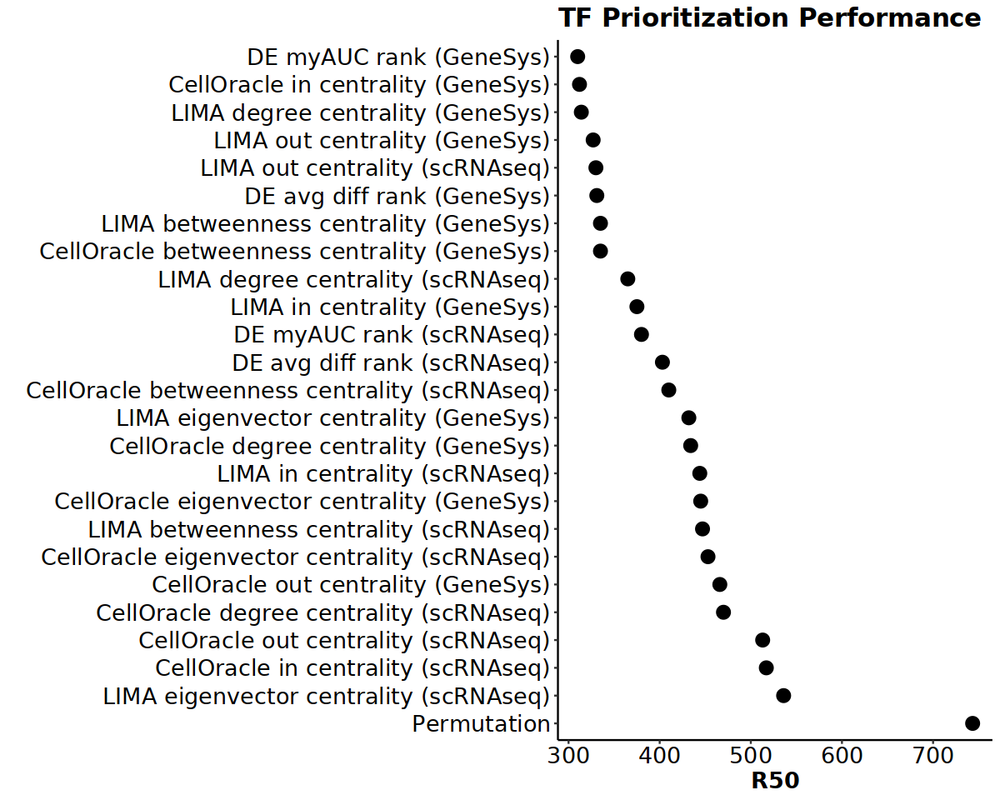

In [98]:
options(repr.plot.width=10, repr.plot.height=8)
ggplot(toplt, aes(x=reorder(Methods, R50, decreasing = TRUE),  y=R50)) + geom_point(size=4)+ 
  labs(title="TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

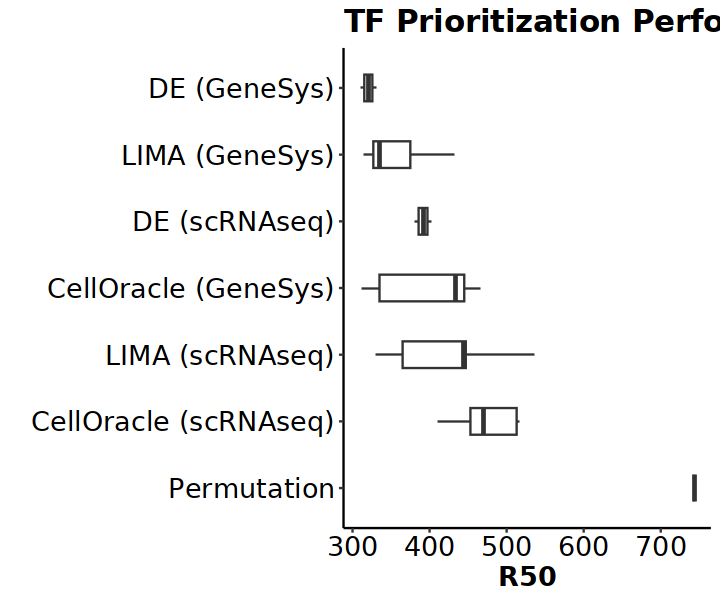

In [99]:
toplt <- data.frame(Methods=factor(c(rep("LIMA (GeneSys)",5), rep("LIMA (scRNAseq)",5), rep("CellOracle (scRNAseq)",5), rep("CellOracle (GeneSys)",5), rep("DE (scRNAseq)",2), rep("DE (GeneSys)",2), "Permutation"), 
                                   levels=c("Permutation", "CellOracle (scRNAseq)", "LIMA (scRNAseq)", "CellOracle (GeneSys)", "DE (scRNAseq)", "LIMA (GeneSys)", "DE (GeneSys)")), R50=toplt$R50)

options(repr.plot.width=6, repr.plot.height=5)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.4)+ 
  labs(title="TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

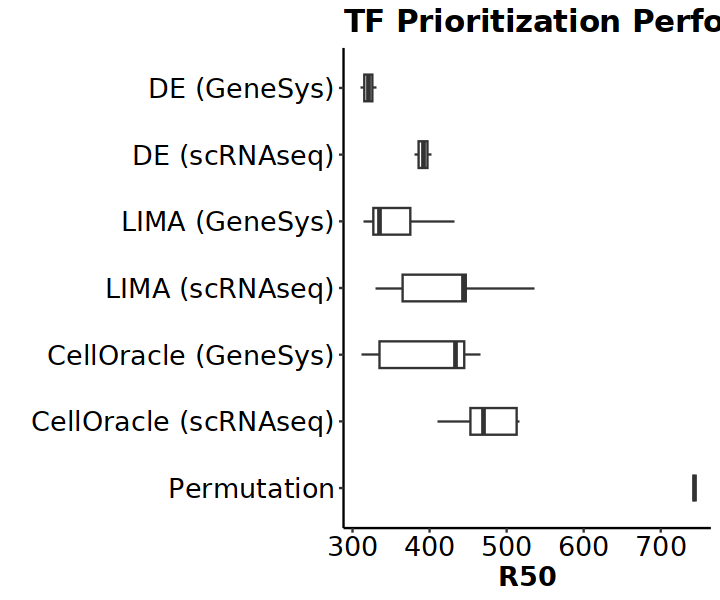

In [100]:
toplt <- data.frame(Methods=factor(c(rep("LIMA (GeneSys)",5), rep("LIMA (scRNAseq)",5), rep("CellOracle (scRNAseq)",5), rep("CellOracle (GeneSys)",5), rep("DE (scRNAseq)",2), rep("DE (GeneSys)",2), "Permutation"), 
                                   levels=c("Permutation", "CellOracle (scRNAseq)", "CellOracle (GeneSys)", "LIMA (scRNAseq)", "LIMA (GeneSys)", "DE (scRNAseq)", "DE (GeneSys)")), R50=toplt$R50)

options(repr.plot.width=6, repr.plot.height=5)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.4)+ 
  labs(title="TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

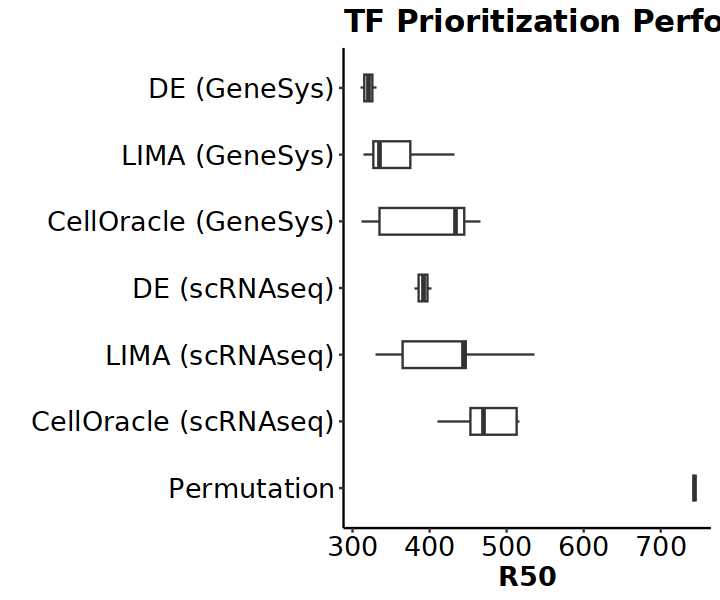

In [101]:
toplt <- data.frame(Methods=factor(c(rep("LIMA (GeneSys)",5), rep("LIMA (scRNAseq)",5), rep("CellOracle (scRNAseq)",5), rep("CellOracle (GeneSys)",5), rep("DE (scRNAseq)",2), rep("DE (GeneSys)",2), "Permutation"), 
                                   levels=c("Permutation", "CellOracle (scRNAseq)", "LIMA (scRNAseq)", "DE (scRNAseq)", "CellOracle (GeneSys)", "LIMA (GeneSys)", "DE (GeneSys)")), R50=toplt$R50)

options(repr.plot.width=6, repr.plot.height=5)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.4)+ 
  labs(title="TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

## R50 for Tissue specific TFs

#### Stele (xylem, phloem, procambium) 

In [102]:
gsgo_miniex_stringdb <- gsgo

In [103]:
gsgo <- read.csv("./Gold_Standard_Root_TF_StringDB.csv", header=TRUE)
gsgo <- gsgo[which(gsgo[,5]=="Yes"),]
gsgo$preferredName
gsgo <- gsgo$GeneID
gsgo <- intersect(gsgo, gsgo_miniex_stringdb)

[1] "APL"    "ATHB-8" "BHLH48" "DAR2"   "DOF5.3" "DOF5.6" "DOT2"   "ERF104"
 [9] "ET2"    "GATA12" "KAN1"   "KNAT7"  "LBD15"  "LBD18"  "LBD30"  "LBD4"  
[17] "LHW"    "MYB20"  "MYB32"  "MYB43"  "MYB46"  "MYB52"  "MYB61"  "MYB7"  
[25] "MYB83"  "MYB85"  "NAC005" "NAC007" "NAC010" "NAC026" "NAC030" "NAC037"
[33] "NAC043" "NAC045" "NAC075" "NAC076" "NAC083" "NAC086" "NAC101" "NAC104"
[41] "NAC105" "REV"    "WOX14"

In [104]:
length(gsgo)

[1] 32

In [105]:
r50 <- 16 

In [106]:
## Define genesys
run_r50_genesys <- function(x){
    genesys$ct_score <- min_max_normalize(rowSums(apply(genesys[,grep(paste0('xyl_',x,'|phl_',x,'|pro_',x),colnames(genesys))],2,as.numeric)))
    genesys$combined_score <- genesys$ct_score
    
    genesys <- genesys %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(genesys))){
        if (genesys$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [107]:
## Define raw
run_r50_scRNAseq <- function(x){
    raw$ct_score <- min_max_normalize(rowSums(apply(raw[,grep(paste0('xyl_',x,'|phl_',x,'|pro_',x),colnames(raw))],2,as.numeric)))
    raw$combined_score <- raw$ct_score
    
    raw <- raw %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(raw))){
        if (raw$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [108]:
## Define celloracle
pro <- prepros("../celloracle/procambium_X_root_integrated_celloracle_gene_score_iGRN.csv")
xyl <- prepros("../celloracle/xylem_X_root_integrated_celloracle_gene_score_iGRN.csv")
phl <- prepros("../celloracle/phloem_X_root_integrated_celloracle_gene_score_iGRN.csv")
## Define celloracle
dat <- rbind(pro, xyl, phl)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:6],2,min_max_normalize))

celloracle_scRNAseq <- dat

## Define celloracle
pro <- prepros("../celloracle/procambium_P_root_integrated_celloracle_gene_score_iGRN.csv")
xyl <- prepros("../celloracle/xylem_P_root_integrated_celloracle_gene_score_iGRN.csv")
phl <- prepros("../celloracle/phloem_P_root_integrated_celloracle_gene_score_iGRN.csv")
## Define celloracle
dat <- rbind(pro, xyl, phl)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:6],2,min_max_normalize))

celloracle_GeneSys <- dat

run_r50_celloracle <- function(x, dat){
    celloracle <- dat
    celloracle$combined_score <- celloracle[,grep(x,colnames(celloracle))]
    celloracle <- celloracle %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(celloracle))){
        if (celloracle$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 


In [109]:
de <- read.csv("Input_X_root_markers_ROC.csv")

In [110]:
## Define DE
de <- read.csv("Input_X_root_markers_ROC.csv")
de <- de[c(grep("Xylem",de$cluster),grep("Phloem",de$cluster),grep("Procambium",de$cluster)),]
de <- de[!is.na(match(de$gene,exptf)),]
dat <- de %>% group_by(gene) %>% reframe(myAUC_rank = mean(myAUC_rank),avg_diff_rank = mean(avg_diff_rank))
colnames(dat) <- c("GeneID","myAUC_rank","avg_diff_rank")
de_scRNAseq <- dat

In [111]:
de <- read.csv("GeneSys_P_root_markers_ROC.csv")
de <- de[c(grep("Xylem",de$cluster),grep("Phloem",de$cluster),grep("Procambium",de$cluster)),]
de <- de[!is.na(match(de$gene,exptf)),]
dat <- de %>% group_by(gene) %>% reframe(myAUC_rank = mean(myAUC_rank),avg_diff_rank = mean(avg_diff_rank))
colnames(dat) <- c("GeneID","myAUC_rank","avg_diff_rank")
de_GeneSys <- dat

In [112]:
run_r50_de <- function(x, dat){
    de <- dat
    de$combined_score <- de[,grep(x,colnames(de))]
    de <- de %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(de))){
        if (de$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [113]:
## Expressed TFs permutation
R50_permutation <- c()
for (j in 1:1000){
ran <- sample(exptf, length(exptf), replace=FALSE)
count <- 0
for (i in seq(length(ran))){
    if (ran[i] %in% gsgo){
        count <- count +1
        if (count == r50){
            R50_permutation <- c(R50_permutation,i)
            break
        }
    }
}
} 

In [114]:
toplt <- data.frame(Methods=c("LIMA degree centrality (GeneSys)", "LIMA out centrality (GeneSys)", "LIMA in centrality (GeneSys)", "LIMA betweenness centrality (GeneSys)", 
                 "LIMA eigenvector centrality (GeneSys)","LIMA degree centrality (scRNAseq)", "LIMA out centrality (scRNAseq)", "LIMA in centrality (scRNAseq)", "LIMA betweenness centrality (scRNAseq)", 
                "LIMA eigenvector centrality (scRNAseq)", "CellOracle degree centrality (scRNAseq)", "CellOracle out centrality (scRNAseq)", 
                 "CellOracle in centrality (scRNAseq)", "CellOracle betweenness centrality (scRNAseq)", "CellOracle eigenvector centrality (scRNAseq)",
                 "CellOracle degree centrality (GeneSys)", "CellOracle out centrality (GeneSys)", 
                 "CellOracle in centrality (GeneSys)", "CellOracle betweenness centrality (GeneSys)", "CellOracle eigenvector centrality (GeneSys)",
                 "DE myAUC rank (scRNAseq)", "DE avg diff rank (scRNAseq)", "DE myAUC rank (GeneSys)", "DE avg diff rank (GeneSys)", "Permutation"),
           R50=c(run_r50_genesys('degree_centrality'),run_r50_genesys('out_centrality'),run_r50_genesys('in_centrality'),
                 run_r50_genesys('betweenness_centrality'),run_r50_genesys('eigenvector_centrality'),
                 run_r50_scRNAseq('degree_centrality'),run_r50_scRNAseq('out_centrality'),run_r50_scRNAseq('in_centrality'),
                 run_r50_scRNAseq('betweenness_centrality'),run_r50_scRNAseq('eigenvector_centrality'),
                 run_r50_celloracle('degree_centrality', celloracle_scRNAseq),run_r50_celloracle('out_centrality', celloracle_scRNAseq),run_r50_celloracle('in_centrality', celloracle_scRNAseq),
                 run_r50_celloracle('betweenness_centrality', celloracle_scRNAseq),run_r50_celloracle('eigenvector_centrality', celloracle_scRNAseq),
                 run_r50_celloracle('degree_centrality', celloracle_GeneSys),run_r50_celloracle('out_centrality', celloracle_GeneSys),run_r50_celloracle('in_centrality', celloracle_GeneSys),
                 run_r50_celloracle('betweenness_centrality', celloracle_GeneSys),run_r50_celloracle('eigenvector_centrality', celloracle_GeneSys),
                 run_r50_de('myAUC_rank', de_scRNAseq),run_r50_de('avg_diff_rank', de_scRNAseq),run_r50_de('myAUC_rank', de_GeneSys),run_r50_de('avg_diff_rank', de_GeneSys), mean(R50_permutation)))

In [115]:
toplt

Methods,R50
<chr>,<dbl>
LIMA degree centrality (GeneSys),125.000
LIMA out centrality (GeneSys),86.000
LIMA in centrality (GeneSys),205.000
LIMA betweenness centrality (GeneSys),119.000
LIMA eigenvector centrality (GeneSys),165.000
LIMA degree centrality (scRNAseq),122.000
LIMA out centrality (scRNAseq),86.000
LIMA in centrality (scRNAseq),164.000
LIMA betweenness centrality (scRNAseq),200.000


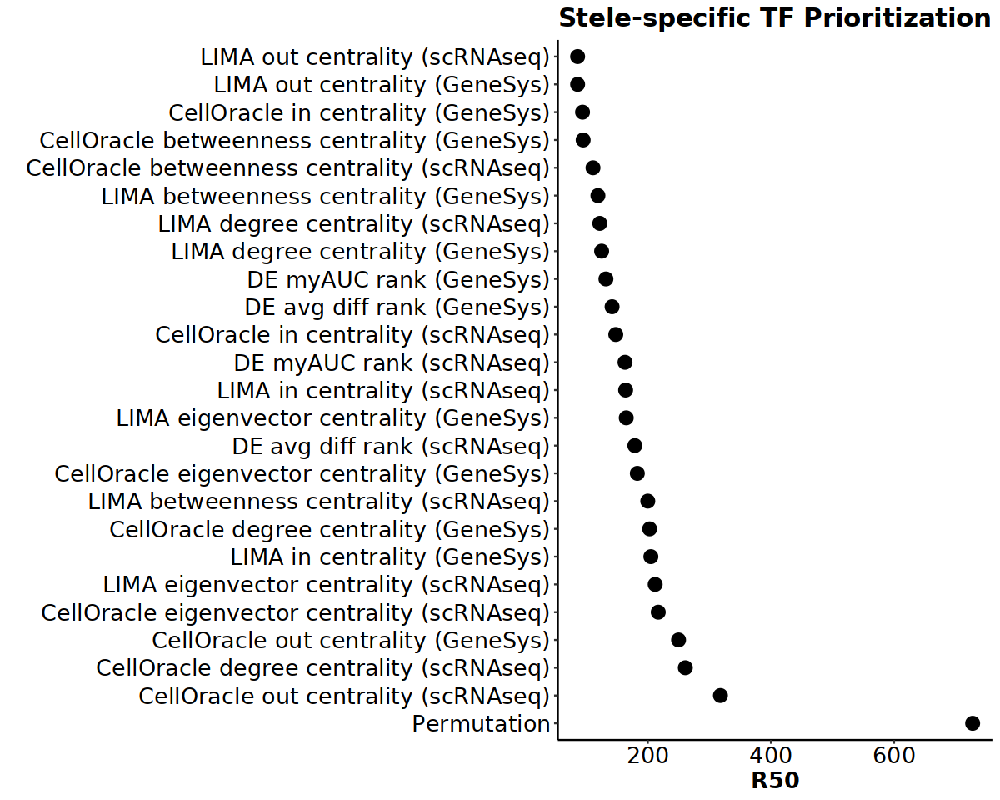

In [116]:
options(repr.plot.width=10, repr.plot.height=8)
ggplot(toplt, aes(x=reorder(Methods, R50, decreasing = TRUE),  y=R50)) + geom_point(size=4)+ 
  labs(title="Stele-specific TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

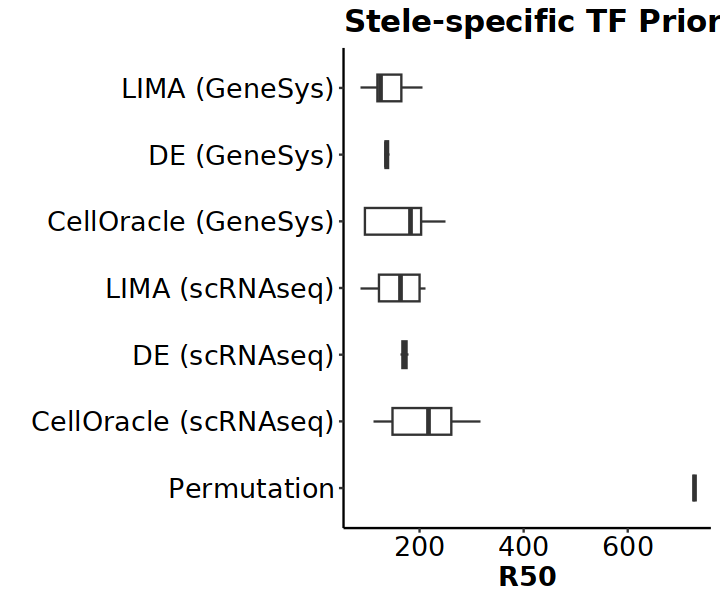

In [117]:
toplt <- data.frame(Methods=factor(c(rep("LIMA (GeneSys)",5), rep("LIMA (scRNAseq)",5), rep("CellOracle (scRNAseq)",5), rep("CellOracle (GeneSys)",5), rep("DE (scRNAseq)",2), rep("DE (GeneSys)",2), "Permutation"), 
                                   levels=c("Permutation", "CellOracle (scRNAseq)", "DE (scRNAseq)", "LIMA (scRNAseq)", "CellOracle (GeneSys)", "DE (GeneSys)", "LIMA (GeneSys)")), R50=toplt$R50)

options(repr.plot.width=6, repr.plot.height=5)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.4)+ 
  labs(title="Stele-specific TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

#### Epidermis

In [118]:
gsgo <- read.csv("./Gold_Standard_Root_TF_StringDB.csv", header=TRUE)
gsgo <- gsgo[which(gsgo[,6]=="Yes"),]
gsgo$preferredName
gsgo <- gsgo$GeneID
gsgo <- intersect(gsgo, gsgo_miniex_stringdb)

[1] "AGL16"  "AL6"    "ANL2"   "BHLH12" "BHLH2"  "BHLH32" "BHLH54" "BHLH66"
 [9] "BHLH69" "BHLH82" "BHLH83" "BHLH85" "BHLH86" "CPC"    "E2FB"   "ETC1"  
[17] "GALT2"  "GIS3"   "GL2"    "GL3"    "GTL1"   "HDG11"  "HDG12"  "HDG2"  
[25] "JMJ25"  "MAMYB"  "MYB124" "MYB23"  "MYB86"  "MYB88"  "MYC3"   "MYC4"  
[33] "RBR1"   "SCL22"  "SCL27"  "SCL6"   "SCRM"   "TCX2"   "TCX3"   "TRY"   
[41] "TSO1"   "TTG1"   "WER"    "WRKY44" "WRKY75" "ZFP5"   "ZFP6"   "ZFP8"

In [119]:
## R35
length(gsgo)
r50 <- 13

[1] 37

In [120]:
## Define genesys
run_r50_genesys <- function(x){
    genesys$ct_score <- min_max_normalize(rowSums(apply(genesys[,grep(paste0('atri_',x,'|tri_',x,'|lrc_',x),colnames(genesys))],2,as.numeric)))
    genesys$combined_score <- genesys$ct_score
    
    genesys <- genesys %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(genesys))){
        if (genesys$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [121]:
## Define raw
run_r50_scRNAseq <- function(x){
    raw$ct_score <- min_max_normalize(rowSums(apply(raw[,grep(paste0('atri_',x,'|tri_',x,'|lrc_',x),colnames(raw))],2,as.numeric)))
    raw$combined_score <- raw$ct_score
    
    raw <- raw %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(raw))){
        if (raw$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [122]:
## Define celloracle
atri <- prepros("../celloracle/atrichoblast_X_root_integrated_celloracle_gene_score_iGRN.csv")
tri <- prepros("../celloracle/trichoblast_X_root_integrated_celloracle_gene_score_iGRN.csv")
lrc <- prepros("../celloracle/lrc_X_root_integrated_celloracle_gene_score_iGRN.csv")
## Define celloracle
dat <- rbind(atri, tri, lrc)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:6],2,min_max_normalize))

celloracle_scRNAseq <- dat

## Define celloracle
atri <- prepros("../celloracle/atrichoblast_P_root_integrated_celloracle_gene_score_iGRN.csv")
tri <- prepros("../celloracle/trichoblast_P_root_integrated_celloracle_gene_score_iGRN.csv")
lrc <- prepros("../celloracle/lrc_P_root_integrated_celloracle_gene_score_iGRN.csv")
## Define celloracle
dat <- rbind(atri, tri, lrc)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:6],2,min_max_normalize))

celloracle_GeneSys <- dat

run_r50_celloracle <- function(x, dat){
    celloracle <- dat
    celloracle$combined_score <- celloracle[,grep(x,colnames(celloracle))]
    celloracle <- celloracle %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(celloracle))){
        if (celloracle$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 


In [123]:
## Define DE
de <- read.csv("Input_X_root_markers_ROC.csv")
de <- de[c(grep("Atrichoblast",de$cluster),grep("Trichoblast",de$cluster),grep("Lateral Root Cap",de$cluster)),]
de <- de[!is.na(match(de$gene,exptf)),]
dat <- de %>% group_by(gene) %>% reframe(myAUC_rank = mean(myAUC_rank),avg_diff_rank = mean(avg_diff_rank))
colnames(dat) <- c("GeneID","myAUC_rank","avg_diff_rank")
de_scRNAseq <- dat

de <- read.csv("GeneSys_P_root_markers_ROC.csv")
de <- de[c(grep("Atrichoblast",de$cluster),grep("Trichoblast",de$cluster),grep("Lateral Root Cap",de$cluster)),]
de <- de[!is.na(match(de$gene,exptf)),]
dat <- de %>% group_by(gene) %>% reframe(myAUC_rank = mean(myAUC_rank),avg_diff_rank = mean(avg_diff_rank))
colnames(dat) <- c("GeneID","myAUC_rank","avg_diff_rank")
de_GeneSys <- dat

run_r50_de <- function(x, dat){
    de <- dat
    de$combined_score <- de[,grep(x,colnames(de))]
    de <- de %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(de))){
        if (de$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [124]:
## Expressed TFs permutation
R50_permutation <- c()
for (j in 1:1000){
ran <- sample(exptf, length(exptf), replace=FALSE)
count <- 0
for (i in seq(length(ran))){
    if (ran[i] %in% gsgo){
        count <- count +1
        if (count == r50){
            R50_permutation <- c(R50_permutation,i)
            break
        }
    }
}
} 

In [125]:
length(intersect(de_GeneSys$GeneID, gsgo))

[1] 13

In [126]:
toplt <- data.frame(Methods=c("LIMA degree centrality (GeneSys)", "LIMA out centrality (GeneSys)", "LIMA in centrality (GeneSys)", "LIMA betweenness centrality (GeneSys)", 
                 "LIMA eigenvector centrality (GeneSys)","LIMA degree centrality (scRNAseq)", "LIMA out centrality (scRNAseq)", "LIMA in centrality (scRNAseq)", "LIMA betweenness centrality (scRNAseq)", 
                "LIMA eigenvector centrality (scRNAseq)", "CellOracle degree centrality (scRNAseq)", "CellOracle out centrality (scRNAseq)", 
                 "CellOracle in centrality (scRNAseq)", "CellOracle betweenness centrality (scRNAseq)", "CellOracle eigenvector centrality (scRNAseq)",
                 "CellOracle degree centrality (GeneSys)", "CellOracle out centrality (GeneSys)", 
                 "CellOracle in centrality (GeneSys)", "CellOracle betweenness centrality (GeneSys)", "CellOracle eigenvector centrality (GeneSys)",
                 "DE myAUC rank (scRNAseq)", "DE avg diff rank (scRNAseq)", "DE myAUC rank (GeneSys)", "DE avg diff rank (GeneSys)", "Permutation"),
           R50=c(run_r50_genesys('degree_centrality'),run_r50_genesys('out_centrality'),run_r50_genesys('in_centrality'),
                 run_r50_genesys('betweenness_centrality'),run_r50_genesys('eigenvector_centrality'),
                 run_r50_scRNAseq('degree_centrality'),run_r50_scRNAseq('out_centrality'),run_r50_scRNAseq('in_centrality'),
                 run_r50_scRNAseq('betweenness_centrality'),run_r50_scRNAseq('eigenvector_centrality'),
                 run_r50_celloracle('degree_centrality', celloracle_scRNAseq),run_r50_celloracle('out_centrality', celloracle_scRNAseq),run_r50_celloracle('in_centrality', celloracle_scRNAseq),
                 run_r50_celloracle('betweenness_centrality', celloracle_scRNAseq),run_r50_celloracle('eigenvector_centrality', celloracle_scRNAseq),
                 run_r50_celloracle('degree_centrality', celloracle_GeneSys),run_r50_celloracle('out_centrality', celloracle_GeneSys),run_r50_celloracle('in_centrality', celloracle_GeneSys),
                 run_r50_celloracle('betweenness_centrality', celloracle_GeneSys),run_r50_celloracle('eigenvector_centrality', celloracle_GeneSys),
                 run_r50_de('myAUC_rank', de_scRNAseq),run_r50_de('avg_diff_rank', de_scRNAseq),run_r50_de('myAUC_rank', de_GeneSys),run_r50_de('avg_diff_rank', de_GeneSys), mean(R50_permutation)))

In [127]:
toplt

Methods,R50
<chr>,<dbl>
LIMA degree centrality (GeneSys),105.000
LIMA out centrality (GeneSys),148.000
LIMA in centrality (GeneSys),108.000
LIMA betweenness centrality (GeneSys),81.000
LIMA eigenvector centrality (GeneSys),142.000
LIMA degree centrality (scRNAseq),112.000
LIMA out centrality (scRNAseq),120.000
LIMA in centrality (scRNAseq),142.000
LIMA betweenness centrality (scRNAseq),100.000


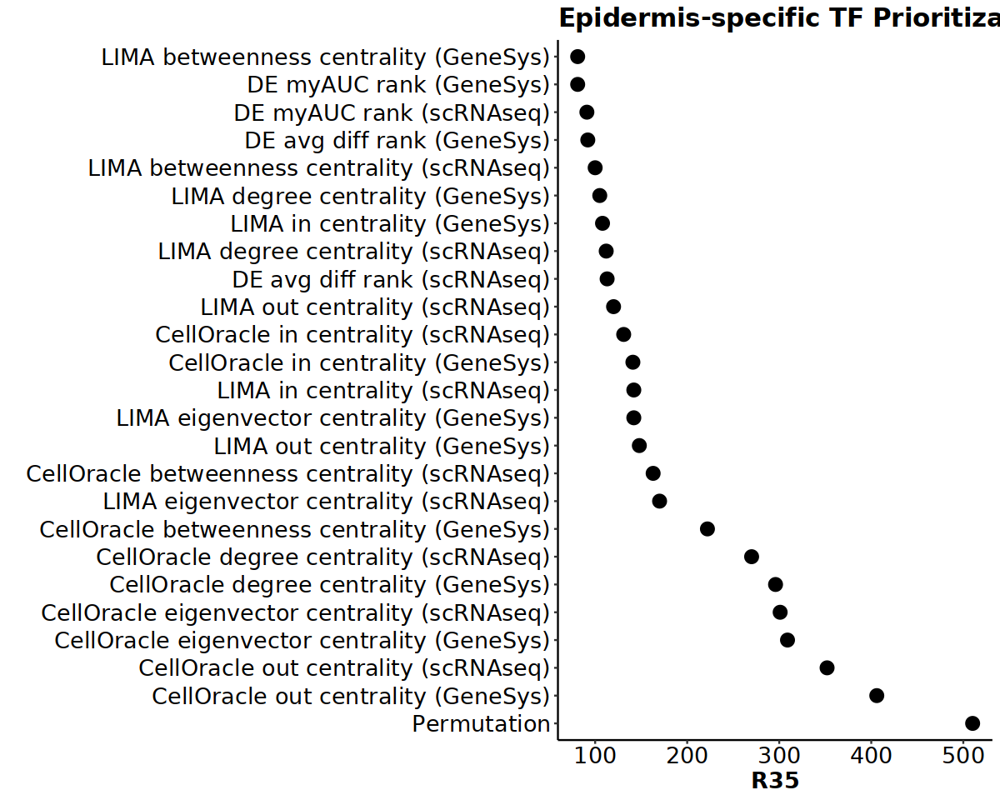

In [128]:
options(repr.plot.width=10, repr.plot.height=8)
ggplot(toplt, aes(x=reorder(Methods, R50, decreasing = TRUE),  y=R50)) + geom_point(size=4)+ 
  labs(title="Epidermis-specific TF Prioritization Performance",x="", y = "R35")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

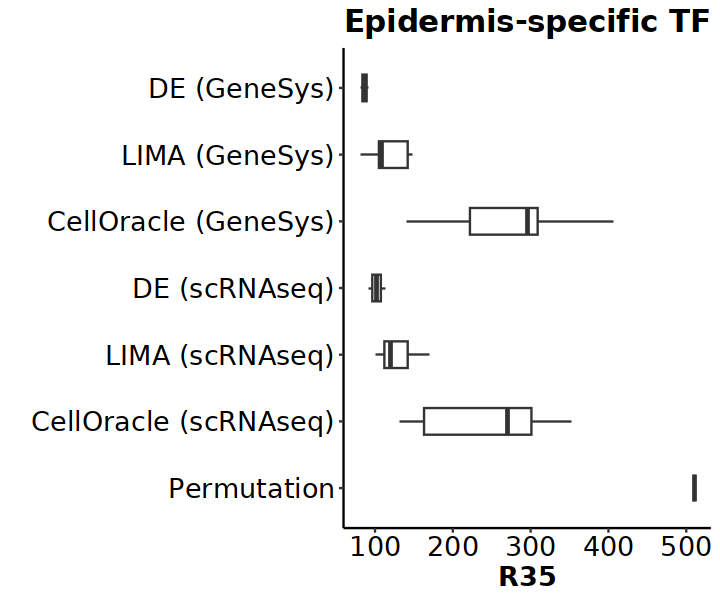

In [129]:
toplt <- data.frame(Methods=factor(c(rep("LIMA (GeneSys)",5), rep("LIMA (scRNAseq)",5), rep("CellOracle (scRNAseq)",5), rep("CellOracle (GeneSys)",5), rep("DE (scRNAseq)",2), rep("DE (GeneSys)",2), "Permutation"), 
                                   levels=c("Permutation", "CellOracle (scRNAseq)", "LIMA (scRNAseq)", "DE (scRNAseq)", "CellOracle (GeneSys)", "LIMA (GeneSys)", "DE (GeneSys)")), R50=toplt$R50)

options(repr.plot.width=6, repr.plot.height=5)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.4)+ 
  labs(title="Epidermis-specific TF Prioritization Performance",x="", y = "R35")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

## R50 for celltype specific

#### Xylem

In [130]:
gsgo <- read.csv("./Gold_Standard_Root_TF_StringDB.csv", header=TRUE)
gsgo <- gsgo[which(gsgo[,7]=="Yes"),]
gsgo$preferredName
gsgo <- gsgo$GeneID
gsgo <- intersect(gsgo, gsgo_miniex_stringdb)

[1] "APL"    "ATHB-8" "BHLH48" "ET2"    "KNAT7"  "LBD18"  "LBD30"  "LHW"   
 [9] "MYB20"  "MYB32"  "MYB43"  "MYB46"  "MYB52"  "MYB61"  "MYB7"   "MYB83" 
[17] "MYB85"  "NAC005" "NAC007" "NAC010" "NAC026" "NAC030" "NAC037" "NAC043"
[25] "NAC076" "NAC083" "NAC101" "NAC104" "NAC105" "REV"

In [131]:
length(gsgo)
r50 <- 10

[1] 19

In [132]:
## Define genesys
run_r50_genesys <- function(x){
    genesys$ct_score <- min_max_normalize(rowSums(apply(genesys[,grep(paste0('xyl_',x),colnames(genesys))],2,as.numeric)))
    genesys$combined_score <- genesys$ct_score
    
    genesys <- genesys %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(genesys))){
        if (genesys$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [133]:
## Define genesys
run_r50_scRNAseq <- function(x){
    raw$ct_score <- min_max_normalize(rowSums(apply(raw[,grep(paste0('xyl_',x),colnames(raw))],2,as.numeric)))
    raw$combined_score <- raw$ct_score
    
    raw <- raw %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(raw))){
        if (raw$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [134]:
## Define celloracle
xyl <- prepros("../celloracle/xylem_X_root_integrated_celloracle_gene_score_iGRN.csv")
## Define celloracle
dat <- rbind(xyl)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:6],2,min_max_normalize))

celloracle_scRNAseq <- dat

## Define celloracle
xyl <- prepros("../celloracle/xylem_P_root_integrated_celloracle_gene_score_iGRN.csv")
## Define celloracle
dat <- rbind(xyl)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:6],2,min_max_normalize))

celloracle_GeneSys <- dat

run_r50_celloracle <- function(x, dat){
    celloracle <- dat
    celloracle$combined_score <- celloracle[,grep(x,colnames(celloracle))]
    celloracle <- celloracle %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(celloracle))){
        if (celloracle$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 


In [135]:
## Define DE
de <- read.csv("Input_X_root_markers_ROC.csv")
de <- de[c(grep("Xylem",de$cluster)),]
de <- de[!is.na(match(de$gene,exptf)),]
dat <- de %>% group_by(gene) %>% reframe(myAUC_rank = mean(myAUC_rank),avg_diff_rank = mean(avg_diff_rank))
colnames(dat) <- c("GeneID","myAUC_rank","avg_diff_rank")
de_scRNAseq <- dat

de <- read.csv("GeneSys_P_root_markers_ROC.csv")
de <- de[c(grep("Xylem",de$cluster)),]
de <- de[!is.na(match(de$gene,exptf)),]
dat <- de %>% group_by(gene) %>% reframe(myAUC_rank = mean(myAUC_rank),avg_diff_rank = mean(avg_diff_rank))
colnames(dat) <- c("GeneID","myAUC_rank","avg_diff_rank")
de_GeneSys <- dat

run_r50_de <- function(x, dat){
    de <- dat
    de$combined_score <- de[,grep(x,colnames(de))]
    de <- de %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(de))){
        if (de$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [136]:
## Expressed TFs permutation
R50_permutation <- c()
for (j in 1:1000){
ran <- sample(exptf, length(exptf), replace=FALSE)
count <- 0
for (i in seq(length(ran))){
    if (ran[i] %in% gsgo){
        count <- count +1
        if (count == r50){
            R50_permutation <- c(R50_permutation,i)
            break
        }
    }
}
} 

In [137]:
toplt <- data.frame(Methods=c("LIMA degree centrality (GeneSys)", "LIMA out centrality (GeneSys)", "LIMA in centrality (GeneSys)", "LIMA betweenness centrality (GeneSys)", 
                 "LIMA eigenvector centrality (GeneSys)","LIMA degree centrality (scRNAseq)", "LIMA out centrality (scRNAseq)", "LIMA in centrality (scRNAseq)", "LIMA betweenness centrality (scRNAseq)", 
                "LIMA eigenvector centrality (scRNAseq)", "CellOracle degree centrality (scRNAseq)", "CellOracle out centrality (scRNAseq)", 
                 "CellOracle in centrality (scRNAseq)", "CellOracle betweenness centrality (scRNAseq)", "CellOracle eigenvector centrality (scRNAseq)",
                 "CellOracle degree centrality (GeneSys)", "CellOracle out centrality (GeneSys)", 
                 "CellOracle in centrality (GeneSys)", "CellOracle betweenness centrality (GeneSys)", "CellOracle eigenvector centrality (GeneSys)",
                 "DE myAUC rank (scRNAseq)", "DE avg diff rank (scRNAseq)", "DE myAUC rank (GeneSys)", "DE avg diff rank (GeneSys)", "Permutation"),
           R50=c(run_r50_genesys('degree_centrality'),run_r50_genesys('out_centrality'),run_r50_genesys('in_centrality'),
                 run_r50_genesys('betweenness_centrality'),run_r50_genesys('eigenvector_centrality'),
                 run_r50_scRNAseq('degree_centrality'),run_r50_scRNAseq('out_centrality'),run_r50_scRNAseq('in_centrality'),
                 run_r50_scRNAseq('betweenness_centrality'),run_r50_scRNAseq('eigenvector_centrality'),
                 run_r50_celloracle('degree_centrality', celloracle_scRNAseq),run_r50_celloracle('out_centrality', celloracle_scRNAseq),run_r50_celloracle('in_centrality', celloracle_scRNAseq),
                 run_r50_celloracle('betweenness_centrality', celloracle_scRNAseq),run_r50_celloracle('eigenvector_centrality', celloracle_scRNAseq),
                 run_r50_celloracle('degree_centrality', celloracle_GeneSys),run_r50_celloracle('out_centrality', celloracle_GeneSys),run_r50_celloracle('in_centrality', celloracle_GeneSys),
                 run_r50_celloracle('betweenness_centrality', celloracle_GeneSys),run_r50_celloracle('eigenvector_centrality', celloracle_GeneSys),
                 run_r50_de('myAUC_rank', de_scRNAseq),run_r50_de('avg_diff_rank', de_scRNAseq),run_r50_de('myAUC_rank', de_GeneSys),run_r50_de('avg_diff_rank', de_GeneSys), mean(R50_permutation)))

In [138]:
toplt

Methods,R50
<chr>,<dbl>
LIMA degree centrality (GeneSys),21.000
LIMA out centrality (GeneSys),19.000
LIMA in centrality (GeneSys),42.000
LIMA betweenness centrality (GeneSys),52.000
LIMA eigenvector centrality (GeneSys),23.000
LIMA degree centrality (scRNAseq),22.000
LIMA out centrality (scRNAseq),22.000
LIMA in centrality (scRNAseq),25.000
LIMA betweenness centrality (scRNAseq),107.000


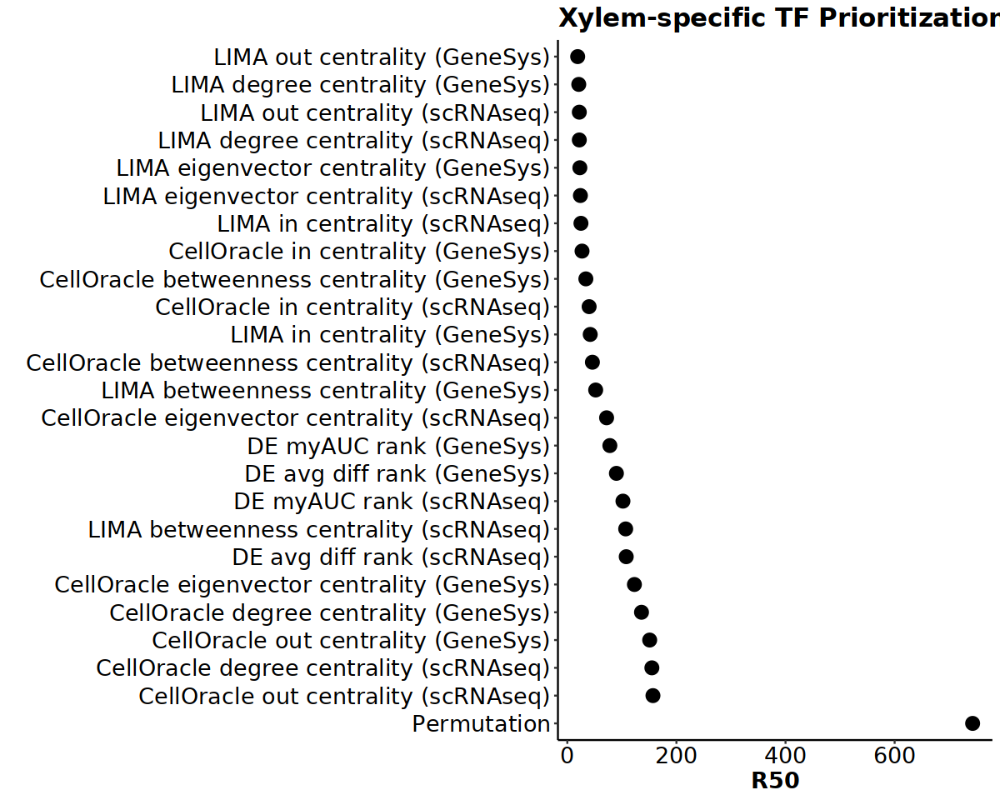

In [139]:
options(repr.plot.width=10, repr.plot.height=8)
ggplot(toplt, aes(x=reorder(Methods, R50, decreasing = TRUE),  y=R50)) + geom_point(size=4)+ 
  labs(title="Xylem-specific TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

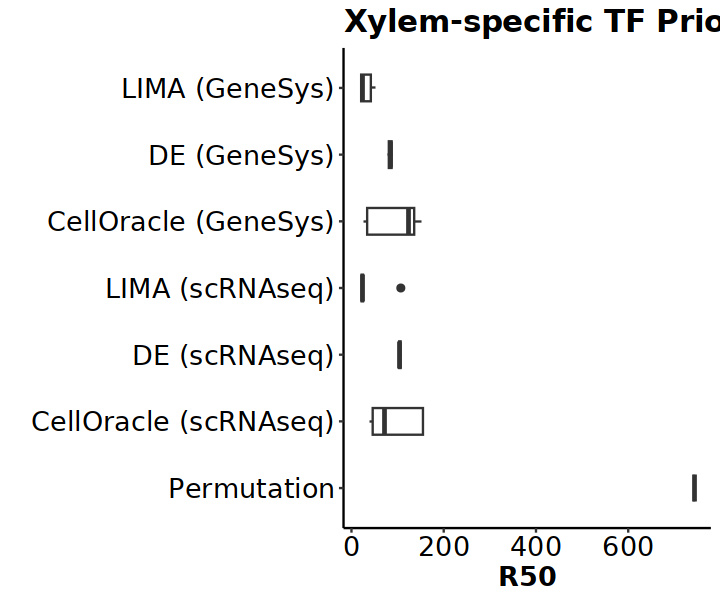

In [140]:
toplt <- data.frame(Methods=factor(c(rep("LIMA (GeneSys)",5), rep("LIMA (scRNAseq)",5), rep("CellOracle (scRNAseq)",5), rep("CellOracle (GeneSys)",5), rep("DE (scRNAseq)",2), rep("DE (GeneSys)",2), "Permutation"), 
                                   levels=c("Permutation", "CellOracle (scRNAseq)", "DE (scRNAseq)", "LIMA (scRNAseq)", "CellOracle (GeneSys)", "DE (GeneSys)", "LIMA (GeneSys)")), R50=toplt$R50)

options(repr.plot.width=6, repr.plot.height=5)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.4)+ 
  labs(title="Xylem-specific TF Prioritization Performance",x="", y = "R50")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

#### Trichoblast

In [141]:
gsgo <- read.csv("./Gold_Standard_Root_TF_StringDB.csv", header=TRUE)
gsgo <- gsgo[which(gsgo[,8]=="Yes"),]
gsgo$preferredName
gsgo <- gsgo$GeneID
gsgo <- intersect(gsgo, gsgo_miniex_stringdb)

[1] "AL6"    "ANL2"   "BHLH12" "BHLH2"  "BHLH32" "BHLH54" "BHLH66" "BHLH69"
 [9] "BHLH82" "BHLH83" "BHLH85" "BHLH86" "CPC"    "E2FB"   "ETC1"   "GALT2" 
[17] "GIS3"   "GL2"    "GL3"    "GTL1"   "HDG11"  "HDG12"  "HDG2"   "MAMYB" 
[25] "MYB23"  "MYB86"  "RBR1"   "SCL22"  "SCL27"  "SCL6"   "TRY"    "TTG1"  
[33] "WER"    "ZFP5"   "ZFP6"   "ZFP8"

In [142]:
length(gsgo)
r50 <- 5

[1] 34

In [143]:
## Define genesys
run_r50_genesys <- function(x){
    genesys$ct_score <- min_max_normalize(rowSums(apply(genesys[,grep(paste0('^tri_',x),colnames(genesys))],2,as.numeric)))
    genesys$combined_score <- genesys$ct_score
    
    genesys <- genesys %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(genesys))){
        if (genesys$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [144]:
## Define raw
run_r50_scRNAseq <- function(x){
    raw$ct_score <- min_max_normalize(rowSums(apply(raw[,grep(paste0('^tri_',x),colnames(raw))],2,as.numeric)))
    raw$combined_score <- raw$ct_score
    
    raw <- raw %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(raw))){
        if (raw$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
}

In [145]:
## Define celloracle
tri <- prepros("../celloracle/trichoblast_X_root_integrated_celloracle_gene_score_iGRN.csv")
## Define celloracle
dat <- rbind(tri)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:6],2,min_max_normalize))

celloracle_scRNAseq <- dat

## Define celloracle
tri <- prepros("../celloracle/trichoblast_P_root_integrated_celloracle_gene_score_iGRN.csv")
## Define celloracle
dat <- rbind(tri)
## Remove those not present in the dataset
dat <- dat[!is.na(match(dat$X,exptf)),]
dat <- dat %>% group_by(cluster) %>% reframe(GeneID=X,degree_centrality = min_max_normalize(degree_centrality_all), 
                                  in_centrality = min_max_normalize(degree_centrality_in), 
                                  out_centrality = min_max_normalize(degree_centrality_out),
                                 betweenness_centrality = min_max_normalize(betweenness_centrality),
                                 eigenvector_centrality = min_max_normalize(eigenvector_centrality))
dat <- dat %>% group_by(GeneID) %>% reframe(degree_centrality = sum(degree_centrality), 
                                  in_centrality = sum(in_centrality), 
                                  out_centrality = sum(out_centrality),
                                 betweenness_centrality = sum(betweenness_centrality),
                                 eigenvector_centrality = sum(eigenvector_centrality))
dat <- cbind(dat[,1],apply(dat[,2:6],2,min_max_normalize))

celloracle_GeneSys <- dat

run_r50_celloracle <- function(x, dat){
    celloracle <- dat
    celloracle$combined_score <- celloracle[,grep(x,colnames(celloracle))]
    celloracle <- celloracle %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(celloracle))){
        if (celloracle$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 


In [146]:
## Define DE
de <- read.csv("Input_X_root_markers_ROC.csv")
de <- de[c(grep("Trichoblast",de$cluster)),]
de <- de[!is.na(match(de$gene,exptf)),]
dat <- de %>% group_by(gene) %>% reframe(myAUC_rank = mean(myAUC_rank),avg_diff_rank = mean(avg_diff_rank))
colnames(dat) <- c("GeneID","myAUC_rank","avg_diff_rank")
de_scRNAseq <- dat

de <- read.csv("GeneSys_P_root_markers_ROC.csv")
de <- de[c(grep("Trichoblast",de$cluster)),]
de <- de[!is.na(match(de$gene,exptf)),]
dat <- de %>% group_by(gene) %>% reframe(myAUC_rank = mean(myAUC_rank),avg_diff_rank = mean(avg_diff_rank))
colnames(dat) <- c("GeneID","myAUC_rank","avg_diff_rank")
de_GeneSys <- dat

run_r50_de <- function(x, dat){
    de <- dat
    de$combined_score <- de[,grep(x,colnames(de))]
    de <- de %>% arrange(desc(combined_score))
    count <- 0
    for (i in seq(nrow(de))){
        if (de$GeneID[i] %in% gsgo){
            count <- count +1
            if (count == r50){
                return(i)
                break
            }
        }
    }
} 

In [147]:
length(intersect(de_GeneSys$GeneID, gsgo))

[1] 6

In [148]:
## Expressed TFs permutation
R50_permutation <- c()
for (j in 1:1000){
ran <- sample(exptf, length(exptf), replace=FALSE)
count <- 0
for (i in seq(length(ran))){
    if (ran[i] %in% gsgo){
        count <- count +1
        if (count == r50){
            R50_permutation <- c(R50_permutation,i)
            break
        }
    }
}
} 

In [149]:
toplt <- data.frame(Methods=c("LIMA degree centrality (GeneSys)", "LIMA out centrality (GeneSys)", "LIMA in centrality (GeneSys)", "LIMA betweenness centrality (GeneSys)", 
                 "LIMA eigenvector centrality (GeneSys)","LIMA degree centrality (scRNAseq)", "LIMA out centrality (scRNAseq)", "LIMA in centrality (scRNAseq)", "LIMA betweenness centrality (scRNAseq)", 
                "LIMA eigenvector centrality (scRNAseq)", "CellOracle degree centrality (scRNAseq)", "CellOracle out centrality (scRNAseq)", 
                 "CellOracle in centrality (scRNAseq)", "CellOracle betweenness centrality (scRNAseq)", "CellOracle eigenvector centrality (scRNAseq)",
                 "CellOracle degree centrality (GeneSys)", "CellOracle out centrality (GeneSys)", 
                 "CellOracle in centrality (GeneSys)", "CellOracle betweenness centrality (GeneSys)", "CellOracle eigenvector centrality (GeneSys)",
                 "DE myAUC rank (scRNAseq)", "DE avg diff rank (scRNAseq)", "DE myAUC rank (GeneSys)", "DE avg diff rank (GeneSys)", "Permutation"),
           R50=c(run_r50_genesys('degree_centrality'),run_r50_genesys('out_centrality'),run_r50_genesys('in_centrality'),
                 run_r50_genesys('betweenness_centrality'),run_r50_genesys('eigenvector_centrality'),
                 run_r50_scRNAseq('degree_centrality'),run_r50_scRNAseq('out_centrality'),run_r50_scRNAseq('in_centrality'),
                 run_r50_scRNAseq('betweenness_centrality'),run_r50_scRNAseq('eigenvector_centrality'),
                 run_r50_celloracle('degree_centrality', celloracle_scRNAseq),run_r50_celloracle('out_centrality', celloracle_scRNAseq),run_r50_celloracle('in_centrality', celloracle_scRNAseq),
                 run_r50_celloracle('betweenness_centrality', celloracle_scRNAseq),run_r50_celloracle('eigenvector_centrality', celloracle_scRNAseq),
                 run_r50_celloracle('degree_centrality', celloracle_GeneSys),run_r50_celloracle('out_centrality', celloracle_GeneSys),run_r50_celloracle('in_centrality', celloracle_GeneSys),
                 run_r50_celloracle('betweenness_centrality', celloracle_GeneSys),run_r50_celloracle('eigenvector_centrality', celloracle_GeneSys),
                 run_r50_de('myAUC_rank', de_scRNAseq),run_r50_de('avg_diff_rank', de_scRNAseq),run_r50_de('myAUC_rank', de_GeneSys),run_r50_de('avg_diff_rank', de_GeneSys), mean(R50_permutation)))

In [150]:
toplt

Methods,R50
<chr>,<dbl>
LIMA degree centrality (GeneSys),20.000
LIMA out centrality (GeneSys),23.000
LIMA in centrality (GeneSys),31.000
LIMA betweenness centrality (GeneSys),19.000
LIMA eigenvector centrality (GeneSys),20.000
LIMA degree centrality (scRNAseq),20.000
LIMA out centrality (scRNAseq),22.000
LIMA in centrality (scRNAseq),26.000
LIMA betweenness centrality (scRNAseq),16.000


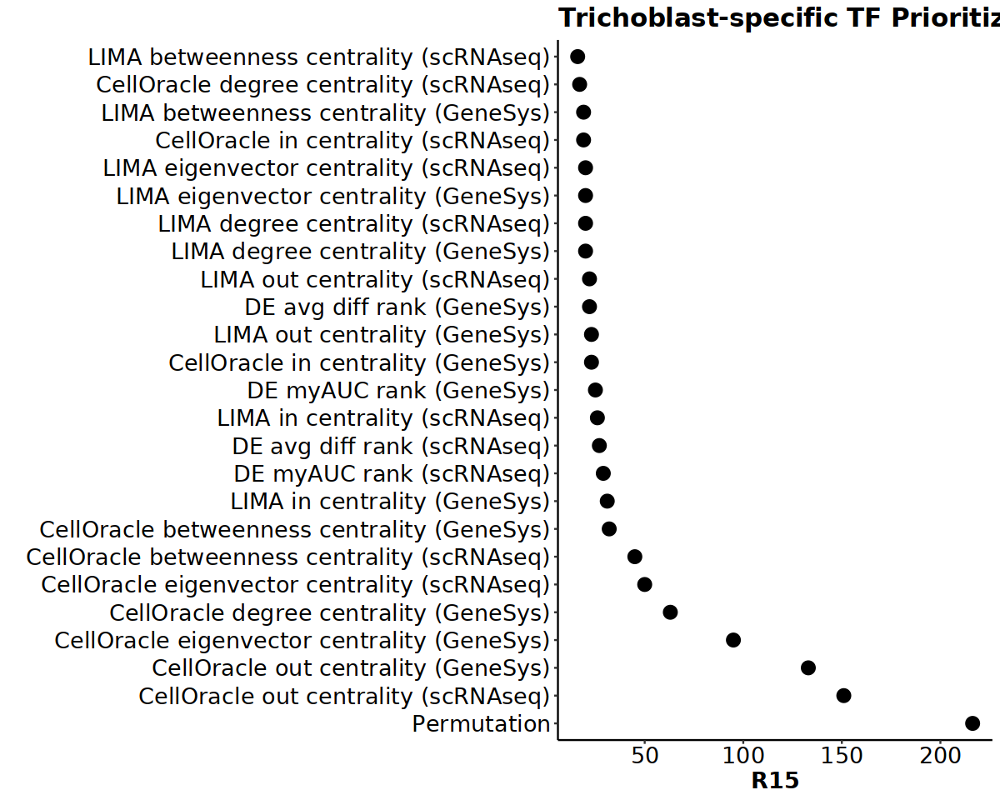

In [151]:
options(repr.plot.width=10, repr.plot.height=8)
ggplot(toplt, aes(x=reorder(Methods, R50, decreasing = TRUE),  y=R50)) + geom_point(size=4)+ 
  labs(title="Trichoblast-specific TF Prioritization Performance",x="", y = "R15")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

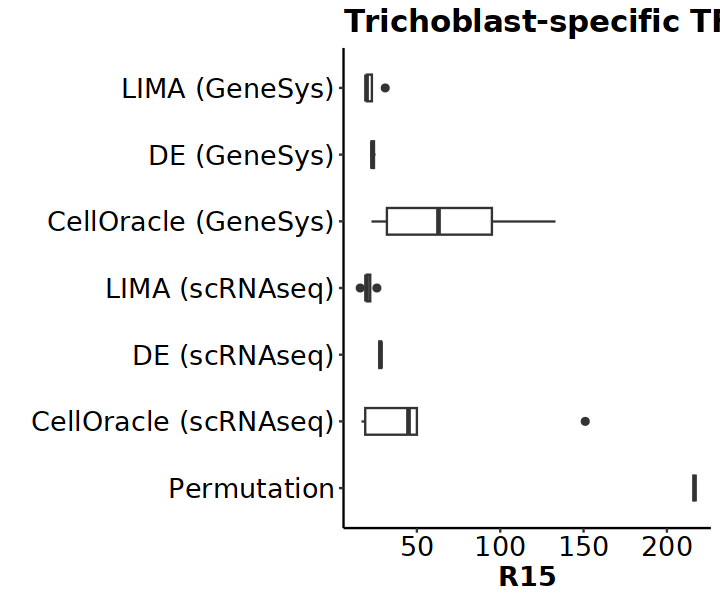

In [152]:
toplt <- data.frame(Methods=factor(c(rep("LIMA (GeneSys)",5), rep("LIMA (scRNAseq)",5), rep("CellOracle (scRNAseq)",5), rep("CellOracle (GeneSys)",5), rep("DE (scRNAseq)",2), rep("DE (GeneSys)",2), "Permutation"), 
                                   levels=c("Permutation", "CellOracle (scRNAseq)", "DE (scRNAseq)", "LIMA (scRNAseq)", "CellOracle (GeneSys)", "DE (GeneSys)", "LIMA (GeneSys)")), R50=toplt$R50)

options(repr.plot.width=6, repr.plot.height=5)
ggplot(toplt, aes(x=Methods, y=R50))+
  geom_boxplot(width=0.4)+ 
  labs(title="Trichoblast-specific TF Prioritization Performance",x="", y = "R15")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

## Plotting

In [154]:
dat <- genesys

In [155]:
plot_heatmap <- function(gene, centrality){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep(centrality,colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = TRUE, name = paste0(gene,"\n","weighted","\n","network","\n","centrality"),
            col = col_fun, column_title = paste0(str_split_i(centrality,"_",1),"\n",str_split_i(centrality,"_",2)), column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [156]:
plot_heatmap2 <- function(gene, centrality){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep(centrality,colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title = "out degree \n centrality", column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [157]:
plot_heatmap3 <- function(gene, centrality){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep(centrality,colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1), name = paste0("unweighted","\n","network","\n","centrality"),
            col = col_fun, column_title = "in degree \n centrality", column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [158]:
plot_all_centrality <- function(gene){
    options(repr.plot.width=10, repr.plot.height=6)
    plot_heatmap(gene,"betweenness_centrality") + plot_heatmap2(gene,"out_centrality") + plot_heatmap3(gene,"in_centrality")
}

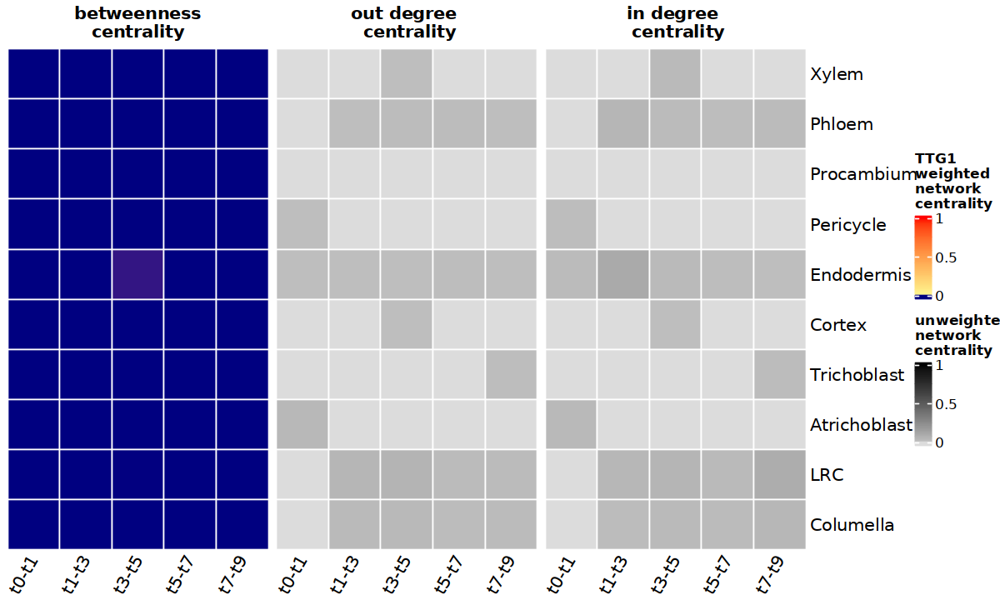

In [159]:
plot_all_centrality("TTG1")

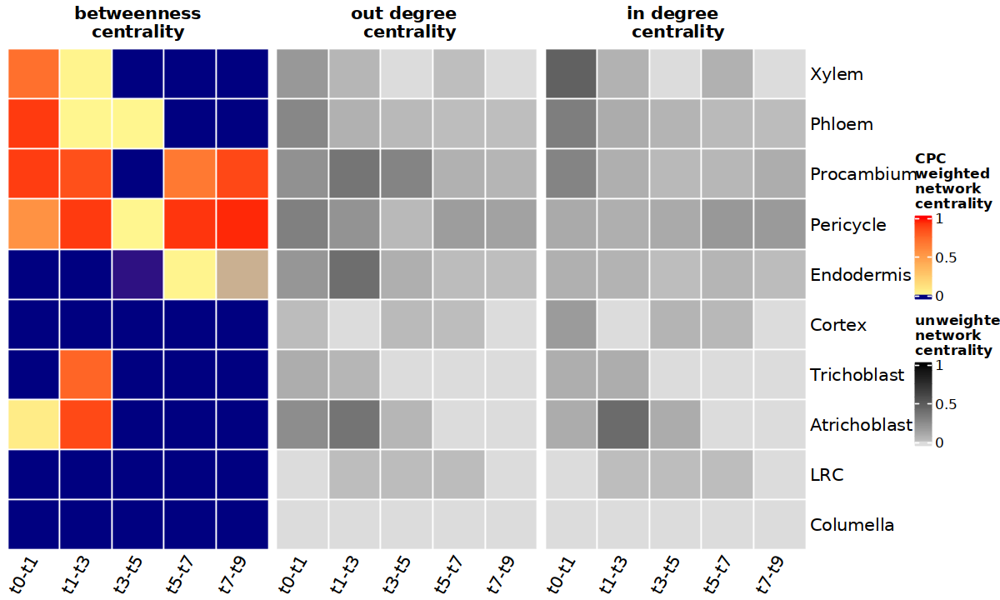

In [149]:
plot_all_centrality("CPC")

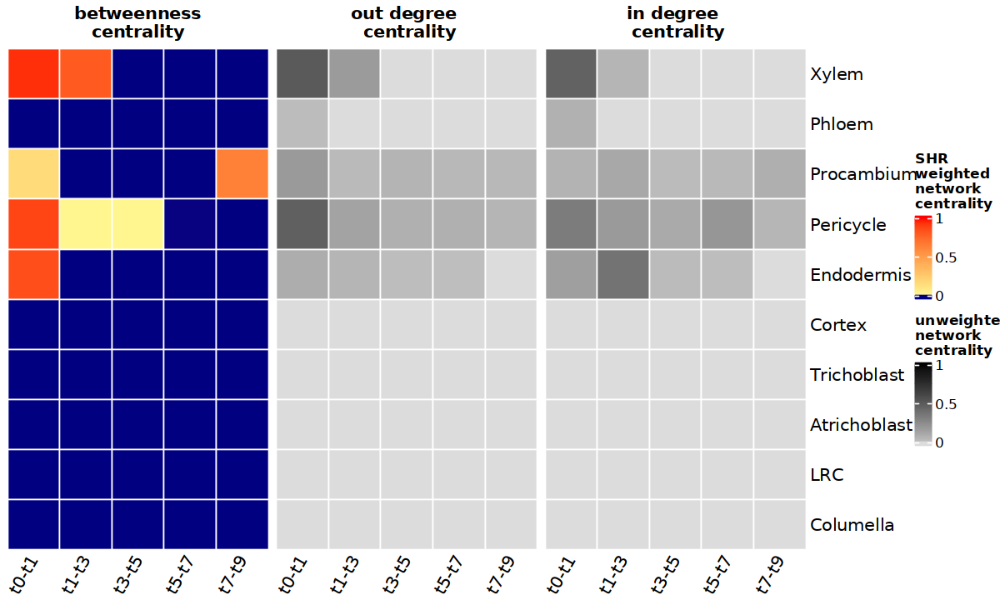

In [150]:
plot_all_centrality("SHR")

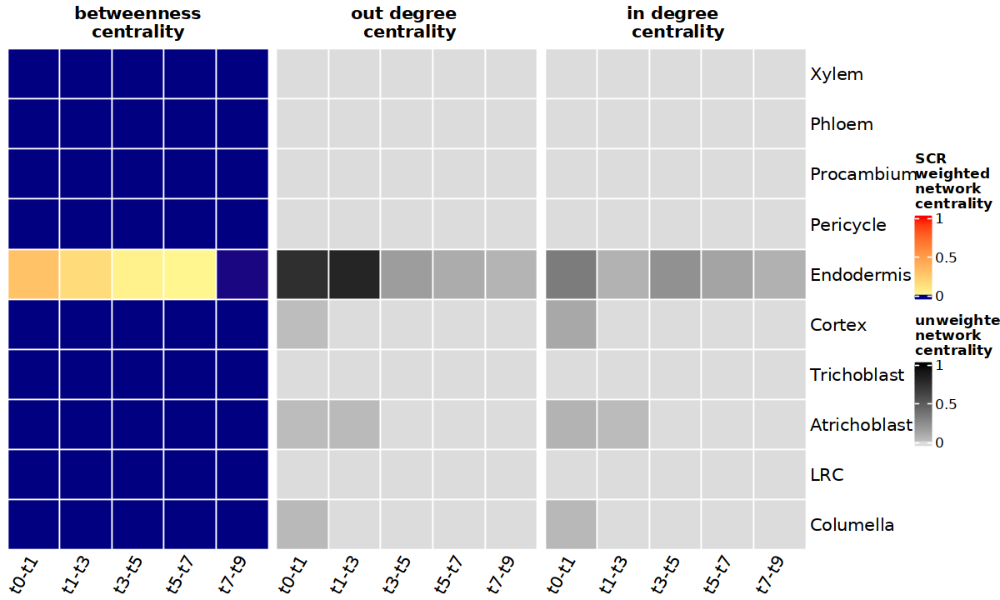

In [151]:
plot_all_centrality("SCR")

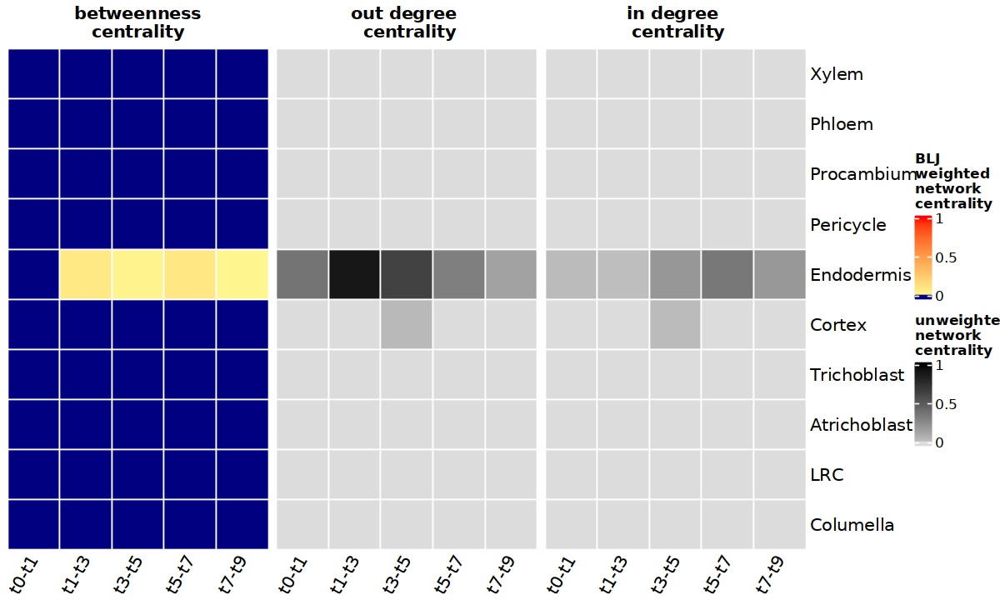

In [152]:
plot_all_centrality("BLJ")

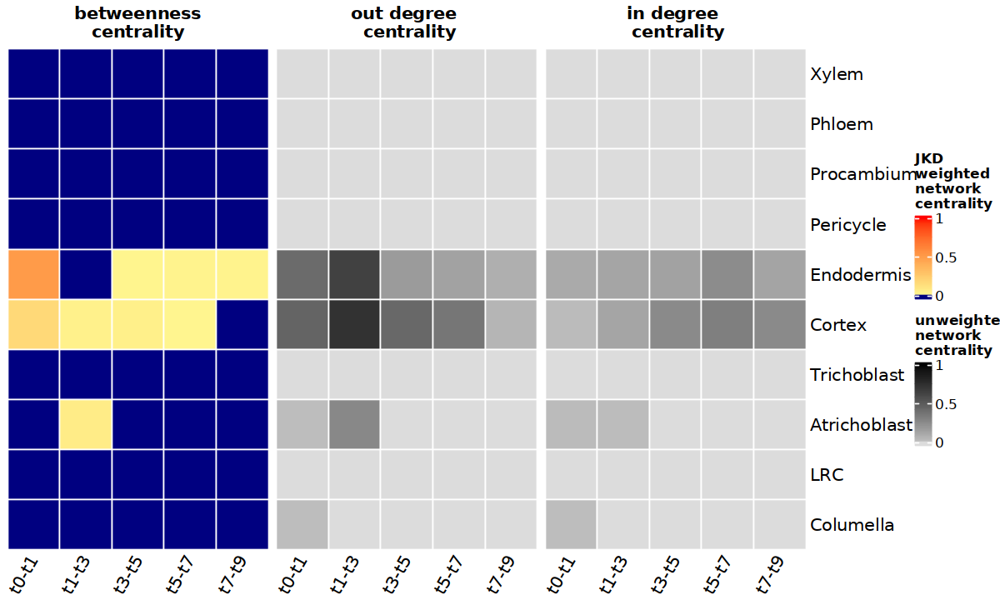

In [153]:
plot_all_centrality("JKD")

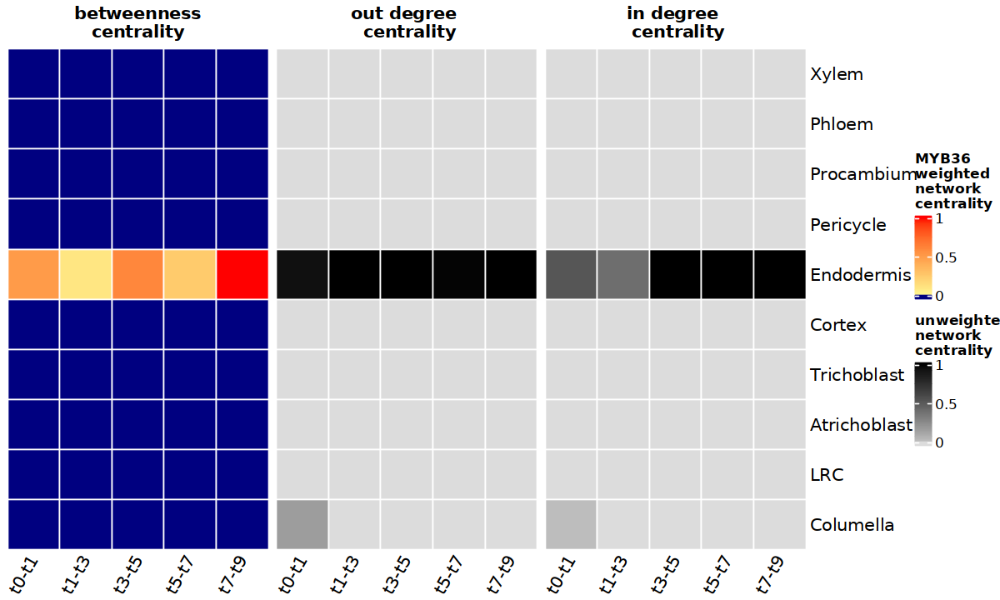

In [154]:
plot_all_centrality("MYB36")

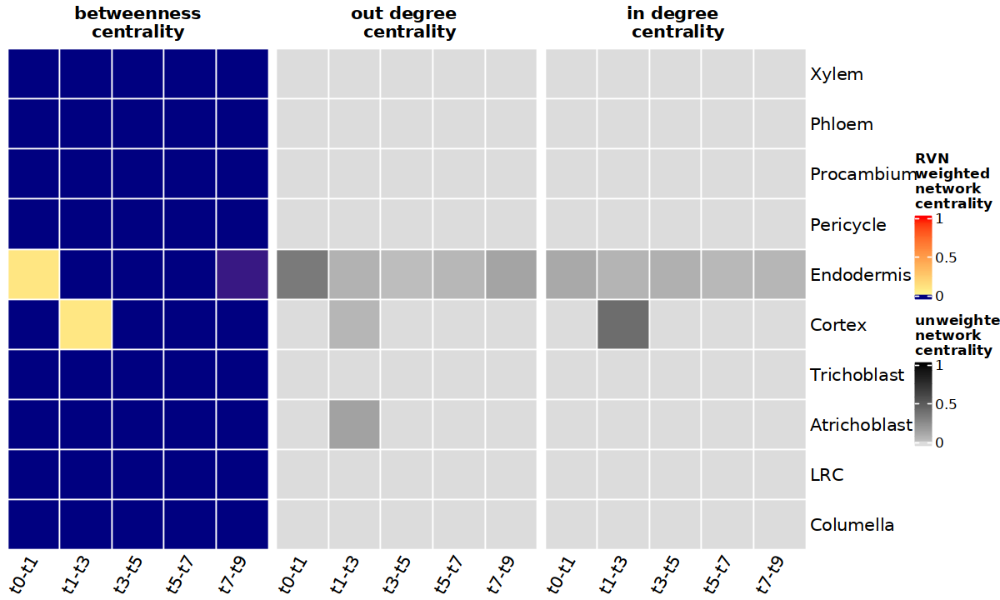

In [155]:
plot_all_centrality("RVN")

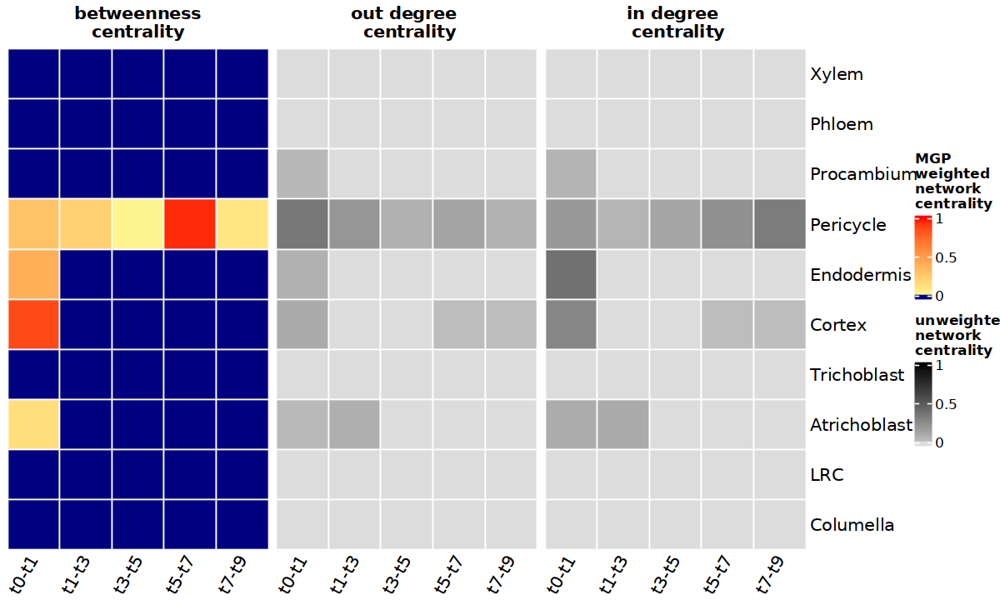

In [156]:
plot_all_centrality("MGP")

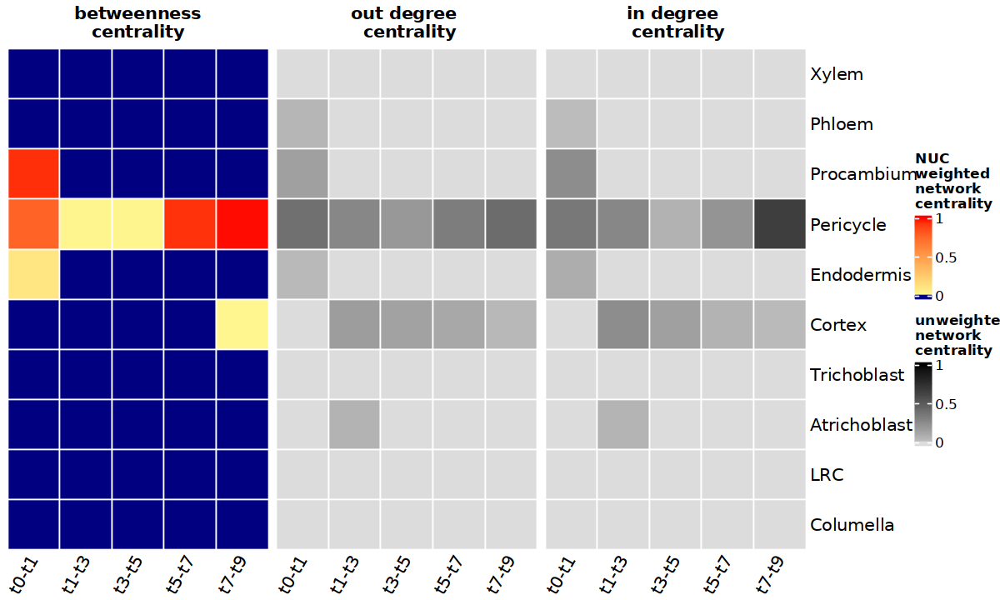

In [157]:
plot_all_centrality("NUC")

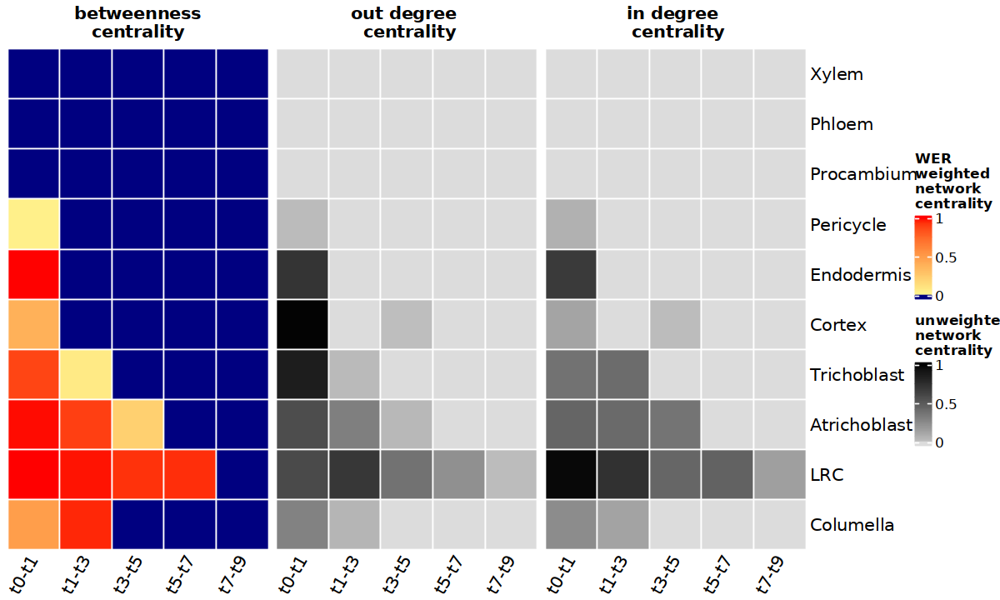

In [158]:
plot_all_centrality("WER")

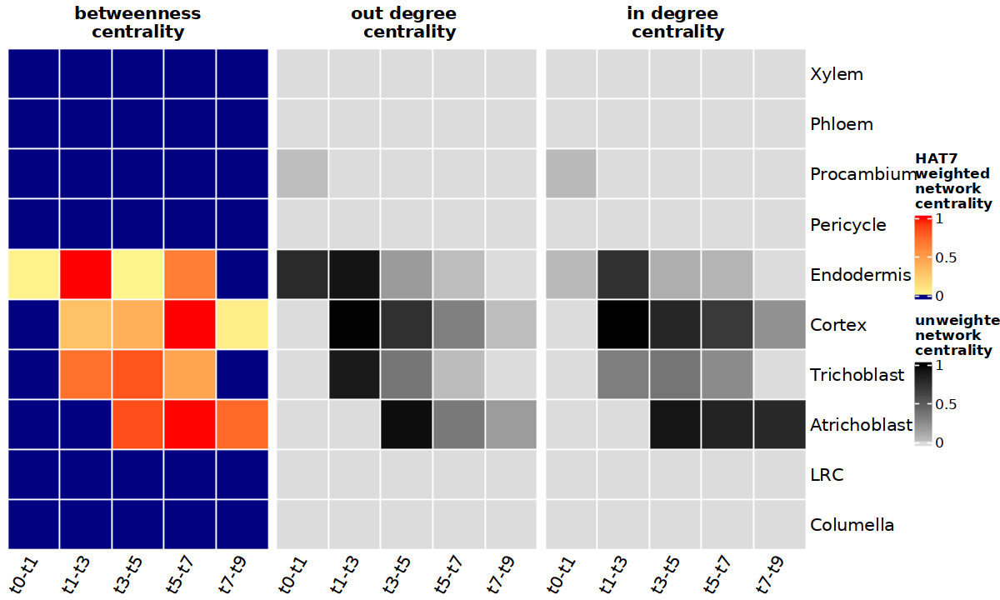

In [159]:
## HAT7
plot_all_centrality("HAT7")

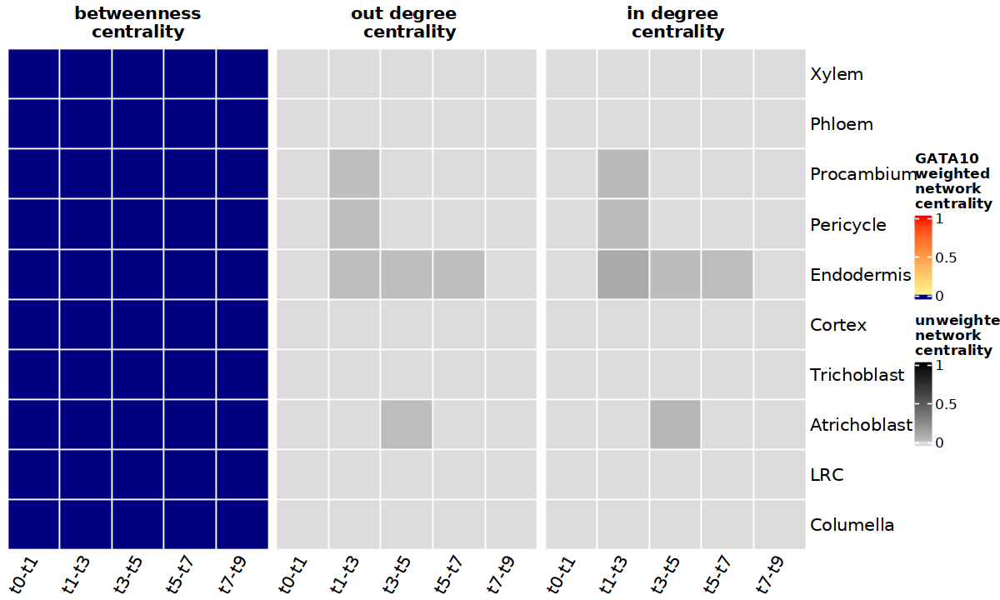

In [160]:
## GATA10
plot_all_centrality("GATA10")

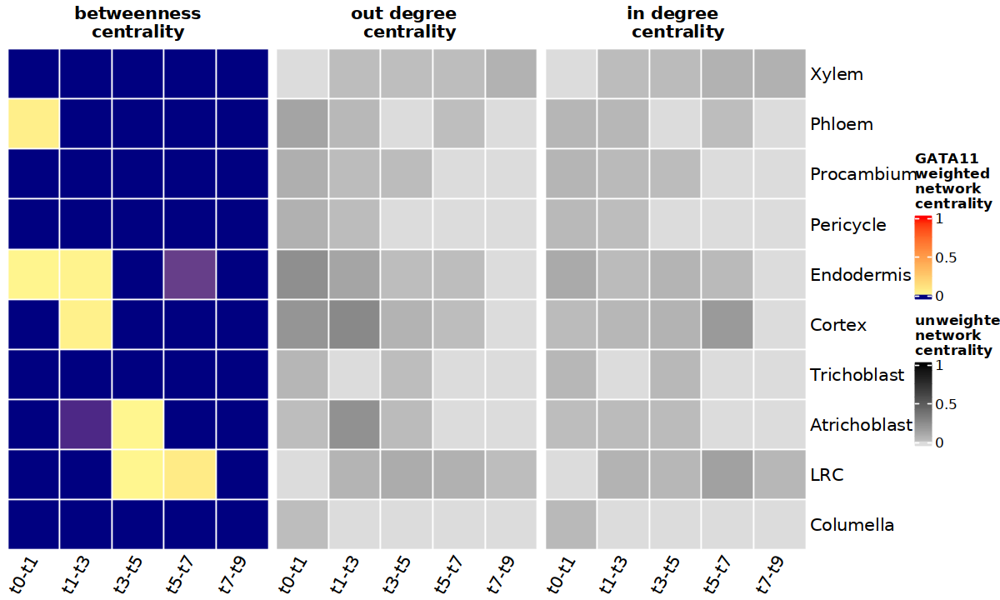

In [161]:
## GATA11
plot_all_centrality("GATA11")

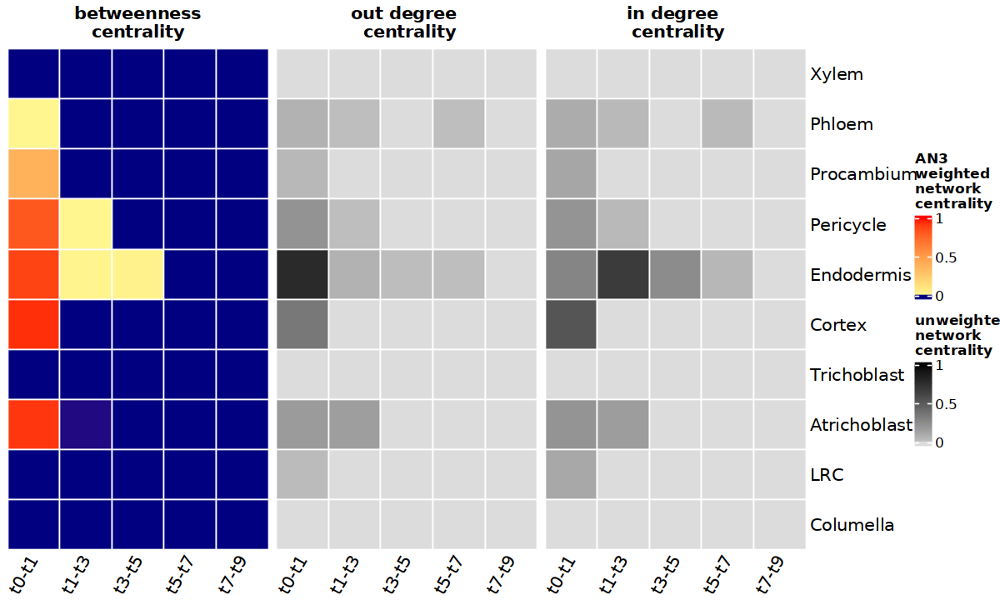

In [162]:
plot_all_centrality("AN3")

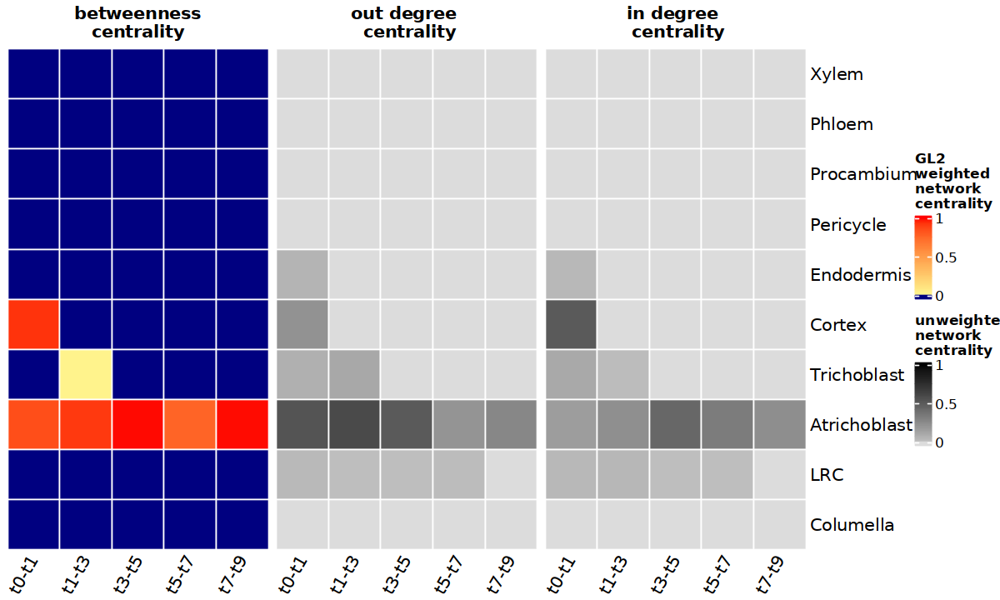

In [163]:
plot_all_centrality("GL2")

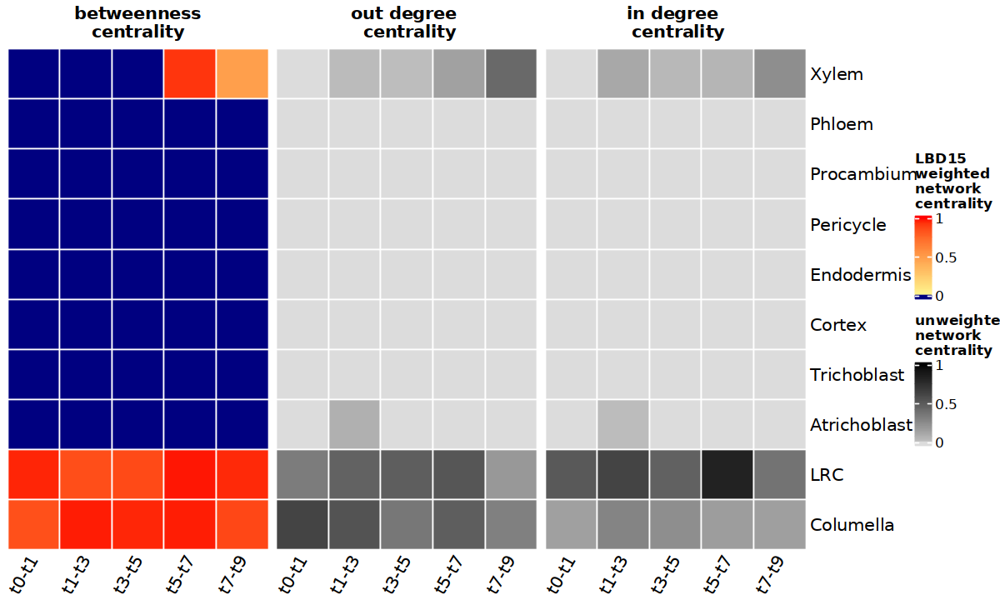

In [164]:
plot_all_centrality("LBD15")

In [165]:
plot_all_centrality <- function(gene){
    options(repr.plot.width=8, repr.plot.height=4)
    plot_heatmap(gene,"betweenness_centrality") + plot_heatmap2(gene,"out_centrality") + plot_heatmap3(gene,"in_centrality")
}

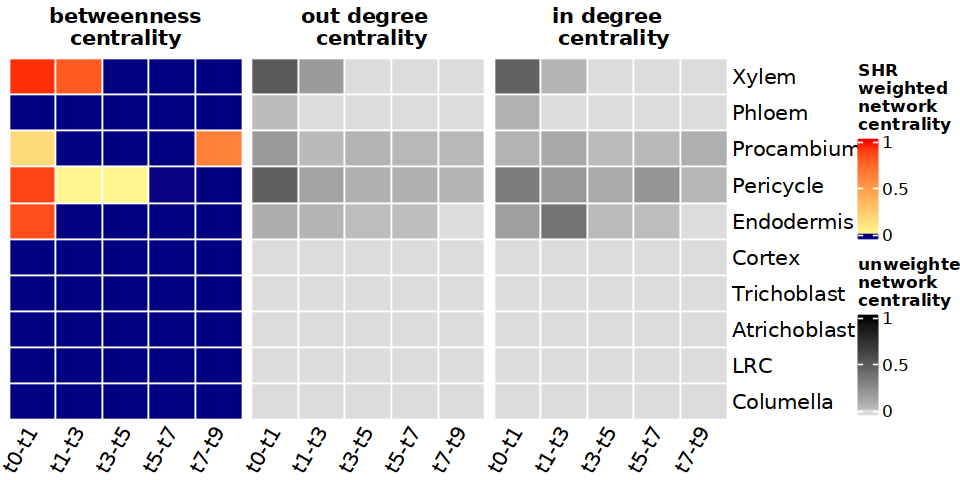

In [166]:
plot_all_centrality("SHR")

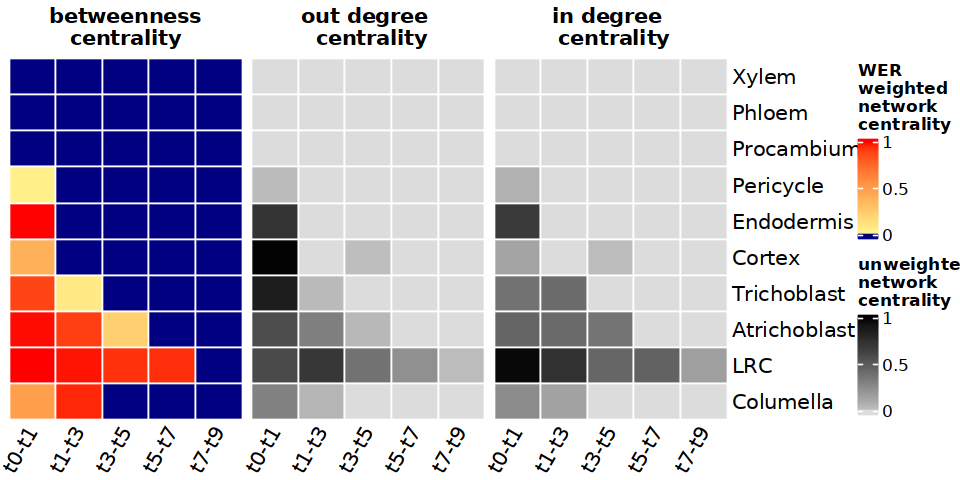

In [167]:
plot_all_centrality("WER")

## Rank by betweenness centrality, out-degree centrality, in-degree centrality and degree centrality

In [160]:
plot_bc <- function(gene){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep("betweenness_centrality",colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title = gene, column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [161]:
plot_oc <- function(gene){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep("out_centrality",colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title = gene, column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [162]:
plot_ic <- function(gene){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep("in_centrality",colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title = gene, column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [163]:
plot_dc <- function(gene){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep("degree_centrality",colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title = gene, column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, bottom_annotation = HeatmapAnnotation(
            text = anno_text(colnames(sub), rot = 60, location = unit(1, "npc"), just = "right"))
       )
}

In [164]:
plot_blank <- function(gene){
    sub <- as.numeric(t(dat[which(dat$TF==gene),grep("betweenness_centrality",colnames(dat))]))
    sub <- as.matrix(cbind(sub[1:10],sub[11:20],sub[21:30],sub[31:40],sub[41:50]))
    ## Cell types
    rownames(sub) <- c('Atrichoblast','Trichoblast','LRC','Cortex','Endodermis','Pericycle','Procambium','Xylem','Phloem','Columella')
    ## Transition
    colnames(sub) <- c('t0-t1', 't1-t3', 't3-t5', 't5-t7', 't7-t9')
    # Reorder rows
    sub <- sub[c(8,9,7,6,5,4,2,1,3,10),]
    col_fun = colorRamp2(c(0, 0.001, 1), c('white',"white", "white"))

    Heatmap(sub, rect_gp = gpar(col = "white", lwd = 1) , show_heatmap_legend = FALSE,
            col = col_fun, column_title_gp = gpar(fontsize = 12, fontface = "bold"), 
            cluster_rows = FALSE, cluster_columns = FALSE,
            show_column_names = FALSE, show_row_names = TRUE
       )
}

In [165]:
# Combine the top three centralies 
sub <- dat[,grep("betweenness_centrality|in_centrality|out_centrality",colnames(dat))]
sub <- as.data.frame(sapply(sub, as.numeric))
rownames(sub) <- dat$TF

In [166]:
head(sub)

,atri_out_centrality_1,atri_in_centrality_1,atri_betweenness_centrality_1,tri_out_centrality_1,tri_in_centrality_1,tri_betweenness_centrality_1,lrc_out_centrality_1,lrc_in_centrality_1,lrc_betweenness_centrality_1,cor_out_centrality_1,...,pro_betweenness_centrality_5,xyl_out_centrality_5,xyl_in_centrality_5,xyl_betweenness_centrality_5,phl_out_centrality_5,phl_in_centrality_5,phl_betweenness_centrality_5,col_out_centrality_5,col_in_centrality_5,col_betweenness_centrality_5
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,...,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
BZIP9,0.0000000,0.00000,0.0000000,0.0000000,0.000000000,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,...,0.9492408,0.00000000,0.0000000,0.000000000,0.93623639,0.05433186,0.9271092,0,0,0
AT3G43430,0.0000000,0.00000,0.0000000,0.0000000,0.000000000,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,...,1.0000000,0.01276596,0.1307692,0.003010817,0.11975117,0.09544787,0.9688674,0,0,0
GATA2,0.9953052,0.55706,0.5787153,0.9610390,0.386831276,0.9894677,0.1764706,0.496124,0.9910266,0.8266254,...,0.0000000,0.00000000,0.0000000,0.000000000,0.00000000,0.00000000,0.0000000,0,0,0
LEP,0.0000000,0.00000,0.0000000,0.1558442,0.008230453,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,...,0.0000000,0.00000000,0.0000000,0.000000000,0.00000000,0.00000000,0.0000000,0,0,0
MYB20,0.0000000,0.00000,0.0000000,0.0000000,0.000000000,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,...,0.9885568,0.05106383,0.1346154,0.000000000,0.00155521,0.01027900,0.0000000,0,0,0
OBP2,0.0000000,0.00000,0.0000000,0.0000000,0.000000000,0.0000000,0.0000000,0.000000,0.0000000,0.0000000,...,0.1289153,0.00000000,0.0000000,0.000000000,0.87713841,0.41703377,0.4722289,0,0,0


In [167]:
bc_rank <- data.frame(all=rowSums(sub),atri=rowSums(sub[,grep("^atri_",colnames(sub))]),tri=rowSums(sub[,grep("^tri_",colnames(sub))])
                     ,cor=rowSums(sub[,grep("^cor_",colnames(sub))]),end=rowSums(sub[,grep("^end_",colnames(sub))])
                     ,per=rowSums(sub[,grep("^per_",colnames(sub))]),pro=rowSums(sub[,grep("^pro_",colnames(sub))])
                     ,xyl=rowSums(sub[,grep("^xyl_",colnames(sub))]),phl=rowSums(sub[,grep("^phl_",colnames(sub))])
                     ,lrc=rowSums(sub[,grep("^lrc_",colnames(sub))]),col=rowSums(sub[,grep("^col_",colnames(sub))]))

In [168]:
bc_rank$GeneID <- wanted_TFs$GeneID[match(rownames(bc_rank),wanted_TFs$Name)]

In [169]:
head(bc_rank)

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
BZIP9,29.19444,0.000000,0.000000,0.000000,0.01983748,9.05092129,8.8677625,0.05687082,11.19905212,0.00000,0.00000000,AT5G24800
AT3G43430,34.91987,0.000000,0.000000,0.000000,0.01684128,12.12719380,9.5079047,4.47480476,8.79312886,0.00000,0.00000000,AT3G43430
GATA2,32.60274,6.876734,5.844258,1.938035,2.47836267,0.03634172,0.1234438,0.02555554,0.02737594,11.82659,3.42603973,AT2G45050
LEP,34.89938,4.738138,5.608289,0.000000,5.48517444,11.78585516,4.1985151,0.14260467,2.92113981,0.00000,0.01966089,AT5G13910
MYB20,30.03240,0.000000,0.000000,0.000000,0.31968431,10.63089110,10.9812467,4.08713837,4.01344128,0.00000,0.00000000,AT1G66230
OBP2,20.54627,0.000000,0.000000,0.000000,0.00000000,5.48240701,5.4416662,0.00000000,9.62219734,0.00000,0.00000000,AT1G07640


## Atrichoblast

In [178]:
atri_rank <- bc_rank[which(bc_rank$atri*2 > bc_rank$all),]%>% arrange(desc(atri))
atri_rank$GeneName <- rownames(atri_rank)

In [179]:
atri_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
GL2,10.13792179,7.99892003,0.306455175,1.647865277,0.081783175,0.000000000,0.000000000,0.000000000,0.000000000,0.102898124,0.000000000,AT1G79840,GL2
TTG2,7.89124644,7.64671499,0.154310924,0.063545673,0.026674853,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,AT2G37260,TTG2
MYB23,11.76429265,7.42441618,2.547943239,1.689051869,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.090423029,0.012458333,AT5G40330,MYB23
MYB45,8.44734650,4.93461168,0.257495007,3.255239816,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,AT3G48920,MYB45
TRY,9.29644062,4.84571448,0.306914408,1.281555407,0.944359511,0.005098190,0.000000000,0.000000000,0.047787381,0.172898617,1.692112629,AT5G53200,TRY
NAC6,5.01368983,4.61200210,0.250083668,0.089754727,0.025425394,0.000000000,0.000000000,0.000000000,0.000000000,0.009141583,0.027282363,AT5G39610,NAC6
WRKY45,6.49790603,4.35144216,0.635707123,0.119099988,0.000000000,0.000000000,0.199622680,0.072935273,0.454857483,0.059754738,0.604486579,AT3G01970,WRKY45
AT3G05860,4.55350580,3.80864079,0.744865009,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,AT3G05860,AT3G05860
HB17,6.33928305,3.80085860,0.563948902,0.116204080,0.000000000,0.000000000,0.048250157,1.579969548,0.147820723,0.000000000,0.082231041,AT2G01430,HB17


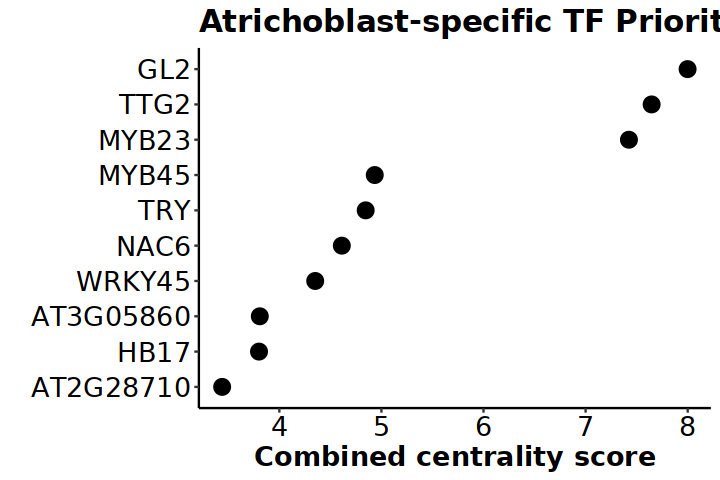

In [180]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(atri_rank[1:10,], aes(x=reorder(GeneName, atri, decreasing = FALSE),  y=atri)) + geom_point(size=4)+ 
  labs(title="Atrichoblast-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [181]:
write.csv(atri_rank,"Atrichoblast_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [182]:
tf_rank <- atri_rank %>% rownames(.)

In [183]:
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [184]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

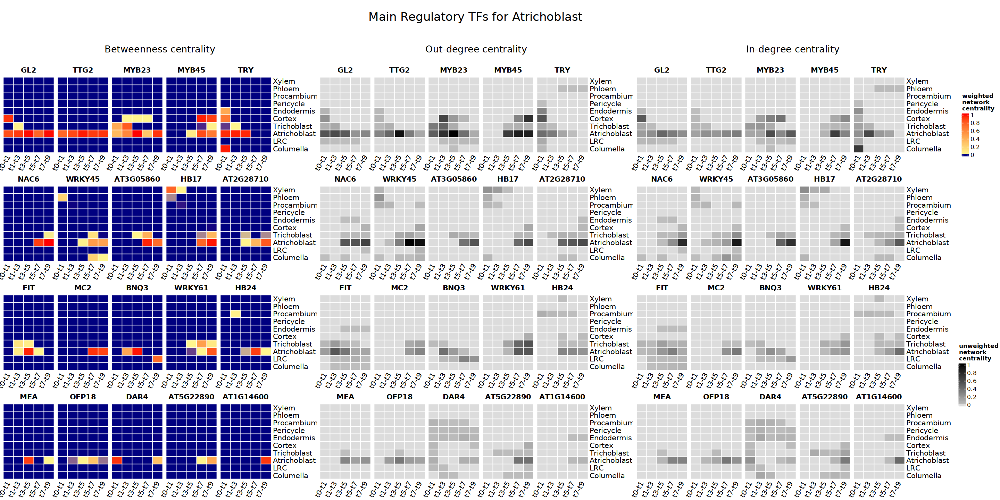

In [185]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Atrichoblast ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

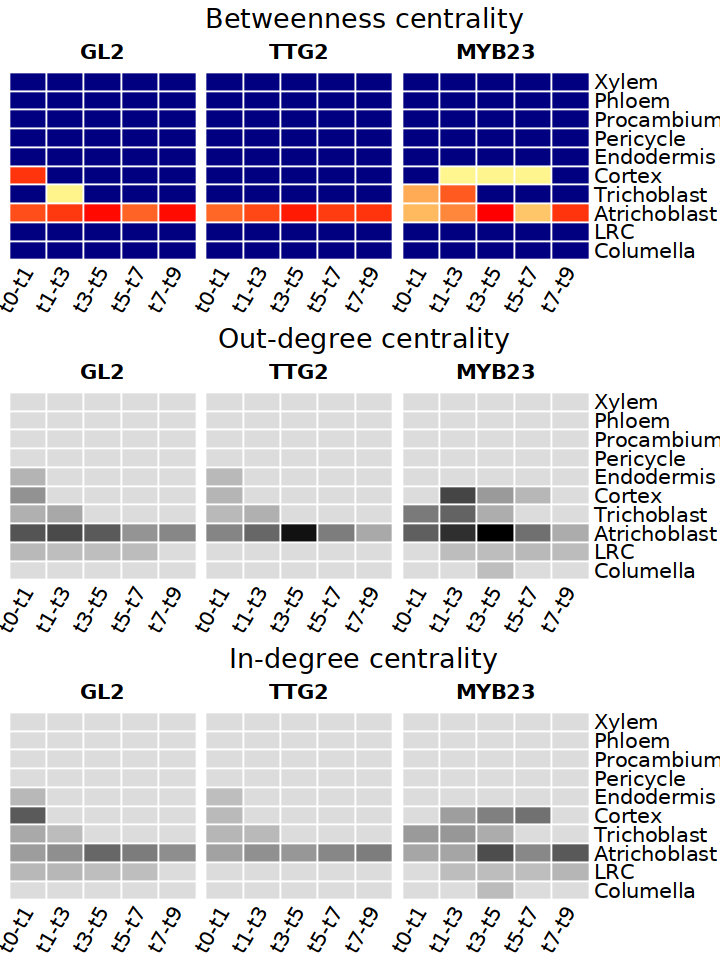

In [186]:
q1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3])
q2 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3])
q3 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3])

q1 <- grid.grabExpr(draw(q1))
q2 <- grid.grabExpr(draw(q2))
q3 <- grid.grabExpr(draw(q3))

options(repr.plot.width=6, repr.plot.height=8)
plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q1,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q2,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q3,nrow=2,rel_heights = c(1, 8)),nrow=3)

## Trichoblast

In [187]:
tri_rank <- bc_rank[which(bc_rank$tri*2 > bc_rank$all),]%>% arrange(desc(tri))
tri_rank$GeneName <- rownames(tri_rank)

In [188]:
tri_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AT3G53370,9.48156264,0.630396168,8.27226699,0.000000000,0.000000000,0.264379307,0.032137564,0.260165608,0.022217008,0.000000000,0.000000000,AT3G53370,AT3G53370
LRL3,7.55971931,0.328339547,7.23137977,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,AT5G58010,LRL3
RHD6,7.62172822,0.599061357,7.00936422,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.013302640,0.000000000,0.000000000,AT1G66470,RHD6
AT4G09100,6.15424262,0.019034250,6.13520837,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,AT4G09100,AT4G09100
WRKY65,11.09069591,2.627264362,6.09064583,0.068166275,0.292756193,0.000000000,0.000000000,0.000000000,0.000000000,1.358809122,0.653054119,AT1G29280,WRKY65
ATMYC1,9.91207908,2.531639789,6.05062215,1.042949013,0.227053423,0.059814700,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,AT4G00480,ATMYC1
RSL4,5.56741048,0.066248152,5.50116232,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,AT1G27740,RSL4
RSL1,7.20896486,1.092990071,5.09793148,0.000000000,1.018043312,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,AT5G37800,RSL1
OFP13,6.20947806,0.595148296,4.78905453,0.649866798,0.097502013,0.000000000,0.000000000,0.000000000,0.000000000,0.077906431,0.000000000,AT5G04820,OFP13


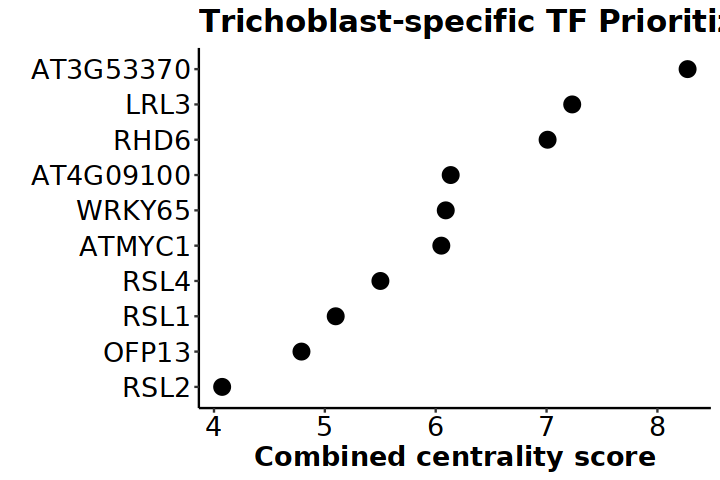

In [189]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(tri_rank[1:10,], aes(x=reorder(GeneName, tri, decreasing = FALSE),  y=tri)) + geom_point(size=4)+ 
  labs(title="Trichoblast-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [190]:
write.csv(tri_rank,"Trichoblast_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [191]:
## Top20 only
tf_rank <- tri_rank %>% rownames(.)
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [192]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

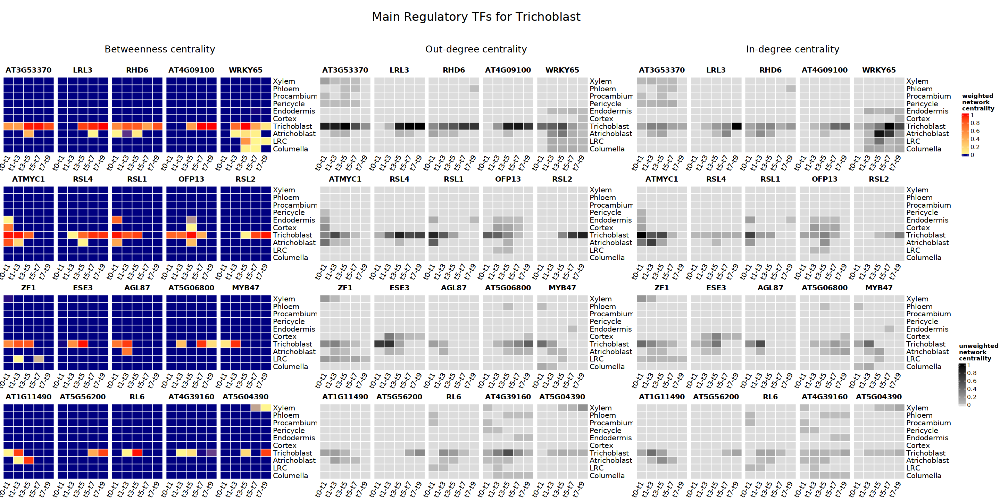

In [193]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Trichoblast ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

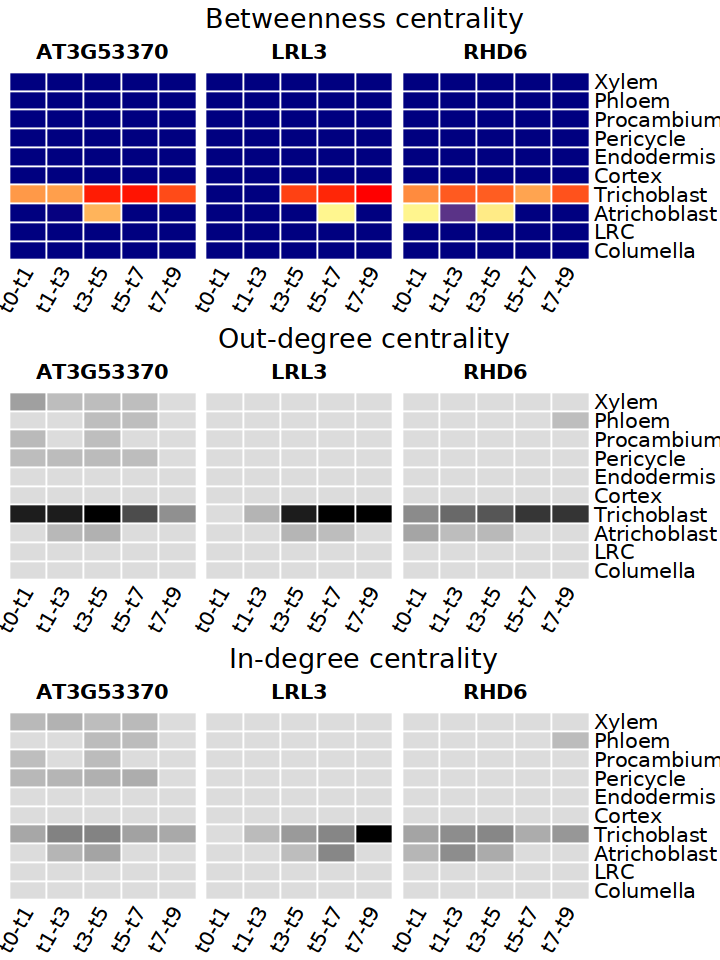

In [194]:
q1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3])
q2 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3])
q3 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3])

q1 <- grid.grabExpr(draw(q1))
q2 <- grid.grabExpr(draw(q2))
q3 <- grid.grabExpr(draw(q3))

options(repr.plot.width=6, repr.plot.height=8)
plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q1,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q2,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q3,nrow=2,rel_heights = c(1, 8)),nrow=3)

## Cortex

In [195]:
cor_rank <- bc_rank[which(bc_rank$cor*2 > bc_rank$all),]%>% arrange(desc(cor))
cor_rank$GeneName <- rownames(cor_rank)

In [196]:
cor_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
MYB86,8.33162471,2.75419560,0.253538113,5.20815202,0.007387534,0.000000000,0.000000000,0.07504240,0.020377054,0.012931996,0.000000000,AT5G26660,MYB86
AT2G38300,4.48282427,0.22006411,0.000000000,4.26276016,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,AT2G38300,AT2G38300
AT1G72210,5.53571023,0.27108148,0.005699856,3.99582057,0.990212139,0.000000000,0.113503819,0.00000000,0.126564031,0.006243032,0.026585297,AT1G72210,AT1G72210
AT2G42660,4.45027123,0.65196470,0.000000000,3.79830653,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,0.000000000,AT2G42660,AT2G42660
AT3G61420,5.05666724,0.40592662,0.114121032,3.70908262,0.636415577,0.004706377,0.096318075,0.00000000,0.058804976,0.031291966,0.000000000,AT3G61420,AT3G61420
tny,5.48007594,0.13479399,1.769093331,3.56176681,0.000000000,0.000000000,0.008461312,0.00000000,0.005960496,0.000000000,0.000000000,AT5G25810,tny
AT1G05710,5.61580676,0.13633733,0.007878508,3.40979001,1.270550511,0.020123959,0.105324581,0.00000000,0.595664361,0.023634337,0.046503165,AT1G05710,AT1G05710
JKD,6.26429609,0.35457101,0.000000000,3.20188027,2.698635654,0.000000000,0.000000000,0.00000000,0.000000000,0.000000000,0.009209155,AT5G03150,JKD
RGL3,5.10373007,0.33089100,0.222763629,3.14644102,0.121086849,0.044888418,0.031148307,0.38701667,0.000000000,0.501592428,0.317901759,AT5G17490,RGL3


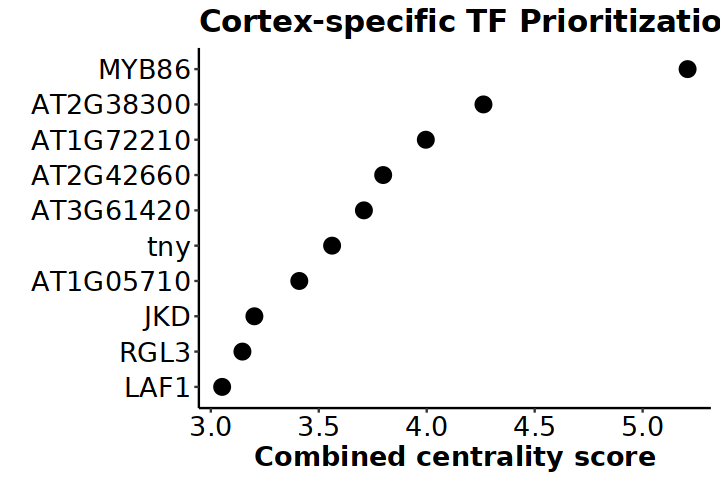

In [197]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(cor_rank[1:10,], aes(x=reorder(GeneName, cor, decreasing = FALSE),  y=cor)) + geom_point(size=4)+ 
  labs(title="Cortex-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [198]:
write.csv(cor_rank,"Cortex_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [199]:
tf_rank <- cor_rank %>% rownames(.)
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
#p4 <- plot_bc(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
#p8 <- plot_oc(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
#p12 <- plot_ic(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

In [200]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
#p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
#p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
#p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

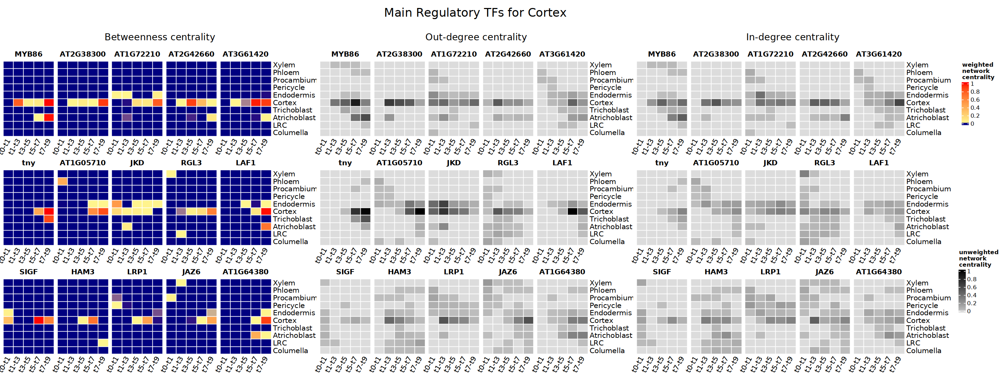

In [201]:
options(repr.plot.width=24, repr.plot.height=9)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Cortex ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,nrow=3),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,nrow=3),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,nrow=3),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

In [202]:
## Top 10 only
tf_rank <- cor_rank %>% rownames(.)
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
#p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
#p4 <- plot_bc(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
#p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
#p8 <- plot_oc(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
#p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
#p12 <- plot_ic(tf_rank[16]) + plot_blank("Empty")+ plot_blank("Empty") + plot_blank("Empty")+ plot_blank("Empty")

In [203]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
#p3 <- grid.grabExpr(draw(p3))
#p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
#p7 <- grid.grabExpr(draw(p7))
#p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
#p11 <- grid.grabExpr(draw(p11))
#p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

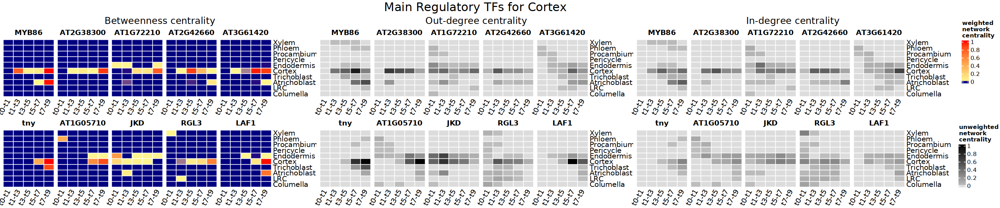

In [204]:
options(repr.plot.width=24, repr.plot.height=5)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Cortex ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,nrow=2),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,nrow=2),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,nrow=2),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

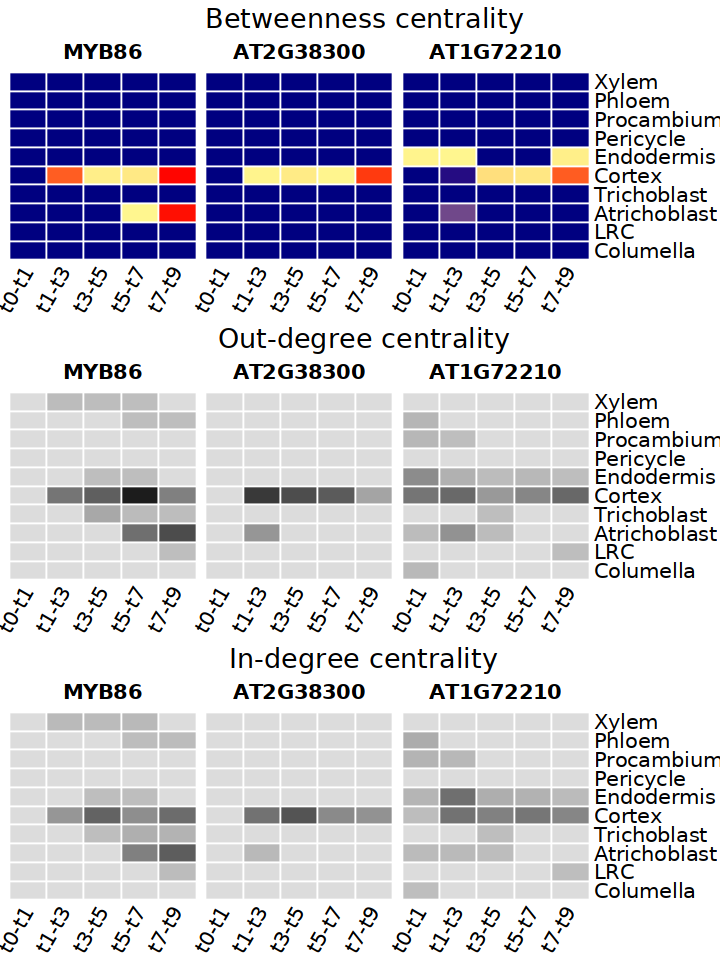

In [205]:
q1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3])
q2 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3])
q3 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3])

q1 <- grid.grabExpr(draw(q1))
q2 <- grid.grabExpr(draw(q2))
q3 <- grid.grabExpr(draw(q3))

options(repr.plot.width=6, repr.plot.height=8)
plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q1,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q2,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q3,nrow=2,rel_heights = c(1, 8)),nrow=3)

## Endodermis

In [170]:
end_rank <- bc_rank[which(bc_rank$end*2 > bc_rank$all),]%>% arrange(desc(end))
end_rank$GeneName <- rownames(end_rank)

In [171]:
end_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
MYB36,11.465687275,0.00000000,0.000000000,0.000000000,11.295854022,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.16983325,AT5G57620,MYB36
MYB74,10.873281001,0.00000000,0.000000000,0.067935848,8.801405251,0.000000000,0.138782683,0.341725875,0.101052072,0.211671939,1.21070733,AT4G05100,MYB74
MYB68,7.475500785,0.00000000,0.000000000,0.000000000,7.396895045,0.000000000,0.042681016,0.000000000,0.000000000,0.000000000,0.03592472,AT5G65790,MYB68
MYB3,10.757211712,2.24370630,0.108531103,0.177466813,7.362222126,0.013738644,0.000000000,0.554956234,0.101325051,0.146805007,0.04846043,AT1G22640,MYB3
RAX2,4.319321152,0.44635492,0.012820513,0.318529974,3.390917889,0.150697852,0.000000000,0.000000000,0.000000000,0.000000000,0.00000000,AT2G36890,RAX2
BLJ,3.292918817,0.00000000,0.000000000,0.039632918,3.253285899,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.00000000,AT1G14580,BLJ
SCR,3.374886967,0.09954593,0.000000000,0.113936058,3.106410590,0.000000000,0.000000000,0.000000000,0.000000000,0.000000000,0.05499439,AT3G54220,SCR
TLP11,3.773096001,0.00000000,0.282829663,0.099566917,2.040645643,1.154451006,0.110852139,0.000000000,0.072878213,0.011872418,0.00000000,AT5G18680,TLP11
chr31,1.788277261,0.00000000,0.000000000,0.000000000,1.746774300,0.000000000,0.000000000,0.035542465,0.005960496,0.000000000,0.00000000,AT1G05490,chr31


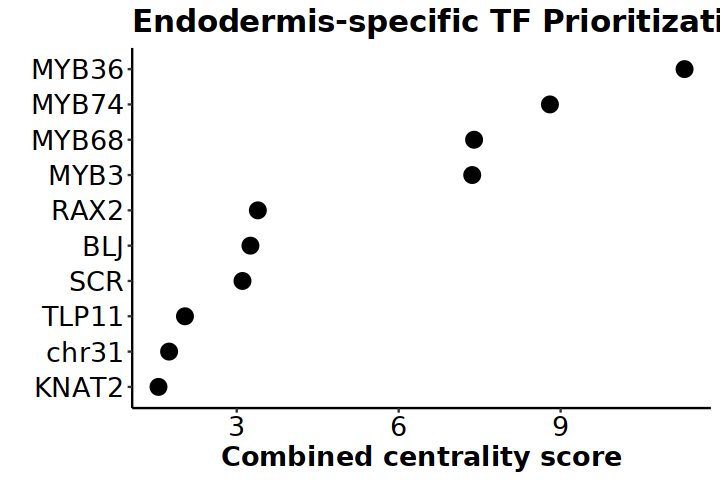

In [173]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(end_rank[1:10,], aes(x=reorder(GeneName, end, decreasing = FALSE),  y=end)) + geom_point(size=4)+ 
  labs(title="Endodermis-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [209]:
write.csv(end_rank,"Endodermis_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [210]:
tf_rank <- end_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [211]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

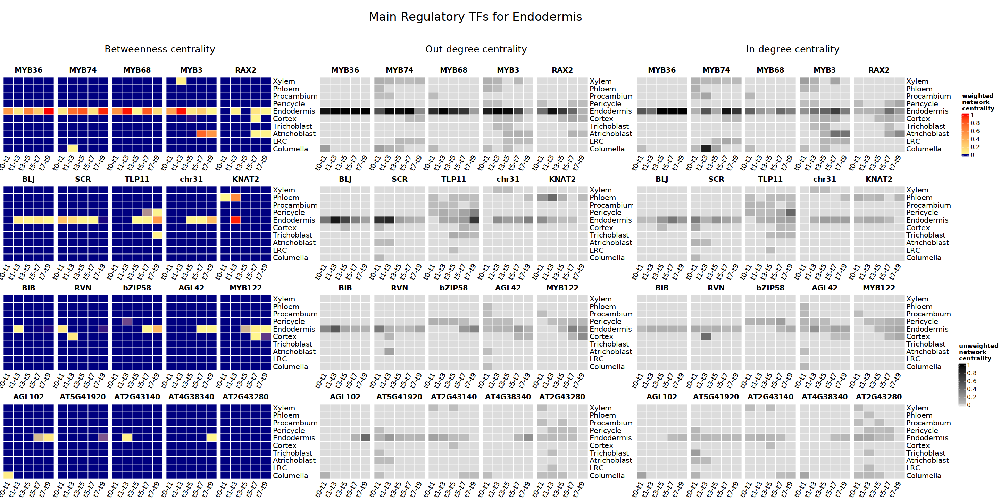

In [212]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Endodermis ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

In [213]:
tf_rank <- end_rank %>% rownames(.)
# Max 10
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
#p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
#p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
#p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
#p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
#p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
#p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [214]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
#p3 <- grid.grabExpr(draw(p3))
#p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
#p7 <- grid.grabExpr(draw(p7))
#p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
#p11 <- grid.grabExpr(draw(p11))
#p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

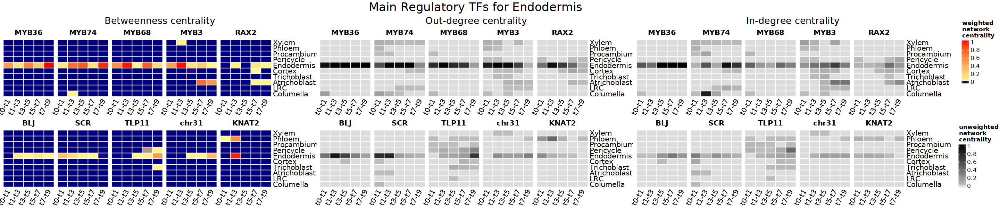

In [215]:
options(repr.plot.width=24, repr.plot.height=5)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Endodermis ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,nrow=2),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,nrow=2),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,nrow=2),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

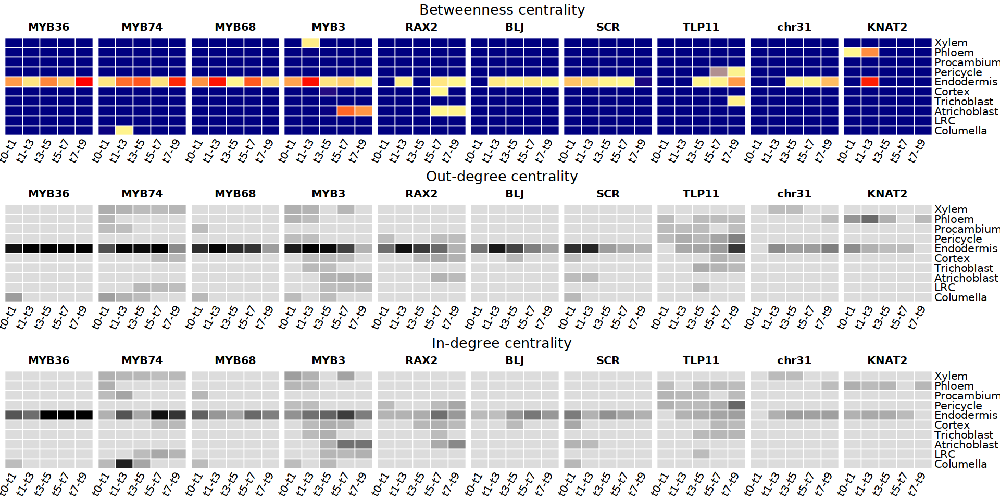

In [216]:
q1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5]) + plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10]) 
q2 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5]) + plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10]) 
q3 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5]) + plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10]) 

q1 <- grid.grabExpr(draw(q1))
q2 <- grid.grabExpr(draw(q2))
q3 <- grid.grabExpr(draw(q3))

options(repr.plot.width=16, repr.plot.height=8)
plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q1,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q2,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q3,nrow=2,rel_heights = c(1, 8)),nrow=3)

## Pericycle

In [217]:
per_rank <- bc_rank[which(bc_rank$per*2 > bc_rank$all),]%>% arrange(desc(per))
per_rank$GeneName <- rownames(per_rank)

In [218]:
per_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AT4G29100,15.8083390,0.00000000,0.000000,0.00000000,0.66175063,8.8915794,3.66977328,0.000000000,2.585235682,0.00000000,0.000000000,AT4G29100,AT4G29100
MYBC1,12.4042487,0.00000000,0.000000,0.31761261,2.38152429,8.7130171,0.94175584,0.000000000,0.044917605,0.00000000,0.005421276,AT2G40970,MYBC1
LBD16,15.8139880,0.00000000,0.000000,0.04891904,1.05414621,8.4904782,3.89939077,0.000000000,1.882023063,0.00000000,0.439030705,AT2G42430,LBD16
LRL1,14.1345131,0.02497473,2.667345,0.00000000,1.25683596,7.8107122,1.40982865,0.000000000,0.964816498,0.00000000,0.000000000,AT2G24260,LRL1
NUC,8.3679224,0.10079660,0.000000,0.88928041,0.19917076,5.8016558,1.32646929,0.000000000,0.050549496,0.00000000,0.000000000,AT5G44160,NUC
bZIP4,7.8776283,0.00000000,0.000000,0.00000000,0.02534831,4.0240777,1.58832811,1.456991737,0.782882440,0.00000000,0.000000000,AT1G59530,bZIP4
AT3G21330,5.5046378,0.17346594,0.000000,0.00000000,1.23050311,4.0061762,0.09449253,0.000000000,0.000000000,0.00000000,0.000000000,AT3G21330,AT3G21330
LBD14,4.3752778,0.00000000,0.000000,0.00000000,0.30914198,3.9372304,0.00000000,0.128905422,0.000000000,0.00000000,0.000000000,AT2G31310,LBD14
MGP,5.7959295,0.40991178,0.000000,1.24980514,0.83953442,3.2193337,0.07734448,0.000000000,0.000000000,0.00000000,0.000000000,AT1G03840,MGP


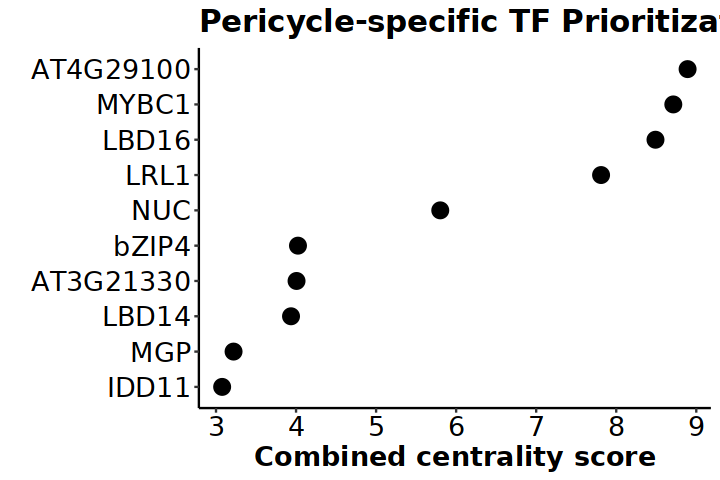

In [219]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(per_rank[1:10,], aes(x=reorder(GeneName, per, decreasing = FALSE),  y=per)) + geom_point(size=4)+ 
  labs(title="Pericycle-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [220]:
write.csv(per_rank,"Pericycle_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [221]:
tf_rank <- per_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [222]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

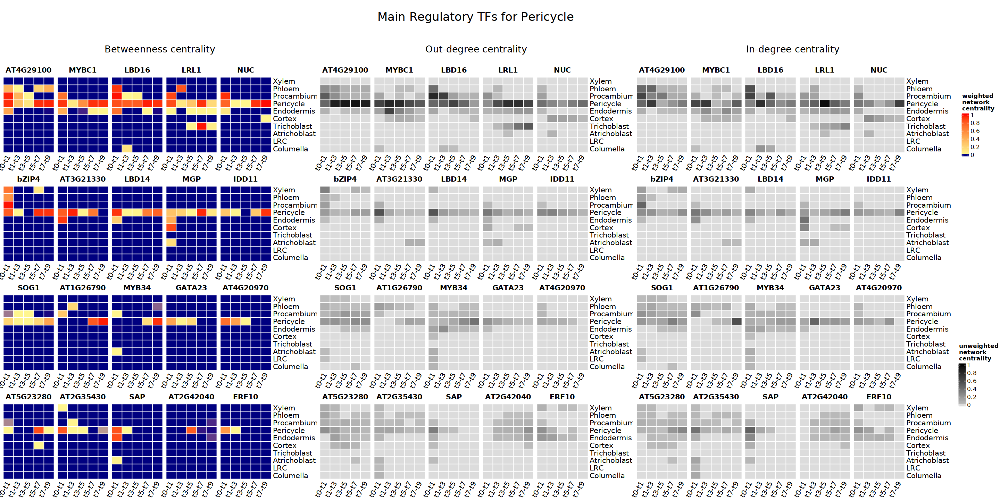

In [223]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Pericycle ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

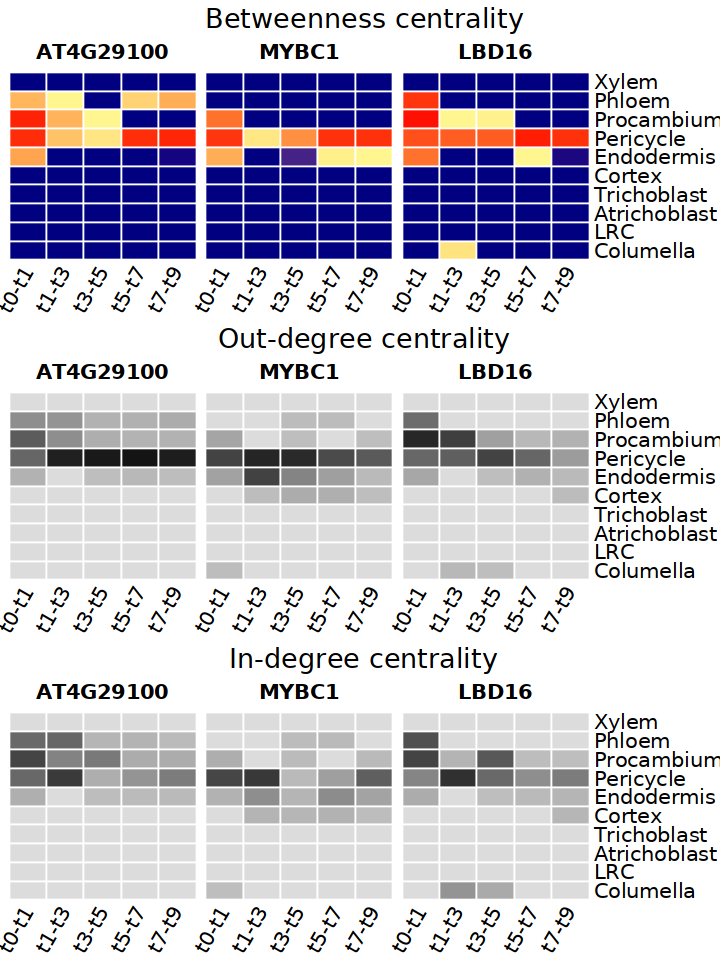

In [224]:
q1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3])
q2 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3])
q3 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3])

q1 <- grid.grabExpr(draw(q1))
q2 <- grid.grabExpr(draw(q2))
q3 <- grid.grabExpr(draw(q3))

options(repr.plot.width=6, repr.plot.height=8)
plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q1,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q2,nrow=2,rel_heights = c(1, 8))
          ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),q3,nrow=2,rel_heights = c(1, 8)),nrow=3)

## Procambium

In [225]:
pro_rank <- bc_rank[which(bc_rank$pro*2 > bc_rank$all),]%>% arrange(desc(pro))
pro_rank$GeneName <- rownames(pro_rank)

In [226]:
pro_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AT1G61660,19.66448130,0.00000000,0.00000000,0.00000000,0.027513315,1.308861284,9.91179187,3.65891724,4.75739758,0.00000000,0.0000000,AT1G61660,AT1G61660
MYB88,15.09234439,0.00000000,0.00000000,0.00000000,0.000000000,0.564039378,9.42854467,1.71320671,3.29802699,0.08852664,0.0000000,AT2G02820,MYB88
IAA12,17.13838585,0.00000000,0.00000000,0.00000000,0.000000000,0.307158062,8.71622709,5.70692963,2.40807107,0.00000000,0.0000000,AT1G04550,IAA12
ABO3,14.90735483,0.13198291,0.00000000,0.01259942,0.053741401,2.796666158,8.23950337,1.32021837,2.35264320,0.00000000,0.0000000,AT1G66600,ABO3
RVE1,9.74452758,0.00000000,0.00000000,0.00000000,0.054219342,0.567162571,5.08516335,2.17330242,1.65991743,0.09819062,0.1065718,AT5G17300,RVE1
HB18,5.72041091,0.00000000,0.00000000,0.00000000,0.000000000,0.000000000,4.23145083,0.27791535,1.21104472,0.00000000,0.0000000,AT1G70920,HB18
HAT9,4.97434732,0.00000000,0.00000000,0.12209428,0.008108846,0.314151011,3.59905098,0.01695377,0.91398844,0.00000000,0.0000000,AT2G22800,HAT9
AT2G40200,4.47922324,0.00000000,0.08663353,0.00000000,0.000000000,0.018974084,2.89717729,0.01930762,1.45713071,0.00000000,0.0000000,AT2G40200,AT2G40200
NAC080,5.27661055,0.00000000,0.00000000,0.00000000,0.028855655,0.383149699,2.83167375,0.02084784,1.70681657,0.07513935,0.2301277,AT5G07680,NAC080


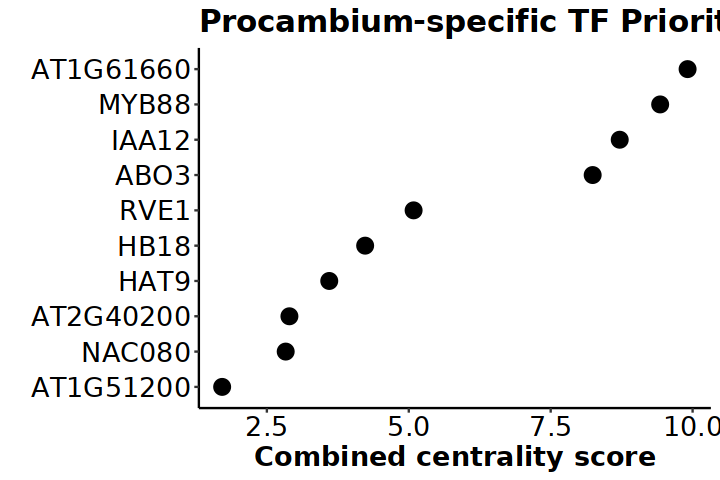

In [227]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(pro_rank[1:10,], aes(x=reorder(GeneName, pro, decreasing = FALSE),  y=pro)) + geom_point(size=4)+ 
  labs(title="Procambium-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [228]:
write.csv(pro_rank,"Procambium_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [229]:
tf_rank <- pro_rank %>% rownames(.)
# Max 30
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_blank(tf_rank[15])

p4 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p5 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p6 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_blank(tf_rank[15])

p7 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p8 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p9 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_blank(tf_rank[15])

In [230]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

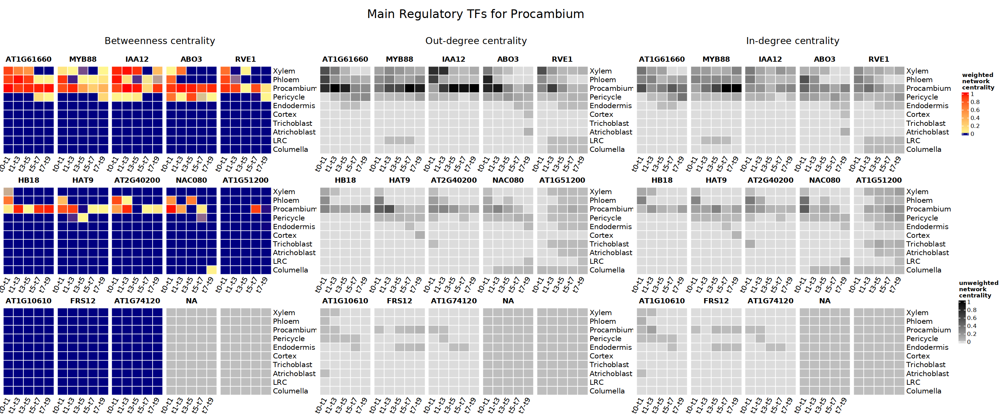

In [231]:
options(repr.plot.width=24, repr.plot.height=10)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Procambium ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,nrow=3),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p4,p5,p6,nrow=3),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p7,p8,p9,nrow=3),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Phloem

In [232]:
phl_rank <- bc_rank[which(bc_rank$phl*2 > bc_rank$all),]%>% arrange(desc(phl))
phl_rank$GeneName <- rownames(phl_rank)

In [233]:
phl_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
APL,14.609318871,0.00000000,0.000000000,0.00000000,0.000000000,0.169637300,1.11060353,0.000000000,13.329078042,0.00000000,0.000000000,AT1G79430,APL
AT3G12730,9.025308271,0.00000000,0.000000000,0.00000000,0.000000000,0.000000000,0.01251256,0.000000000,9.012795710,0.00000000,0.000000000,AT3G12730,AT3G12730
AT2G03500,8.317163951,0.00000000,0.000000000,0.00000000,0.000000000,0.092932605,0.01861757,0.000000000,8.205613779,0.00000000,0.000000000,AT2G03500,AT2G03500
DOF2.4,13.209764619,0.00000000,0.000000000,0.00000000,0.000000000,0.151092484,4.50853801,0.765591862,7.784542259,0.00000000,0.000000000,AT2G37590,DOF2.4
HCA2,7.846192271,0.00000000,0.000000000,0.00000000,0.000000000,0.089558939,0.14943530,0.000000000,7.607198033,0.00000000,0.000000000,AT5G62940,HCA2
AT4G37180,8.352277506,0.00000000,0.000000000,0.00000000,0.029722861,0.369357463,0.31110514,0.098356502,7.455714471,0.07976729,0.008253774,AT4G37180,AT4G37180
NAC020,8.447018279,0.00000000,0.000000000,0.00000000,0.000000000,0.041412518,1.44054230,0.211972030,6.753091429,0.00000000,0.000000000,AT1G54330,NAC020
DOF6,8.501982872,0.00000000,0.000000000,0.00000000,0.000000000,0.034094870,0.32764725,1.414083851,6.726156901,0.00000000,0.000000000,AT3G45610,DOF6
DAR2,8.256303735,0.00000000,0.000000000,0.00000000,0.000000000,0.170725842,1.37175451,0.000000000,6.713823384,0.00000000,0.000000000,AT2G39830,DAR2


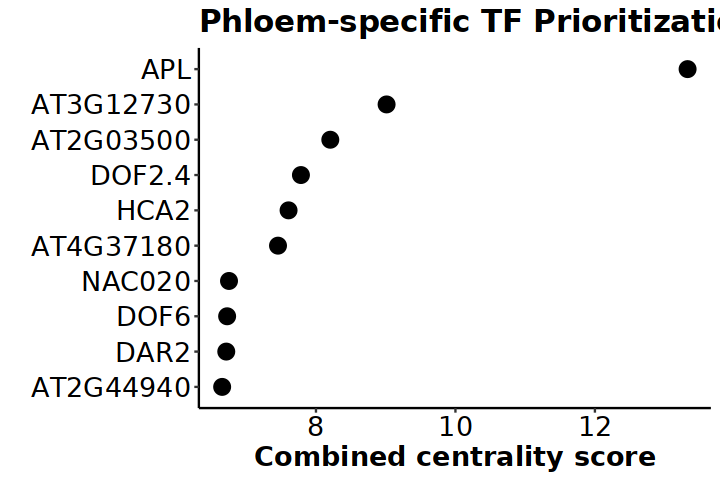

In [234]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(phl_rank[1:10,], aes(x=reorder(GeneName, phl, decreasing = FALSE),  y=phl)) + geom_point(size=4)+ 
  labs(title="Phloem-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [235]:
write.csv(phl_rank,"Phloem_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [236]:
tf_rank <- phl_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [237]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

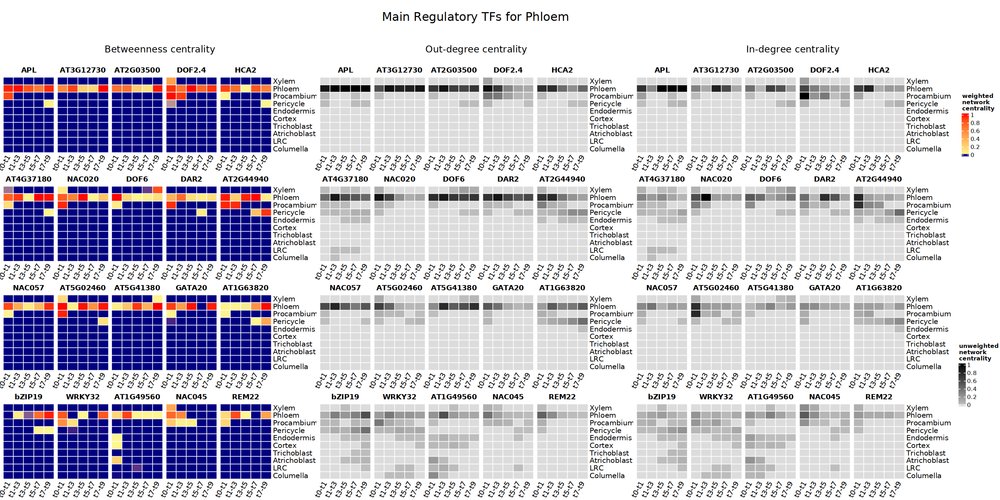

In [238]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Phloem ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Xylem

In [239]:
xyl_rank <- bc_rank[which(bc_rank$xyl*2 > bc_rank$all),]%>% arrange(desc(xyl))
xyl_rank$GeneName <- rownames(xyl_rank)

In [240]:
xyl_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
AT1G68810,17.063919,0.00000000,0.000000000,0.0000000,0.000000000,0.08165321,5.145337642,11.157002,0.67992676,0.000000000,0.00000000,AT1G68810,AT1G68810
DOF2,15.222923,0.00000000,0.000000000,0.0000000,1.142731297,0.00000000,0.110262281,10.647285,0.08692365,0.005533199,3.23018731,AT3G21270,DOF2
MYB46,9.946099,0.00000000,0.000000000,0.0000000,0.000000000,0.00000000,0.000000000,9.946099,0.00000000,0.000000000,0.00000000,AT5G12870,MYB46
VND7,9.855090,0.00000000,0.000000000,0.0000000,0.000000000,0.00000000,0.018704010,9.836386,0.00000000,0.000000000,0.00000000,AT1G71930,VND7
VND2,10.375300,0.00000000,0.000000000,0.0000000,0.000000000,0.00000000,0.560639801,9.593416,0.22124389,0.000000000,0.00000000,AT4G36160,VND2
MYB83,8.984786,0.00000000,0.000000000,0.0000000,0.000000000,0.00000000,0.000000000,8.984786,0.00000000,0.000000000,0.00000000,AT3G08500,MYB83
VND5,8.500834,0.00000000,0.000000000,0.0000000,0.000000000,0.00000000,0.007369229,8.493465,0.00000000,0.000000000,0.00000000,AT1G62700,VND5
XND1,11.066321,0.00000000,0.000000000,0.0000000,0.000000000,0.01688947,1.997901734,8.389225,0.66230437,0.000000000,0.00000000,AT5G64530,XND1
VND1,8.411626,0.00000000,0.000000000,0.0000000,0.000000000,0.00000000,0.027164576,8.384461,0.00000000,0.000000000,0.00000000,AT2G18060,VND1


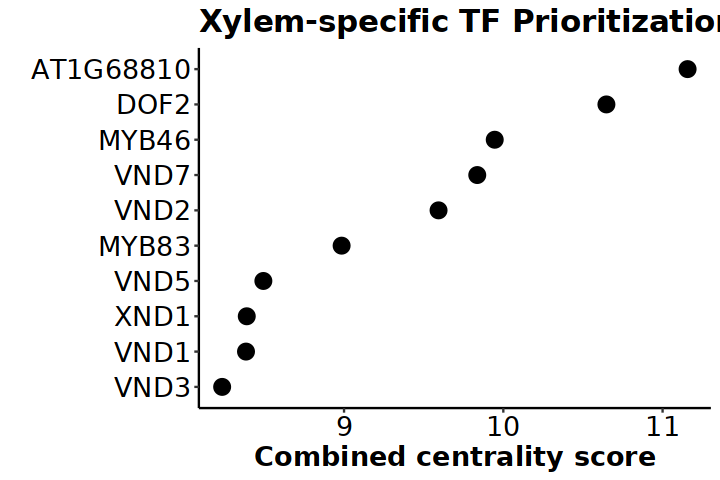

In [241]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(xyl_rank[1:10,], aes(x=reorder(GeneName, xyl, decreasing = FALSE),  y=xyl)) + geom_point(size=4)+ 
  labs(title="Xylem-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [242]:
write.csv(xyl_rank,"Xylem_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [243]:
tf_rank <- xyl_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [244]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

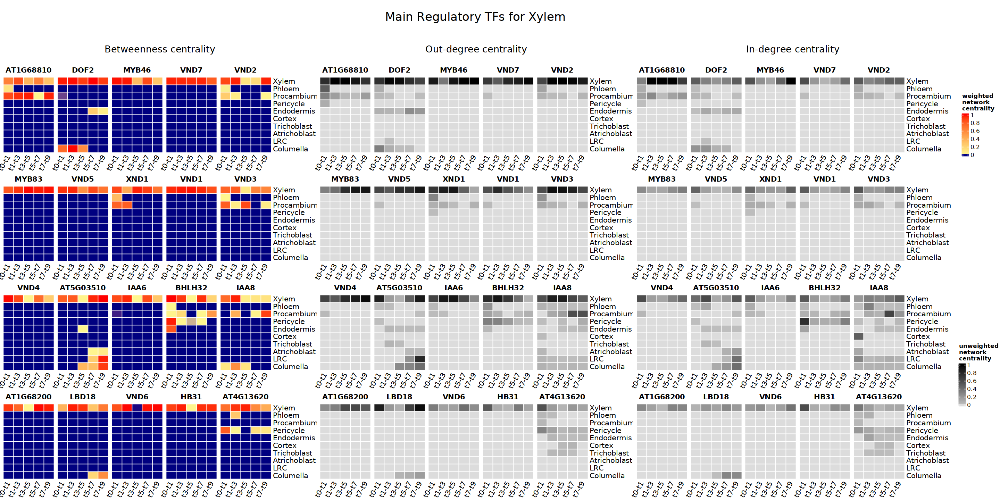

In [245]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Xylem ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## LRC

In [246]:
lrc_rank <- bc_rank[which(bc_rank$lrc*2 > bc_rank$all),]%>% arrange(desc(lrc))
lrc_rank$GeneName <- rownames(lrc_rank)

In [247]:
lrc_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
ARF16,12.0950716,1.18872804,0.22625031,0.33645643,0.027554161,0.000000000,0.00000000,0.000000000,0.00000000,7.5445870,2.771495746,AT4G30080,ARF16
MIF3,8.2345450,0.00000000,0.00000000,0.00000000,0.362226980,0.000000000,0.00000000,0.000000000,0.00000000,4.5448080,3.327510060,AT1G18835,MIF3
OFP6,5.7370542,1.28748706,0.00000000,0.00000000,0.000000000,0.000000000,0.00000000,0.000000000,0.00000000,4.4092282,0.040338972,AT3G52525,OFP6
AT1G68920,7.9078642,0.08594922,0.00000000,0.09890113,0.159415359,0.000000000,0.02936865,0.000000000,0.06845612,4.3273197,3.138453997,AT1G68920,AT1G68920
ARF6,7.0356258,0.34023062,0.00000000,0.83179872,0.025568139,0.102453827,0.03016845,0.012007659,0.00000000,3.7084397,1.984958693,AT1G30330,ARF6
AT1G74840,6.3189942,0.39449532,0.33377213,0.64192249,0.182237084,0.258874442,0.01970890,0.336033911,0.03505829,3.6991153,0.417776294,AT1G74840,AT1G74840
PS1,6.7635642,1.62508853,0.00000000,0.24265219,1.351463399,0.043007414,0.00000000,0.061090339,0.00000000,3.4402623,0.000000000,AT1G34355,PS1
AT1G05805,4.6833400,0.34742020,0.03866828,0.01319699,0.000000000,0.000000000,0.00000000,0.005168063,0.00000000,3.1613170,1.117569481,AT1G05805,AT1G05805
MYB3R-4,3.4926131,0.09540410,0.02417553,0.09236018,0.106512672,0.039449335,0.03402199,0.202288197,0.06203470,2.6981916,0.138174819,AT5G11510,MYB3R-4


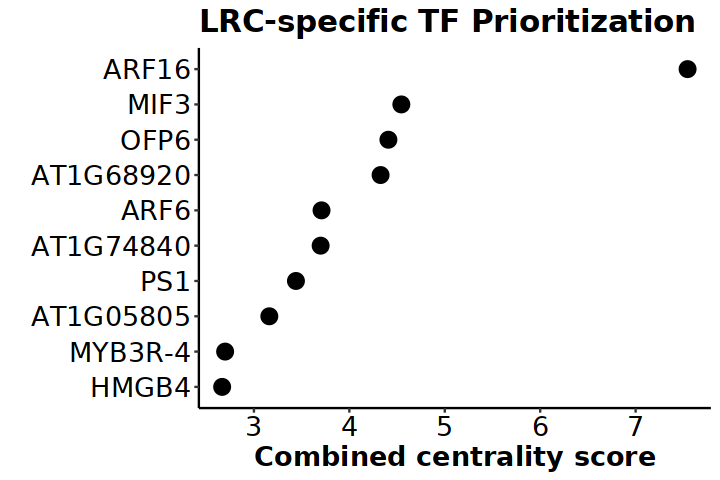

In [248]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(lrc_rank[1:10,], aes(x=reorder(GeneName, lrc, decreasing = FALSE),  y=lrc)) + geom_point(size=4)+ 
  labs(title="LRC-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [249]:
write.csv(lrc_rank,"LRC_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [250]:
tf_rank <- lrc_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [251]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

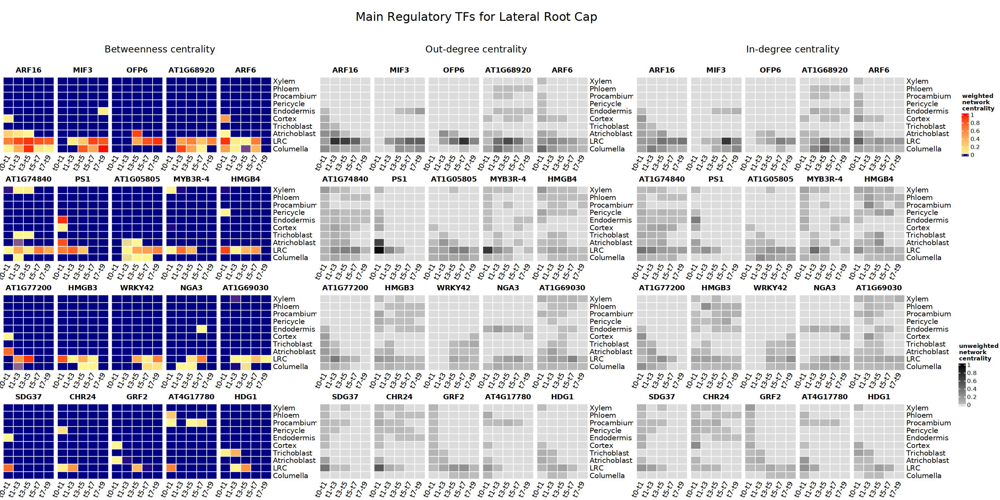

In [252]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Lateral Root Cap ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Columella

In [253]:
col_rank <- bc_rank[which(bc_rank$col*2 > bc_rank$all),]%>% arrange(desc(col))
col_rank$GeneName <- rownames(col_rank)

In [254]:
col_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
IAA20,13.588308,0.10745453,0.000000000,0.696016725,1.856104365,0.031870533,0.00000000,0.08922763,0.00000000,0.77617173,10.031463,AT2G46990,IAA20
NAC042,17.898571,0.01132391,0.000000000,0.036494981,0.000000000,0.000000000,0.00000000,1.33451875,0.00000000,7.48901508,9.027218,AT2G43000,NAC042
NTT,10.295228,0.04833774,0.000000000,0.254229735,0.289057120,0.000000000,0.03025490,1.83925838,0.06624195,0.07987596,7.687972,AT3G57670,NTT
RAP2.1,14.493280,0.15766362,0.000000000,1.586003647,0.076931823,0.110922912,0.00000000,4.34137064,0.00000000,0.95389876,7.266489,AT1G46768,RAP2.1
AT3G52440,8.270872,0.00000000,0.000000000,0.066526983,0.000000000,0.000000000,0.00000000,0.00000000,0.00000000,1.01592556,7.188419,AT3G52440,AT3G52440
AT3G60670,10.858268,0.11105965,0.000000000,1.252688213,1.273003034,1.358361090,0.00000000,0.05930035,0.00000000,0.51137037,6.292485,AT3G60670,AT3G60670
WRKY33,9.821172,0.58635433,0.363985928,0.598834628,0.321301841,0.005903982,0.18906655,0.15253096,0.13432684,1.63949253,5.829374,AT2G38470,WRKY33
FBH4,8.169902,0.06958798,0.050431699,0.139536317,0.018072134,0.000000000,0.00000000,0.00000000,0.00000000,2.15983352,5.732440,AT2G42280,FBH4
LBD41,11.083193,0.22420917,0.078341998,0.048795815,0.072010563,0.012921525,0.62329764,0.85063060,0.26662565,3.35964330,5.546717,AT3G02550,LBD41


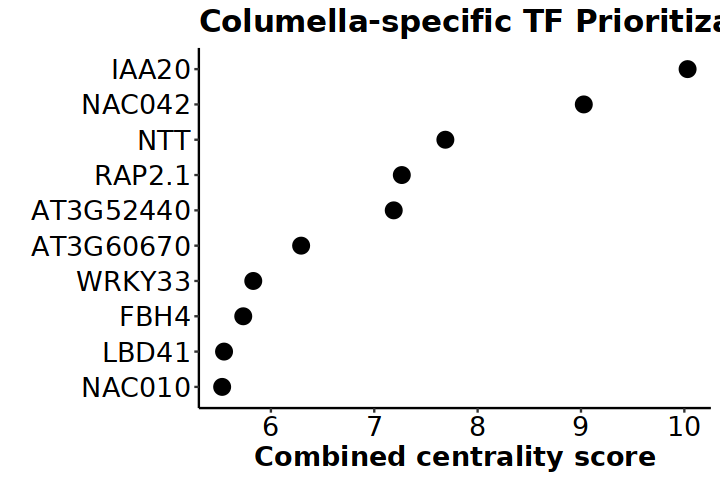

In [255]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(col_rank[1:10,], aes(x=reorder(GeneName, col, decreasing = FALSE),  y=col)) + geom_point(size=4)+ 
  labs(title="Columella-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [256]:
write.csv(col_rank,"Columella_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [257]:
tf_rank <- col_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [258]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

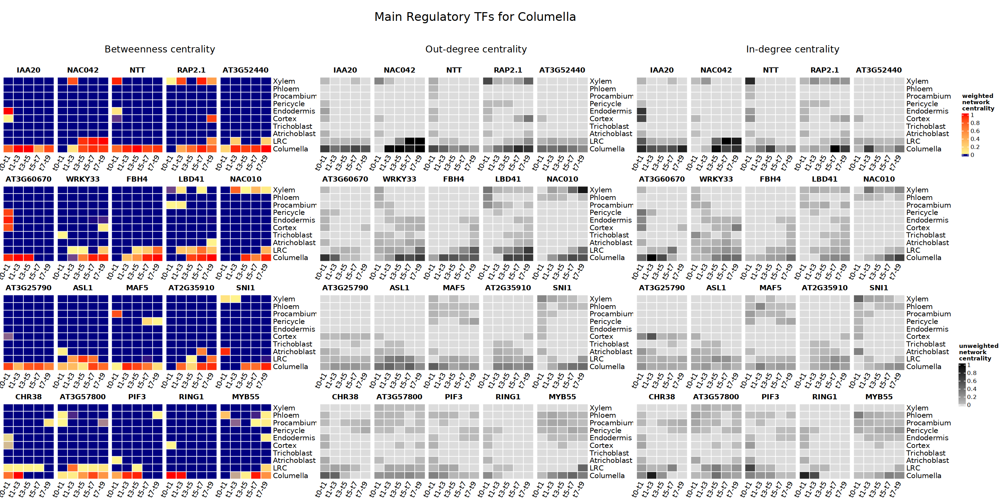

In [259]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Columella ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Add tissue level

In [260]:
bc_rank <- bc_rank %>% mutate(ground=cor+end, epi=atri+tri, stele=per+pro+xyl+phl, epilrc=atri+tri+lrc, rc=lrc+col)

In [261]:
head(bc_rank)

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
BZIP9,29.19444,0.000000,0.000000,0.000000,0.01983748,9.05092129,8.8677625,0.05687082,11.19905212,0.00000,0.00000000,AT5G24800,0.01983748,0.00000,29.174607,0.00000,0.00000000
AT3G43430,34.91987,0.000000,0.000000,0.000000,0.01684128,12.12719380,9.5079047,4.47480476,8.79312886,0.00000,0.00000000,AT3G43430,0.01684128,0.00000,34.903032,0.00000,0.00000000
GATA2,32.60274,6.876734,5.844258,1.938035,2.47836267,0.03634172,0.1234438,0.02555554,0.02737594,11.82659,3.42603973,AT2G45050,4.41639739,12.72099,0.212717,24.54758,15.25262898
LEP,34.89938,4.738138,5.608289,0.000000,5.48517444,11.78585516,4.1985151,0.14260467,2.92113981,0.00000,0.01966089,AT5G13910,5.48517444,10.34643,19.048115,10.34643,0.01966089
MYB20,30.03240,0.000000,0.000000,0.000000,0.31968431,10.63089110,10.9812467,4.08713837,4.01344128,0.00000,0.00000000,AT1G66230,0.31968431,0.00000,29.712717,0.00000,0.00000000
OBP2,20.54627,0.000000,0.000000,0.000000,0.00000000,5.48240701,5.4416662,0.00000000,9.62219734,0.00000,0.00000000,AT1G07640,0.00000000,0.00000,20.546271,0.00000,0.00000000


## Ground Tissue

In [262]:
ground_rank <- bc_rank[which(bc_rank$ground*2 > bc_rank$all),]%>% arrange(desc(ground))
ground_rank <- ground_rank[-c(match(rownames(cor_rank), rownames(ground_rank)),match(rownames(end_rank), rownames(ground_rank))),]
ground_rank$GeneName <- rownames(ground_rank)

In [263]:
ground_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
MYB12,20.58663716,0.956650814,0.152088811,7.632693838,4.32108625,2.091767607,0.823233027,4.21278373,0.153946888,0.179971581,0.062414612,AT2G47460,11.953780085,1.108739625,7.28173125,1.288711206,0.24238619,MYB12
HAT7,21.68650217,6.569320450,4.153170649,6.497192828,4.44035601,0.000000000,0.026462230,0.00000000,0.000000000,0.000000000,0.000000000,AT5G15150,10.937548841,10.722491099,0.02646223,10.722491099,0.00000000,HAT7
SOM,15.20436442,1.470622061,0.000000000,2.974118902,6.31254015,3.126291892,1.003600964,0.00000000,0.109549976,0.006243032,0.201397440,AT1G03790,9.286659050,1.470622061,4.23944283,1.476865093,0.20764047,SOM
ARR3,8.84090365,1.569981724,0.045255081,3.000398755,1.87791425,0.711521340,0.415393560,0.00000000,0.034270536,0.031624113,1.154544284,AT1G59940,4.878313010,1.615236806,1.16118544,1.646860919,1.18616840,ARR3
AN3,8.51330058,1.608248119,0.000000000,1.810969625,2.99898154,1.252108625,0.526894128,0.00000000,0.191231544,0.124867001,0.000000000,AT5G28640,4.809951163,1.608248119,1.97023430,1.733115120,0.12486700,AN3
AT3G56230,9.43335659,1.242315834,0.044789643,2.177459518,2.62016038,0.000000000,0.000000000,1.30541492,0.000000000,1.829069983,0.214146309,AT3G56230,4.797619896,1.287105477,1.30541492,3.116175460,2.04321629,AT3G56230
ULT1,7.63848239,1.574176264,0.000000000,2.915465274,1.21364407,1.464869415,0.006337322,0.11751876,0.000000000,0.172997668,0.173473621,AT4G28190,4.129109344,1.574176264,1.58872550,1.747173932,0.34647129,ULT1
HSFB4,7.51302858,2.485015266,0.000000000,1.587271396,2.25136850,0.565386527,0.494844814,0.00000000,0.129142077,0.000000000,0.000000000,AT1G46264,3.838639896,2.485015266,1.18937342,2.485015266,0.00000000,HSFB4
AT5G57150,5.22581608,0.280104880,0.000000000,0.952341853,2.05779348,0.936602708,0.295350991,0.00000000,0.562003303,0.083651300,0.057967564,AT5G57150,3.010135337,0.280104880,1.79395700,0.363756180,0.14161886,AT5G57150


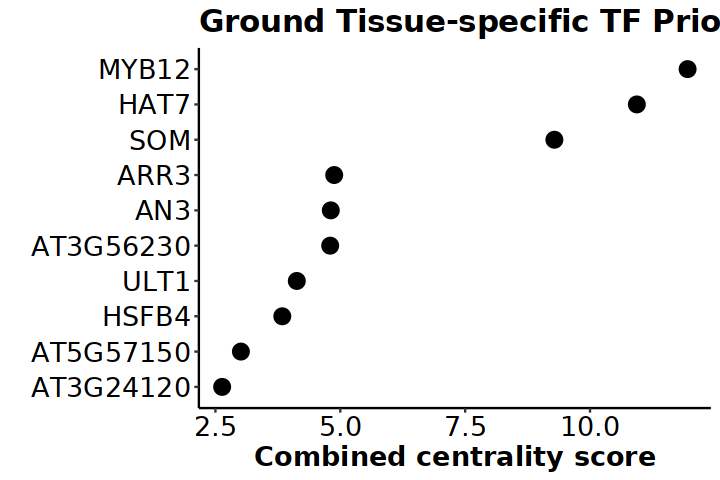

In [264]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(ground_rank[1:10,], aes(x=reorder(GeneName, ground, decreasing = FALSE),  y=ground)) + geom_point(size=4)+ 
  labs(title="Ground Tissue-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [265]:
write.csv(ground_rank,"Ground_Tissue_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [266]:
tf_rank <- ground_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [267]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

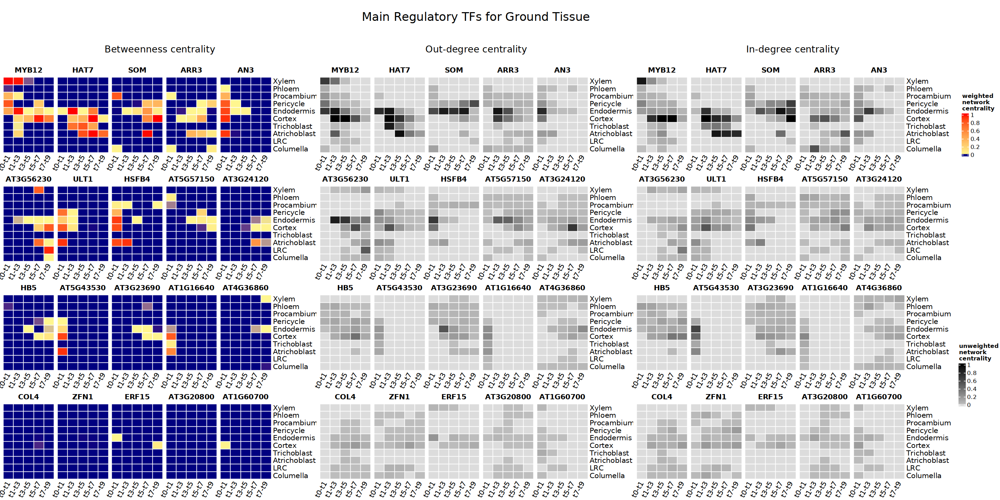

In [268]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Ground Tissue ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Epidermis

In [269]:
epi_rank <- bc_rank[which(bc_rank$epi*2 > bc_rank$all),]%>% arrange(desc(epi))
epi_rank <- epi_rank[-c(match(rownames(atri_rank), rownames(epi_rank)),match(rownames(tri_rank), rownames(epi_rank))),]
epi_rank$GeneName <- rownames(epi_rank)

In [270]:
epi_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
WRKY75,17.3137141,5.48442845,6.37997623,1.094587355,0.005012539,0.000000000,0.000000000,0.01547734,0.000000000,0.00000000,4.334232198,AT5G13080,1.09959989,11.8644047,0.015477341,11.8644047,4.33423220,WRKY75
KDR,13.2479881,4.77198535,6.47536038,1.767663806,0.232978578,0.000000000,0.000000000,0.00000000,0.000000000,0.00000000,0.000000000,AT1G26945,2.00064238,11.2473457,0.000000000,11.2473457,0.00000000,KDR
ATS,15.5726439,3.98176392,4.46301144,1.260592779,1.768128428,0.000000000,0.000000000,0.00000000,0.000000000,3.77163292,0.327514456,AT5G42630,3.02872121,8.4447754,0.000000000,12.2164083,4.09914738,ATS
IAA14,12.6469056,4.34804559,3.18817695,2.176120062,0.000000000,0.708571499,0.152808737,0.07436741,0.007428925,1.96815612,0.023230326,AT4G14550,2.17612006,7.5362225,0.943176568,9.5043787,1.99138645,IAA14
ARR5,9.0789020,4.49052784,2.27129374,0.385290112,0.089170205,0.005098190,0.221600554,0.24092141,0.138903720,0.78827153,0.447824687,AT3G48100,0.47446032,6.7618216,0.606523871,7.5500931,1.23609622,ARR5
TGA10,11.1820639,5.47581644,1.18839943,2.826826390,1.675499784,0.000000000,0.000000000,0.00000000,0.000000000,0.01204013,0.003481673,AT5G06839,4.50232617,6.6642159,0.000000000,6.6762560,0.01552181,TGA10
AT2G37120,8.7008660,3.05738235,3.08094433,0.756358586,0.249492802,0.490249603,0.193194649,0.72332523,0.138036975,0.01188147,0.000000000,AT2G37120,1.00585139,6.1383267,1.544806460,6.1502082,0.01188147,AT2G37120
WRKY72,11.4985672,1.50070259,4.63247532,0.000000000,0.000000000,0.000000000,0.000000000,0.00000000,0.000000000,3.49531485,1.870074408,AT5G15130,0.00000000,6.1331779,0.000000000,9.6284928,5.36538926,WRKY72
ATHB13,10.9507213,2.03069623,3.75438011,1.708549990,2.010370947,1.005427385,0.267747951,0.00000000,0.052354396,0.00000000,0.121194254,AT1G69780,3.71892094,5.7850763,1.325529732,5.7850763,0.12119425,ATHB13


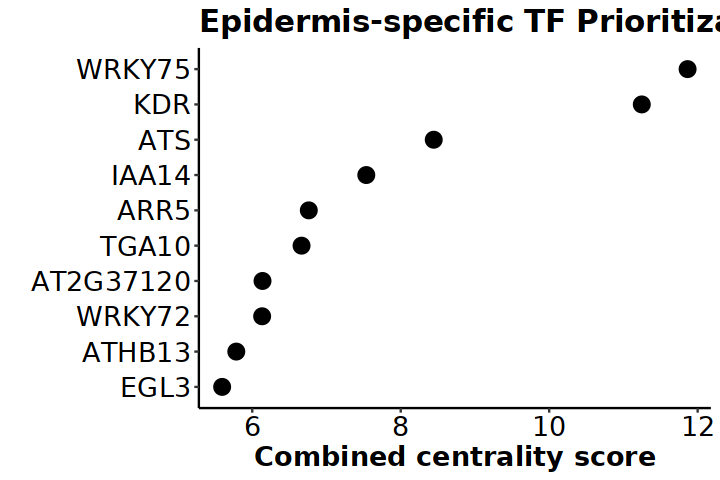

In [271]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(epi_rank[1:10,], aes(x=reorder(GeneName, epi, decreasing = FALSE),  y=epi)) + geom_point(size=4)+ 
  labs(title="Epidermis-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [272]:
write.csv(epi_rank,"Epidermis_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [273]:
tf_rank <- epi_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [274]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

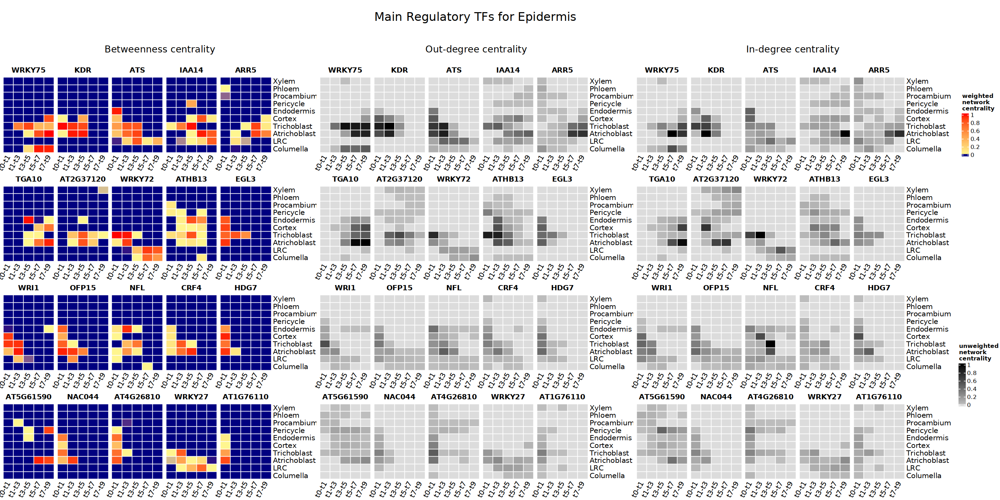

In [275]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Epidermis ", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Epidermis + LRC

In [276]:
epilrc_rank <- bc_rank[which(bc_rank$epilrc*2 > bc_rank$all),]%>% arrange(desc(epilrc))
epilrc_rank <- epilrc_rank[-c(match(rownames(atri_rank), rownames(epilrc_rank)),match(rownames(tri_rank), rownames(epilrc_rank)),match(rownames(lrc_rank), rownames(epilrc_rank))),]
epilrc_rank$GeneName <- rownames(epilrc_rank)

In [277]:
epilrc_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
GATA2,32.60274,6.8767338,5.8442579,1.9380347,2.478362673,0.03634172,0.12344377,0.02555554,0.027375945,11.826589,3.42603973,AT2G45050,4.4163974,12.7209917,0.21271697,24.547581,15.252629,GATA2
BT2,24.62512,3.6324323,1.1102322,0.2931351,0.029871855,0.00000000,0.00000000,0.02836394,0.000000000,11.334815,8.19626518,AT3G48360,0.3230069,4.7426645,0.02836394,16.077479,19.531080,BT2
WER,21.56819,4.2519322,2.6099449,1.5113967,2.401269110,0.11513015,0.00000000,0.00000000,0.000000000,8.516907,2.16161412,AT5G14750,3.9126658,6.8618771,0.11513015,15.378784,10.678521,WER
NAI1,23.01590,3.5954146,0.9426660,0.2911109,0.099846879,0.00000000,0.00000000,0.03480724,0.000000000,9.114967,8.93708230,AT2G22770,0.3909578,4.5380806,0.03480724,13.653048,18.052049,NAI1
CRF3,21.97712,2.3588840,2.3367416,0.5017725,1.740671622,1.00570468,0.10547801,0.00000000,0.120318333,8.713660,5.09389294,AT5G53290,2.2424441,4.6956256,1.23150102,13.409286,13.807553,CRF3
WRKY17,18.32451,3.3287603,2.8638731,1.5999619,0.911767702,0.09181357,0.10100814,1.36508204,0.174774268,7.192677,0.69479190,AT2G24570,2.5117296,6.1926334,1.73267802,13.385311,7.887469,WRKY17
CRF2,24.48926,2.8611439,1.7348995,2.3187351,1.991696826,1.61858152,0.09880570,1.16485839,1.533178032,8.344904,2.82245557,AT4G23750,4.3104319,4.5960434,4.41542364,12.940947,11.167360,CRF2
ATS,15.57264,3.9817639,4.4630114,1.2605928,1.768128428,0.00000000,0.00000000,0.00000000,0.000000000,3.771633,0.32751446,AT5G42630,3.0287212,8.4447754,0.00000000,12.216408,4.099147,ATS
AT1G36060,23.06258,4.4237248,1.2039815,1.6503947,0.173598751,0.00000000,0.00000000,0.06677439,0.000000000,6.478396,9.06570848,AT1G36060,1.8239934,5.6277063,0.06677439,12.106102,15.544104,AT1G36060


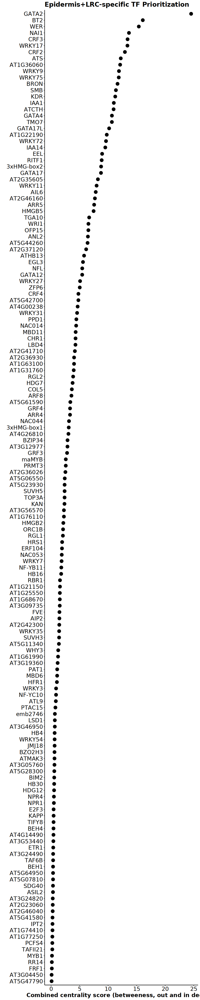

In [278]:
options(repr.plot.width=8, repr.plot.height=40)
ggplot(epilrc_rank, aes(x=reorder(GeneName, epilrc, decreasing = FALSE),  y=epilrc)) + geom_point(size=4)+ 
  labs(title="Epidermis+LRC-specific TF Prioritization",x="", y = "Combined centrality score (betweeness, out and in degree)")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [279]:
write.csv(epilrc_rank,"Epidermis_LRC_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [280]:
tf_rank <- epilrc_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [281]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

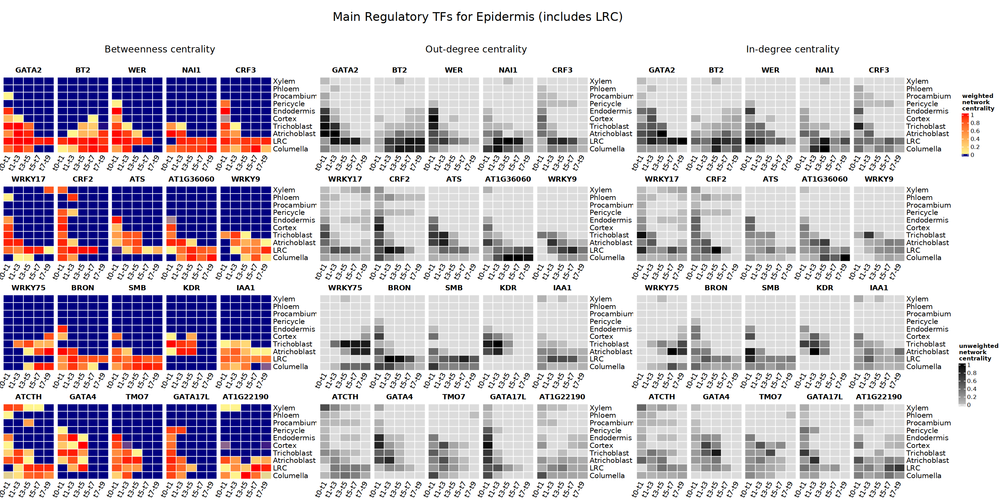

In [282]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Epidermis (includes LRC)", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Stele

In [283]:
stele_rank <- bc_rank[which(bc_rank$stele*2 > bc_rank$all),]%>% arrange(desc(stele))
stele_rank <- stele_rank[-c(match(rownames(per_rank), rownames(stele_rank)),match(rownames(pro_rank), rownames(stele_rank)),match(rownames(xyl_rank), rownames(stele_rank)),match(rownames(phl_rank), rownames(stele_rank))),]
stele_rank$GeneName <- rownames(stele_rank)

In [284]:
stele_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
AT3G43430,34.91987,0.00000000,0.000000000,0.00000000,0.016841283,12.12719380,9.507905,4.47480476,8.7931289,0.000000000,0.00000000,AT3G43430,0.016841283,0.00000000,34.90303,0.000000000,0.00000000,AT3G43430
MYB20,30.03240,0.00000000,0.000000000,0.00000000,0.319684315,10.63089110,10.981247,4.08713837,4.0134413,0.000000000,0.00000000,AT1G66230,0.319684315,0.00000000,29.71272,0.000000000,0.00000000,MYB20
BZIP9,29.19444,0.00000000,0.000000000,0.00000000,0.019837480,9.05092129,8.867763,0.05687082,11.1990521,0.000000000,0.00000000,AT5G24800,0.019837480,0.00000000,29.17461,0.000000000,0.00000000,BZIP9
AT1G29160,26.54555,0.01902631,0.000000000,0.00000000,0.000000000,6.79408747,7.762429,0.01525082,7.8463015,3.056753223,1.05170007,AT1G29160,0.000000000,0.01902631,22.41807,3.075779533,4.10845329,AT1G29160
AT3G60490,21.85674,0.00000000,0.000000000,0.00000000,0.000000000,8.08244563,5.554085,0.14141893,8.0292191,0.000000000,0.04957311,AT3G60490,0.000000000,0.00000000,21.80717,0.000000000,0.04957311,AT3G60490
AT2G34140,32.72309,0.04724803,0.000000000,0.25521355,1.135486766,8.75993314,6.877722,0.42124328,5.3896828,3.379574589,6.45698638,AT2G34140,1.390700317,0.04724803,21.44858,3.426822616,9.83656097,AT2G34140
MYB43,21.35556,0.00000000,0.000000000,0.01182391,0.003006310,8.23756692,9.810498,0.19019593,3.1024648,0.000000000,0.00000000,AT5G16600,0.014830225,0.00000000,21.34073,0.000000000,0.00000000,MYB43
HAT2,32.68893,0.23599606,0.000000000,3.08490829,8.045560446,8.80783792,4.077204,3.65164416,4.7228737,0.000000000,0.06290083,AT5G47370,11.130468731,0.23599606,21.25956,0.235996065,0.06290083,HAT2
BT1,21.06198,0.00000000,0.000000000,0.18553998,0.275729783,5.21780895,6.907699,6.05818042,2.4170262,0.000000000,0.00000000,AT5G63160,0.461269760,0.00000000,20.60071,0.000000000,0.00000000,BT1


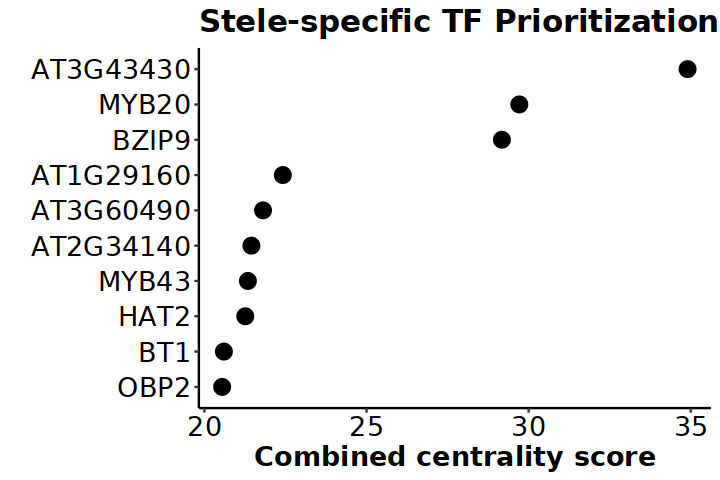

In [285]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(stele_rank[1:10,], aes(x=reorder(GeneName, stele, decreasing = FALSE),  y=stele)) + geom_point(size=4)+ 
  labs(title="Stele-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [286]:
write.csv(stele_rank,"Stele_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [287]:
tf_rank <- stele_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [288]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

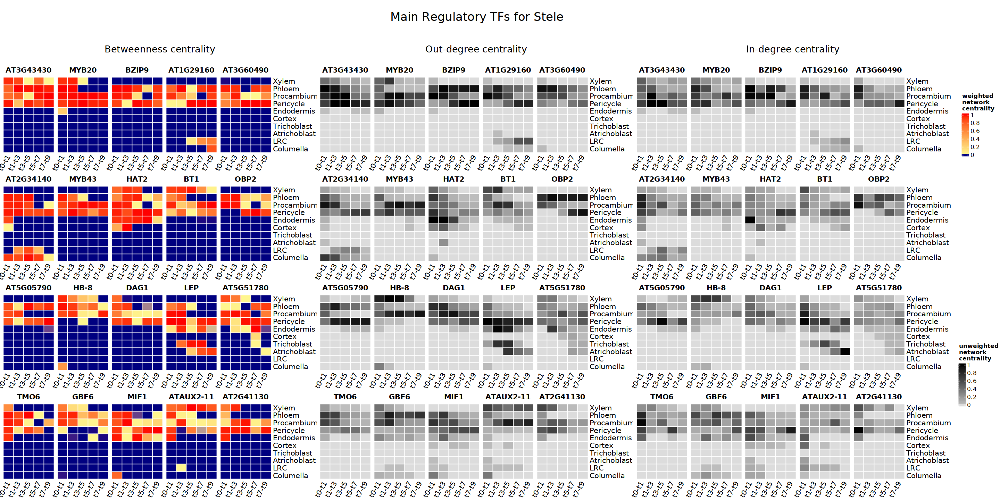

In [289]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Stele", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))

## Root Cap

In [290]:
rc_rank <- bc_rank[which(bc_rank$rc*2 > bc_rank$all),]%>% arrange(desc(rc))
rc_rank <- rc_rank[-c(match(rownames(lrc_rank), rownames(rc_rank)),match(rownames(col_rank), rownames(rc_rank))),]
rc_rank$GeneName <- rownames(rc_rank)

In [291]:
rc_rank

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
BT2,24.62512,3.63243231,1.11023217,0.29313509,0.02987186,0.00000000,0.00000000,0.02836394,0.000000000,11.334815,8.196265,AT3G48360,0.32300695,4.74266448,0.02836394,16.077479,19.531080,BT2
NAI1,23.01590,3.59541458,0.94266601,0.29111093,0.09984688,0.00000000,0.00000000,0.03480724,0.000000000,9.114967,8.937082,AT2G22770,0.39095781,4.53808059,0.03480724,13.653048,18.052049,NAI1
LBD15,19.76810,0.07609731,0.00000000,0.00000000,0.00000000,0.00000000,0.00000000,2.40501651,0.000000000,9.390180,7.896803,AT2G40470,0.00000000,0.07609731,2.40501651,9.466278,17.286983,LBD15
SMB,20.51296,2.60418556,0.00000000,1.68861519,0.21402041,0.00000000,0.00000000,0.00000000,0.000000000,8.761212,7.244931,AT1G79580,1.90263560,2.60418556,0.00000000,11.365398,16.006143,SMB
AT1G36060,23.06258,4.42372479,1.20398150,1.65039467,0.17359875,0.00000000,0.00000000,0.06677439,0.000000000,6.478396,9.065708,AT1G36060,1.82399342,5.62770628,0.06677439,12.106102,15.544104,AT1G36060
AIL6,15.27031,0.41155982,0.00000000,0.29413650,0.17894253,0.07861256,0.00000000,0.05208743,0.000000000,7.417725,6.837246,AT5G10510,0.47307903,0.41155982,0.13069999,7.829285,14.254971,AIL6
CRF3,21.97712,2.35888401,2.33674161,0.50177245,1.74067162,1.00570468,0.10547801,0.00000000,0.120318333,8.713660,5.093893,AT5G53290,2.24244407,4.69562562,1.23150102,13.409286,13.807553,CRF3
BRON,19.43391,3.19499965,0.12943552,1.36769378,1.56110729,0.03950412,0.00000000,0.00000000,0.000000000,8.324952,4.816220,AT1G75710,2.92880107,3.32443516,0.03950412,11.649387,13.141172,BRON
PLT1,22.45757,3.59503298,0.00000000,2.35070851,2.47832175,0.15184049,0.05937524,0.86518002,0.000000000,6.550585,6.406522,AT3G20840,4.82903026,3.59503298,1.07639575,10.145618,12.957106,PLT1


In [292]:
rc_rank[1:50,]

,all,atri,tri,cor,end,per,pro,xyl,phl,lrc,col,GeneID,ground,epi,stele,epilrc,rc,GeneName
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
BT2,24.625115,3.63243231,1.11023217,0.29313509,0.02987186,0.000000000,0.00000000,0.02836394,0.000000000,11.334815,8.196265,AT3G48360,0.32300695,4.74266448,0.02836394,16.077479,19.531080,BT2
NAI1,23.015895,3.59541458,0.94266601,0.29111093,0.09984688,0.000000000,0.00000000,0.03480724,0.000000000,9.114967,8.937082,AT2G22770,0.39095781,4.53808059,0.03480724,13.653048,18.052049,NAI1
LBD15,19.768097,0.07609731,0.00000000,0.00000000,0.00000000,0.000000000,0.00000000,2.40501651,0.000000000,9.390180,7.896803,AT2G40470,0.00000000,0.07609731,2.40501651,9.466278,17.286983,LBD15
SMB,20.512964,2.60418556,0.00000000,1.68861519,0.21402041,0.000000000,0.00000000,0.00000000,0.000000000,8.761212,7.244931,AT1G79580,1.90263560,2.60418556,0.00000000,11.365398,16.006143,SMB
AT1G36060,23.062578,4.42372479,1.20398150,1.65039467,0.17359875,0.000000000,0.00000000,0.06677439,0.000000000,6.478396,9.065708,AT1G36060,1.82399342,5.62770628,0.06677439,12.106102,15.544104,AT1G36060
AIL6,15.270310,0.41155982,0.00000000,0.29413650,0.17894253,0.078612562,0.00000000,0.05208743,0.000000000,7.417725,6.837246,AT5G10510,0.47307903,0.41155982,0.13069999,7.829285,14.254971,AIL6
CRF3,21.977124,2.35888401,2.33674161,0.50177245,1.74067162,1.005704681,0.10547801,0.00000000,0.120318333,8.713660,5.093893,AT5G53290,2.24244407,4.69562562,1.23150102,13.409286,13.807553,CRF3
BRON,19.433912,3.19499965,0.12943552,1.36769378,1.56110729,0.039504121,0.00000000,0.00000000,0.000000000,8.324952,4.816220,AT1G75710,2.92880107,3.32443516,0.03950412,11.649387,13.141172,BRON
PLT1,22.457565,3.59503298,0.00000000,2.35070851,2.47832175,0.151840493,0.05937524,0.86518002,0.000000000,6.550585,6.406522,AT3G20840,4.82903026,3.59503298,1.07639575,10.145618,12.957106,PLT1


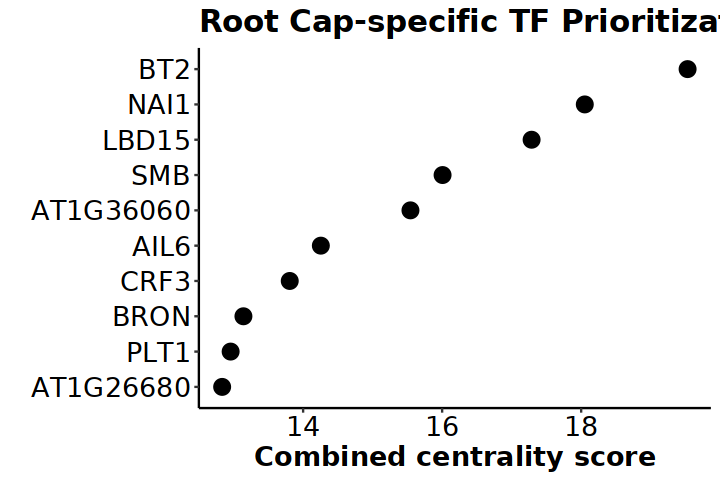

In [293]:
options(repr.plot.width=6, repr.plot.height=4)
ggplot(rc_rank[1:10,], aes(x=reorder(GeneName, rc, decreasing = FALSE),  y=rc)) + geom_point(size=4)+ 
  labs(title="Root Cap-specific TF Prioritization",x="", y = "Combined centrality score")+
  theme_classic()+
  theme(axis.text.x = element_text(color = "black", 
                           size = 16, angle = 0),
          axis.text.y = element_text( color = "black", 
                           size = 16, angle = 0),
        plot.title = element_text(color="black", size=18, face="bold"),
        axis.title.x = element_text(color="black", size=16, face="bold"))+ coord_flip()

In [294]:
write.csv(rc_rank,"Root_Cap_TF_centrality_all_transition_zscore3.csv", quote=FALSE, row.names=TRUE)

In [295]:
tf_rank <- rc_rank %>% rownames(.)
# Max 20
p1 <- plot_bc(tf_rank[1]) + plot_bc(tf_rank[2]) + plot_bc(tf_rank[3]) + plot_bc(tf_rank[4]) + plot_bc(tf_rank[5])
p2 <- plot_bc(tf_rank[6]) + plot_bc(tf_rank[7]) + plot_bc(tf_rank[8]) + plot_bc(tf_rank[9]) + plot_bc(tf_rank[10])
p3 <- plot_bc(tf_rank[11]) + plot_bc(tf_rank[12]) + plot_bc(tf_rank[13]) + plot_bc(tf_rank[14]) + plot_bc(tf_rank[15])
p4 <- plot_bc(tf_rank[16]) + plot_bc(tf_rank[17]) + plot_bc(tf_rank[18]) + plot_bc(tf_rank[19]) + plot_bc(tf_rank[20])

p5 <- plot_oc(tf_rank[1]) + plot_oc(tf_rank[2]) + plot_oc(tf_rank[3]) + plot_oc(tf_rank[4]) + plot_oc(tf_rank[5])
p6 <- plot_oc(tf_rank[6]) + plot_oc(tf_rank[7]) + plot_oc(tf_rank[8]) + plot_oc(tf_rank[9]) + plot_oc(tf_rank[10])
p7 <- plot_oc(tf_rank[11]) + plot_oc(tf_rank[12]) + plot_oc(tf_rank[13]) + plot_oc(tf_rank[14]) + plot_oc(tf_rank[15])
p8 <- plot_oc(tf_rank[16]) + plot_oc(tf_rank[17]) + plot_oc(tf_rank[18]) + plot_oc(tf_rank[19]) + plot_oc(tf_rank[20])

p9 <- plot_ic(tf_rank[1]) + plot_ic(tf_rank[2]) + plot_ic(tf_rank[3]) + plot_ic(tf_rank[4]) + plot_ic(tf_rank[5])
p10 <- plot_ic(tf_rank[6]) + plot_ic(tf_rank[7]) + plot_ic(tf_rank[8]) + plot_ic(tf_rank[9]) + plot_ic(tf_rank[10])
p11 <- plot_ic(tf_rank[11]) + plot_ic(tf_rank[12]) + plot_ic(tf_rank[13]) + plot_ic(tf_rank[14]) + plot_ic(tf_rank[15])
p12 <- plot_ic(tf_rank[16]) + plot_ic(tf_rank[17]) + plot_ic(tf_rank[18]) + plot_ic(tf_rank[19]) + plot_ic(tf_rank[20])

In [296]:
p1 <- grid.grabExpr(draw(p1))
p2 <- grid.grabExpr(draw(p2))
p3 <- grid.grabExpr(draw(p3))
p4 <- grid.grabExpr(draw(p4))
p5 <- grid.grabExpr(draw(p5))
p6 <- grid.grabExpr(draw(p6))
p7 <- grid.grabExpr(draw(p7))
p8 <- grid.grabExpr(draw(p8))
p9 <- grid.grabExpr(draw(p9))
p10 <- grid.grabExpr(draw(p10))
p11 <- grid.grabExpr(draw(p11))
p12 <- grid.grabExpr(draw(p12))
col_fun = colorRamp2(c(0, 0.001, 1), c('navy',"khaki1", "red"))
legend_grob1 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "weighted\nnetwork\ncentrality")))
col_fun = colorRamp2(c(0, 0.001, 1), c('gainsboro', "grey", "black"))
legend_grob2 <- grid.grabExpr(draw(Legend(col_fun = col_fun, title = "unweighted\nnetwork\ncentrality")))

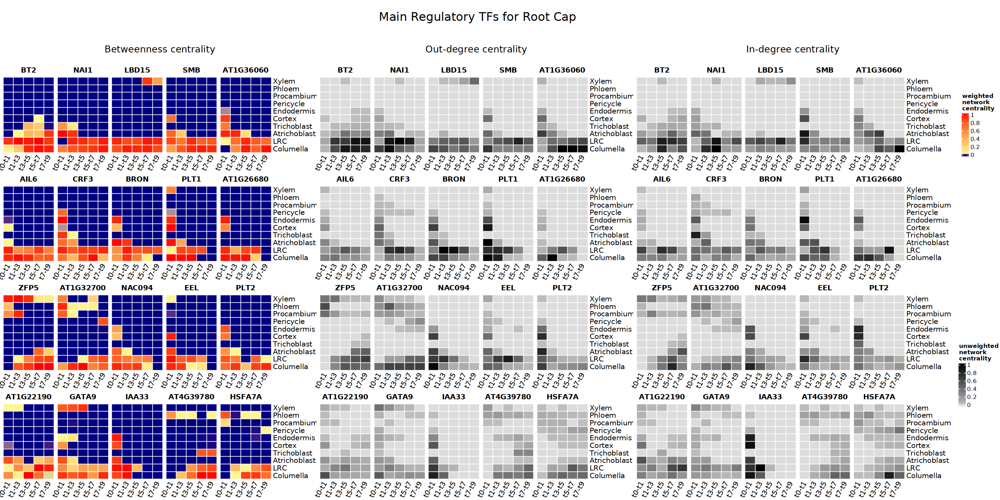

In [297]:
options(repr.plot.width=24, repr.plot.height=12)
plot_grid(plot_grid(textbox_grob("Main Regulatory TFs for Root Cap", gp = gpar(fontsize = 20, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),
          plot_grid(plot_grid(textbox_grob("Betweenness centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p1,p2,p3,p4,nrow=4),nrow=2,rel_heights = c(1, 14))
                    ,plot_grid(textbox_grob("Out-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p5,p6,p7,p8,nrow=4),nrow=2,rel_heights=c(1,14))
                    ,plot_grid(textbox_grob("In-degree centrality", gp = gpar(fontsize = 16, col='black'), background_gp = gpar(fill = "#FFFFFF", col = NA)),plot_grid(p9,p10,p11,p12,nrow=4),nrow=2,rel_heights=c(1,14)),nrow=1),nrow=2,rel_heights = c(1, 14)),plot_grid(legend_grob1,legend_grob2,nrow=2), rel_widths = c(19, 1))